# 모듈을 모으자!!

In [86]:
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import koreanize_matplotlib
import matplotlib.dates as mdates
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FuncFormatter
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as ticker
from scipy.interpolate import make_interp_spline
import seaborn as sns
from datetime import timedelta
%matplotlib inline

<h1>mysql</h1>

In [87]:
import mysql.connector
mydb_aws = mysql.connector.connect(
    host = "database-2.clkyg8gmk522.ap-northeast-2.rds.amazonaws.com",
    port = 3306,
    user = 'root',
    password = 'zmrpdnTwk17!',
    database = "projectHoneyjam"
)
cursor = mydb_aws.cursor(buffered=True)

<h1>koreanMovies AND marvelMovies  SQL문</h1> 
<h3>한국에 개봉된 마블 영화 날짜</h3>

In [88]:
query_one = "SELECT * FROM koreanMovies WHERE date BETWEEN '2008-01-01' AND '2019-12-31'"
koreanMovies = pd.read_sql(query_one, mydb_aws)

query_two = """SELECT title, date
FROM koreanMovies
WHERE (title = '아이언맨' AND date = '2008-04-30')
   OR (title = '인크레더블 헐크' AND date = '2008-06-12')
   OR (title = '아이언맨 2' AND date = '2010-04-29')
   OR (title =  '토르: 천둥의 신' AND date = '2011-04-28')
   OR (title = '퍼스트 어벤져' AND date = '2011-07-28')
   OR (title = '어벤져스' AND date = '2012-04-26')
   OR (title = '아이언맨 3' AND date = '2013-04-25')
   OR (title = '토르: 다크 월드' AND date = '2013-10-30')
   OR (title = '캡틴 아메리카: 윈터 솔져' AND date = '2014-03-26')
   OR (title = '가디언즈 오브 갤럭시' AND date = '2014-07-31')
   OR (title = '어벤져스: 에이지 오브 울트론' AND date = '2015-04-23')
   OR (title = '앤트맨' AND date = '2015-09-03')
   OR (title = '캡틴 아메리카: 시빌 워' AND date = '2016-04-27')
   OR (title = '닥터 스트레인지' AND date = '2016-10-26')
   OR (title = '가디언즈 오브 갤럭시 Vol. 2' AND date = '2017-05-03')
   OR (title = '스파이더맨: 홈 커밍' AND date = '2017-07-05')
   OR (title = '토르: 라그나로크' AND date = '2017-10-25')
   OR (title = '블랙 팬서' AND date = '2018-02-14')
   OR (title = '어벤져스: 인피니티 워' AND date = '2018-04-25')
   OR (title = '앤트맨과 와스프' AND date = '2018-07-04')
   OR (title = '캡틴 마블' AND date = '2019-03-06')
   OR (title = '어벤져스: 엔드게임' AND date = '2019-04-24')
ORDER BY date ASC;"""
koreanMovies_marvel = pd.read_sql(query_two, mydb_aws )

/tmp/ipykernel_32898/1798151827.py:2: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  koreanMovies = pd.read_sql(query_one, mydb_aws)
/tmp/ipykernel_32898/1798151827.py:29: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  koreanMovies_marvel = pd.read_sql(query_two, mydb_aws )


In [89]:
koreanMovies.head()

,title,date,country,screen,gross,person
0,극한직업,2019-01-23,한국,1978,139647979516,16264944
1,명량,2014-07-30,한국,1587,135748398910,17613682
2,어벤져스: 엔드게임,2019-04-24,미국,2835,122182694160,13934592
3,신과함께-죄와 벌,2017-12-20,한국,1912,115698654137,14410754
4,겨울왕국 2,2019-11-21,미국,2648,114810421450,13747792


In [90]:
koreanMovies_marvel.head()

,title,date
0,아이언맨,2008-04-30
1,인크레더블 헐크,2008-06-12
2,아이언맨 2,2010-04-29
3,토르: 천둥의 신,2011-04-28
4,퍼스트 어벤져,2011-07-28


In [91]:
import datetime

first_zone_avg_list = []
second_zone_avg_list = []
third_zone_avg_list = []

for idx, row in koreanMovies_marvel.iterrows():
    # print(row["date"])
    # print(row["date"] - timedelta(days=30))

    first_startday = row["date"] - timedelta(days=30)
    second_startday = row["date"]
    third_startday = row["date"] + timedelta(days=30)
    third_endday = row["date"] + timedelta(days=60)


    first_zone_avg_list.append(len(koreanMovies[(koreanMovies["date"] >= first_startday) & (koreanMovies["date"] < second_startday)]))
    second_zone_avg_list.append(len(koreanMovies[(koreanMovies["date"] >= second_startday) & (koreanMovies["date"] < third_startday)]))
    third_zone_avg_list.append(len(koreanMovies[(koreanMovies["date"] >= third_startday) & (koreanMovies["date"] < third_endday)]))

In [92]:
len(first_zone_avg_list),len(second_zone_avg_list),len(third_zone_avg_list)

temp_li = [i for i in range(22)]

koreanMovies_marvel["title"].tolist()

['아이언맨',
 '인크레더블 헐크',
 '아이언맨 2',
 '토르: 천둥의 신',
 '퍼스트 어벤져',
 '어벤져스',
 '아이언맨 3',
 '토르: 다크 월드',
 '캡틴 아메리카: 윈터 솔져',
 '가디언즈 오브 갤럭시',
 '어벤져스: 에이지 오브 울트론',
 '앤트맨',
 '캡틴 아메리카: 시빌 워',
 '닥터 스트레인지',
 '가디언즈 오브 갤럭시 VOL. 2',
 '스파이더맨: 홈 커밍',
 '토르: 라그나로크',
 '블랙 팬서',
 '어벤져스: 인피니티 워',
 '앤트맨과 와스프',
 '캡틴 마블',
 '어벤져스: 엔드게임']

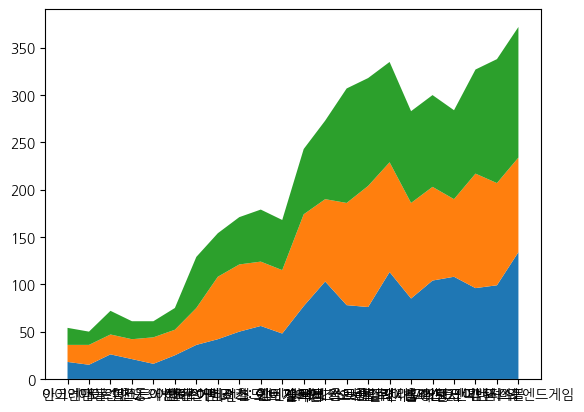

In [83]:
plt.stackplot(koreanMovies_marvel["title"].tolist(), first_zone_avg_list, second_zone_avg_list, third_zone_avg_list)

# plt.xlabel('개봉날짜', 
#         fontsize=12,)
# plt.ylabel('개봉수', 
#         fontsize=12)
# plt.xticks(rotation=45)  # x축의  45도 회전

# # 12. 그래프 레이아웃 설정
# plt.tight_layout()

# # 13. 범례 추가
# plt.legend(prop=fontprop)
# plt.legend(prop=fontprop, loc='upper right')

# # 14. 그래프 출력
# plt.show()


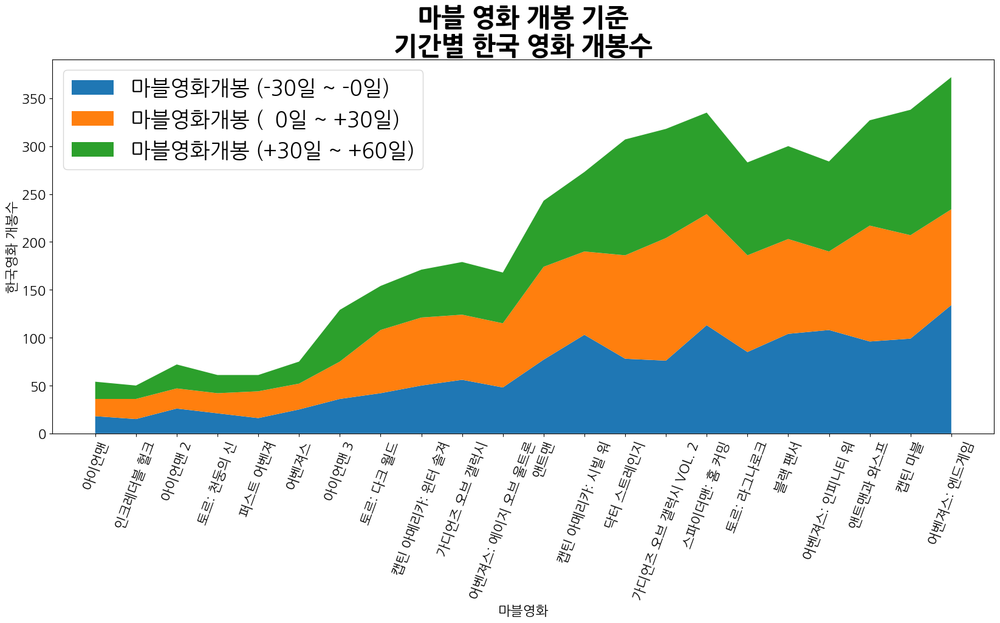

In [170]:
plt.figure(figsize=(20, 8))

# stackplot 그리기
plt.stackplot(koreanMovies_marvel["title"].tolist(), 
              first_zone_avg_list, 
              second_zone_avg_list, 
              third_zone_avg_list, 
              labels=['마블영화개봉 (-30일 ~ -0일)', 
                      '마블영화개봉 (  0일 ~ +30일)', 
                      '마블영화개봉 (+30일 ~ +60일)'] 
              )

# x축과 y축 라벨 설정
plt.xlabel('마블영화', fontsize=16)
plt.ylabel('한국영화 개봉수', fontsize=16)

# 제목 설정
plt.title('마블 영화 개봉 기준\n기간별 한국 영화 개봉수', fontsize=30, weight='bold')

# x축의 날짜 회전
plt.xticks(rotation=70, fontsize=16)

# y축의 눈금 표시 텍스트 크기 조정
plt.yticks(fontsize=16)


# 범례 추가
plt.legend(loc='upper left',fontsize=25)

# 그래프 출력
plt.show()



In [106]:
#폰트설정

import matplotlib.font_manager as fm
font_r = fm.FontProperties(fname='../data/TTF/NanumSquareNeo-bRg.ttf')
font_b = fm.FontProperties(fname='../data/TTF/NanumSquareNeo-cBd.ttf')
font_eb = fm.FontProperties(fname='../data/TTF/NanumSquareNeo-dEb.ttf')

font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname='../data/TTF/NanumSquareNeo-bRg.ttf')
#fontprop = font_r,font_eb

<h1>날짜별 영화 제목 개수를 합해서 숫자를 냄</h1>

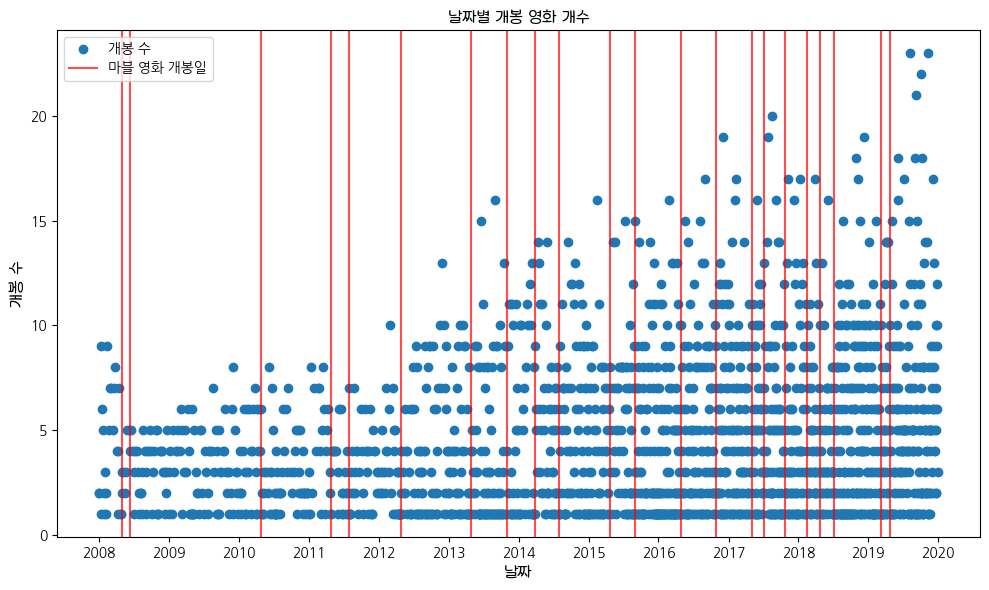

In [93]:
koreanMovies = pd.DataFrame(koreanMovies)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies['date'] = pd.to_datetime(koreanMovies['date'])

# 날짜별로 영화의 개수(title의 수)를 카운트
grouped_count = koreanMovies.groupby('date')['title'].count().reset_index()

# 날짜별 영화 개수 그래프
plt.figure(figsize=(10, 6))

font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 날짜별 영화 개수를 플롯
plt.scatter(grouped_count['date'], grouped_count['title'], label = '개봉 수')

# 마블 영화 개봉일에 수직선 표시
# 첫 번째 선에만 label을 추가해서 범례가 중복되지 않도록 함
first_label = True
for release_date in koreanMovies_marvel['date']:
    if first_label:
        plt.axvline(x=release_date, color='red', linestyle='-', alpha=0.7, label='마블 영화 개봉일')
        first_label = False
    else:
        plt.axvline(x=release_date, color='red', linestyle='-', alpha=0.7)

# X축을 년도별로 표시
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # 매년마다 x축 표시
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # X축에 년도만 표시

# 그래프 제목 및 레이블 설정
plt.title('날짜별 개봉 영화 개수', fontsize=16, fontproperties=fontprop)
plt.xlabel('날짜', fontsize=12, fontproperties=fontprop)
plt.ylabel('개봉 수', fontsize=12, fontproperties=fontprop)

# 범례 표시
plt.legend()

# 그래프 표시
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

<h1>각 영화 날짜로 총 수익 그래프 </h1>

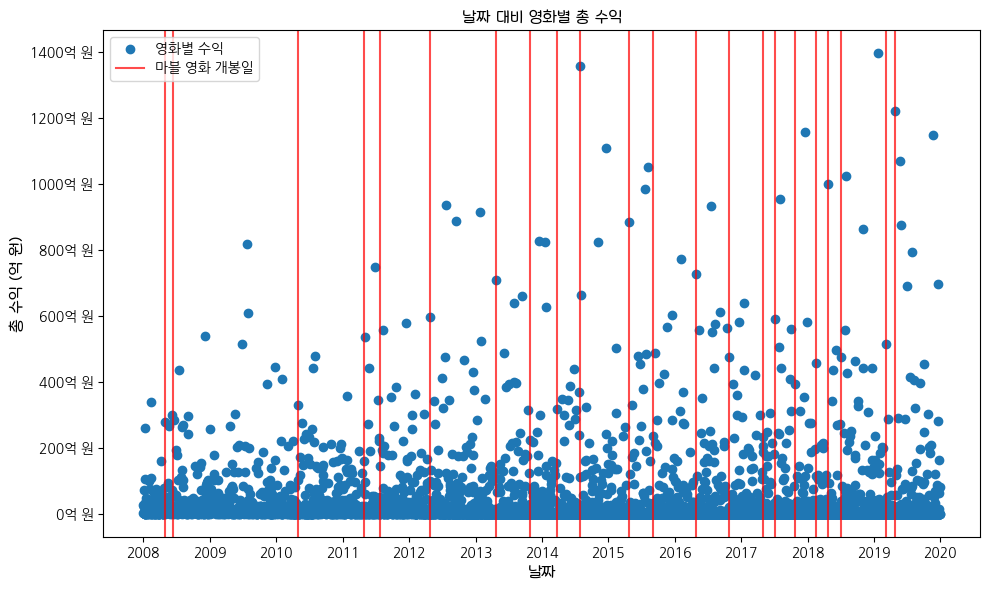

In [94]:
#import pandas as pd
#import matplotlib.pyplot as plt

# 데이터프레임 생성
koreanMovies = pd.DataFrame(koreanMovies)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies['date'] = pd.to_datetime(koreanMovies['date'])

# 개별 영화의 날짜 대비 총 수익 그래프
# gross 값이 날짜별로 더해지지 않음 각 점은 개별 영화의 총 수익을 그 영화가 개봉한 날짜에 맞춰 표시
plt.figure(figsize=(10, 6))

#  폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 영화별 수익을 날짜에 맞춰 플롯
plt.scatter(koreanMovies['date'], koreanMovies['gross'], label='영화별 수익')
#plt.plot(koreanMovies['date'], koreanMovies['gross'], marker='o')


# y축 라벨을 억 원 단위로 변환하는 함수
def billions(x, pos):
    return f'{int(x / 1e8)}억 원'

# 마블 영화 개봉일에 수직선 표시
# 첫 번째 선에만 label을 추가해서 범례가 중복되지 않도록 함
first_label = True
for release_date in koreanMovies_marvel['date']:
    if first_label:
        plt.axvline(x=release_date, color='red', linestyle='-', alpha=0.7, label='마블 영화 개봉일')
        first_label = False
    else:
        plt.axvline(x=release_date, color='red', linestyle='-', alpha=0.7)

# y축 라벨을 억 원 단위로 포맷팅
ax = plt.gca()
ax.yaxis.set_major_formatter(FuncFormatter(billions))

# X축을 년도별로 표시
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # 매년마다 x축 표시
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # X축에 년도만 표시

# 그래프 제목 및 레이블 설정
plt.title('날짜 대비 영화별 총 수익', fontsize=16, fontproperties=fontprop)
plt.xlabel('날짜', fontsize=12, fontproperties=fontprop)
plt.ylabel('총 수익 (억 원)', fontsize=12, fontproperties=fontprop)

# 범례 표시
plt.legend()

# 그래프 표시
#plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


<h1>영화 날짜별로 총 수익을 더 한 그래프 </h1>

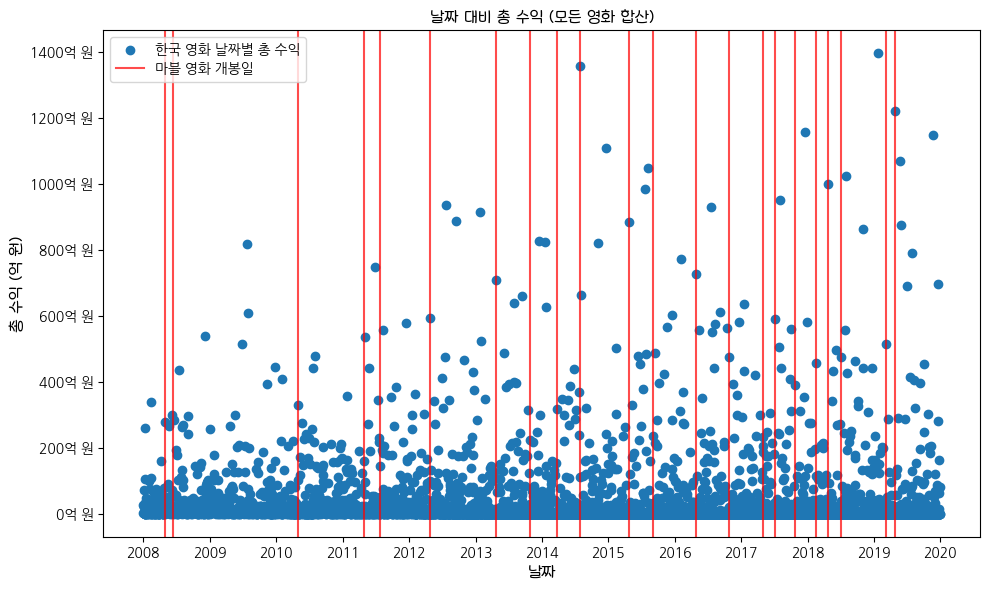

In [95]:
# 데이터프레임 생성
koreanMovies = pd.DataFrame(koreanMovies)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies['date'] = pd.to_datetime(koreanMovies['date'])

# 날짜별로 총 수익을 합산
grouped_gross = koreanMovies.groupby('date')['gross'].sum().reset_index()

# y축 라벨을 억 원 단위로 변환하는 함수
def billions(x, pos):
    return f'{int(x / 1e8)}억 원'

# 날짜 대비 총 수익 그래프
plt.figure(figsize=(10, 6))

#  폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 날짜별 총 수익을 플롯
plt.scatter(koreanMovies['date'], koreanMovies['gross'], label='한국 영화 날짜별 총 수익')

# y축 라벨을 억 원 단위로 포맷팅
ax = plt.gca()
ax.yaxis.set_major_formatter(FuncFormatter(billions))


# 마블 영화 개봉일에 수직선 표시
# 첫 번째 선에만 label을 추가해서 범례가 중복되지 않도록 함
first_label = True
for release_date in koreanMovies_marvel['date']:
    if first_label:
        plt.axvline(x=release_date, color='red', linestyle='-', alpha=0.7, label='마블 영화 개봉일')
        first_label = False
    else:
        plt.axvline(x=release_date, color='red', linestyle='-', alpha=0.7)

# X축을 년도별로 표시
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # 매년마다 x축 표시
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # X축에 년도만 표시

# 그래프 제목 및 레이블 설정
plt.title('날짜 대비 총 수익 (모든 영화 합산)', fontsize=16, fontproperties=fontprop)
plt.xlabel('날짜', fontsize=12, fontproperties=fontprop)
plt.ylabel('총 수익 (억 원)', fontsize=12, fontproperties=fontprop)

# 범례 표시
plt.legend()

# 그래프 표시
#plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


<h1>영화별 스크린 수를 산점도를 이용해서 그래프를 그림</h1>

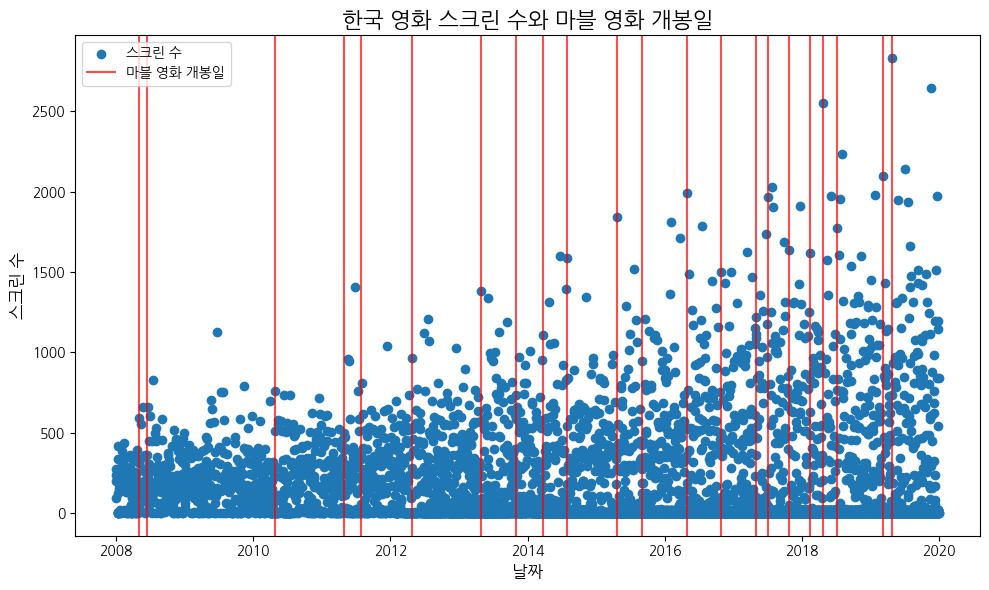

In [96]:
plt.figure(figsize=(10, 6))

# 한국 영화 스크린 수 (마커만 표시)
plt.scatter(koreanMovies['date'], koreanMovies['screen'], label='스크린 수')

# 마블 영화 개봉일에 수직선 표시
# 첫 번째 선에만 label을 추가해서 범례가 중복되지 않도록 함
first_label = True
for release_date in koreanMovies_marvel['date']:
    if first_label:
        plt.axvline(x=release_date, color='red', linestyle='-', alpha=0.7, label='마블 영화 개봉일')
        first_label = False
    else:
        plt.axvline(x=release_date, color='red', linestyle='-', alpha=0.7)

# 그래프 제목 및 레이블 설정
plt.title('한국 영화 스크린 수와 마블 영화 개봉일', fontsize=16)
plt.xlabel('날짜', fontsize=12)
plt.ylabel('스크린 수', fontsize=12)

# 범례 표시
plt.legend()

# 그래프 표시
plt.xticks()#rotation=45 삭제
plt.tight_layout()
plt.show()


<h1>날짜를 다 표시함 </h1>

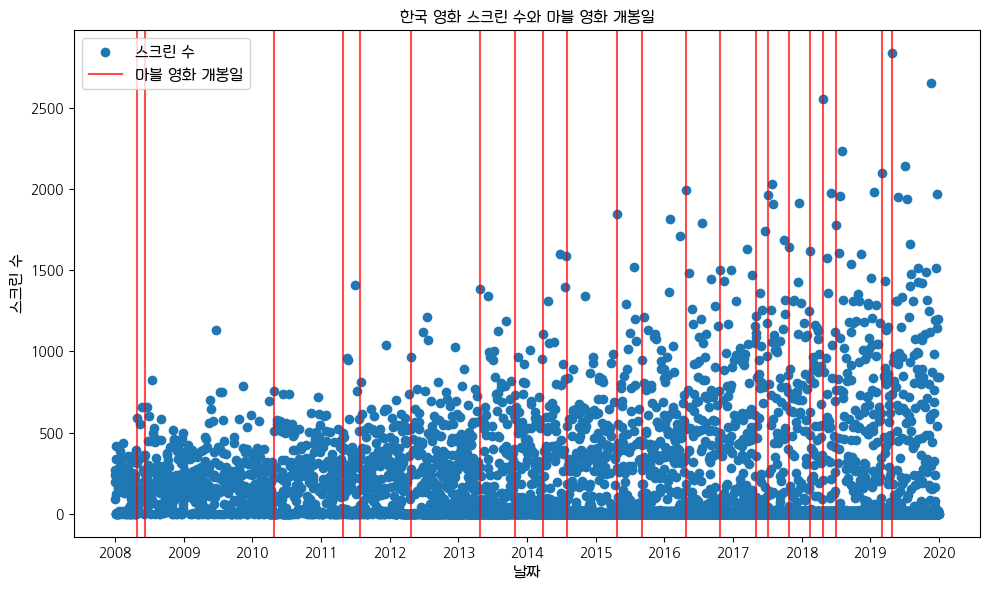

In [97]:

# 그래프 그리기
plt.figure(figsize=(10, 6))

#  폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 한국 영화 스크린 수 (마커만 표시)
plt.scatter(koreanMovies['date'], koreanMovies['screen'], label='스크린 수')

# 마블 영화 개봉일에 수직선 표시
# 첫 번째 선에만 label을 추가해서 범례가 중복되지 않도록 함
first_label = True
for release_date in koreanMovies_marvel['date']:
    if first_label:
        plt.axvline(x=pd.to_datetime(release_date), color='red', linestyle='-', alpha=0.7, label='마블 영화 개봉일')
        first_label = False
    else:
        plt.axvline(x=pd.to_datetime(release_date), color='red', linestyle='-', alpha=0.7)

# X축을 년도별로 표시
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # 매년마다 x축 표시
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # X축에 년도만 표시

# 그래프 제목 및 레이블 설정
plt.title('한국 영화 스크린 수와 마블 영화 개봉일', fontsize=16, fontproperties=fontprop)
plt.xlabel('날짜', fontsize=12, fontproperties=fontprop)
plt.ylabel('스크린 수', fontsize=12, fontproperties=fontprop)

# 범례 표시
plt.legend(prop=fontprop)

# 그래프 표시
plt.xticks()
plt.tight_layout()
plt.show()


<h1>마블영화 개봉한 날짜에 맞추어서 SQL로 2개월 전과 후를 찾음</h1>

In [98]:
query0 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2008-02-29' AND '2008-06-30';"
kmovies0 = pd.read_sql(query0, mydb_aws)


/tmp/ipykernel_32898/3763426340.py:2: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies0 = pd.read_sql(query0, mydb_aws)


In [99]:
query0 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2008-02-29' AND '2008-06-30';"
kmovies0 = pd.read_sql(query0, mydb_aws)
query1 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2008-04-12' AND '2008-08-12';"
kmovies1 = pd.read_sql(query1, mydb_aws)
query2 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2010-02-28' AND '2010-06-29';"
kmovies2 = pd.read_sql(query2, mydb_aws)
query3 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2011-02-28' AND '2011-06-28';"
kmovies3 = pd.read_sql(query3, mydb_aws)
query4 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2011-05-28' AND '2011-09-28';"
kmovies4 = pd.read_sql(query4, mydb_aws)
query5 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2012-02-26' AND '2012-06-26';"
kmovies5 = pd.read_sql(query5, mydb_aws)
query6 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2013-02-25' AND '2013-06-25';"
kmovies6 = pd.read_sql(query6, mydb_aws)
query7 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2013-08-30' AND '2013-12-30';"
kmovies7 = pd.read_sql(query7, mydb_aws)
query8 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2014-01-26' AND '2014-05-26';"
kmovies8 = pd.read_sql(query8, mydb_aws)
query8 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2014-01-26' AND '2014-05-26';"
kmovies8 = pd.read_sql(query8, mydb_aws)
query9 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2014-05-31' AND '2014-09-30';"
kmovies9 = pd.read_sql(query9, mydb_aws)
query10 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2015-02-23' AND '2015-06-23';"
kmovies10 = pd.read_sql(query10, mydb_aws)
query11 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2015-07-03' AND '2015-11-03';"
kmovies11 = pd.read_sql(query11, mydb_aws)
query12 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2016-02-27' AND '2016-06-27';"
kmovies12 = pd.read_sql(query12, mydb_aws)
query13 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2016-08-26' AND '2016-12-26';"
kmovies13 = pd.read_sql(query13, mydb_aws)
query14 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2017-03-03' AND '2017-07-03';"
kmovies14 = pd.read_sql(query14, mydb_aws)
query15 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2017-05-05' AND '2017-09-05';"
kmovies15 = pd.read_sql(query15, mydb_aws)
query16 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2017-08-25' AND '2017-12-25';"
kmovies16 = pd.read_sql(query16, mydb_aws)
query17 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2017-12-14' AND '2018-04-14';"
kmovies17 = pd.read_sql(query17, mydb_aws)
query18 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2018-02-25' AND '2018-06-25';"
kmovies18 = pd.read_sql(query18, mydb_aws)
query19 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2018-05-04' AND '2018-09-04';"
kmovies19 = pd.read_sql(query19, mydb_aws)
query20 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2019-01-06' AND '2019-05-06';"
kmovies20 = pd.read_sql(query20, mydb_aws)
query21 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2019-02-24' AND '2019-06-24';"
kmovies21 = pd.read_sql(query21, mydb_aws)


/tmp/ipykernel_32898/1820336855.py:2: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies0 = pd.read_sql(query0, mydb_aws)
/tmp/ipykernel_32898/1820336855.py:4: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies1 = pd.read_sql(query1, mydb_aws)
/tmp/ipykernel_32898/1820336855.py:6: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies2 = pd.read_sql(query2, mydb_aws)
/tmp/ipykernel_32898/1820336855.py:8: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI

In [100]:
kmovies_df = pd.DataFrame(kmovies0)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (아이언맨 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2008-04-27')  # 3일 전
highlight_end = pd.to_datetime('2008-05-03')    # 3일 후
release = pd.to_datetime('2008-04-30')


# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용

plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='아이언맨 개봉일')

# 9. 텍스트 추가 (아이언맨 개봉일 설명)
new_x_position = pd.to_datetime('2008-04-30') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '아이언맨 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('아이언맨 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'

Error in callback <function _draw_all_if_interactive at 0x707c35749cf0> (for post_execute), with arguments args (),kwargs {}:


FileNotFoundError: [Errno 2] No such file or directory: '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'

FileNotFoundError: [Errno 2] No such file or directory: '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'

<Figure size 1000x600 with 1 Axes>

In [29]:
# The Incredible Hulk (인크레더블 헐크), 2008-06-12, 2008-04-12, 2008-08-12
query1 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2008-04-12' AND '2008-08-12';"
kmovies1 = pd.read_sql(query1, mydb_aws)

/tmp/ipykernel_6812/449246924.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies1 = pd.read_sql(query1, mydb_aws)


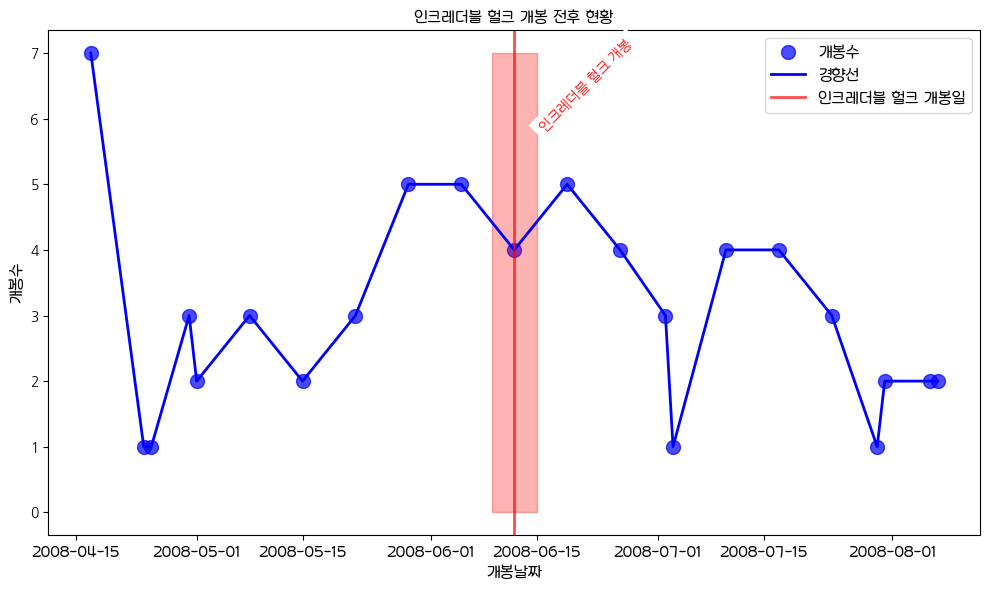

In [13]:
kmovies_df = pd.DataFrame(kmovies1)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (인크레더블 헐크 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2008-06-09')  # 3일 전
highlight_end = pd.to_datetime('2008-06-15')    # 3일 후
release = pd.to_datetime('2008-06-12')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='인크레더블 헐크 개봉일')


# 9. 텍스트 추가 (인크레더블 헐크 개봉일 설명)
new_x_position = pd.to_datetime('2008-06-12') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '인크레더블 헐크 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('인크레더블 헐크 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [30]:
# Iron Man 2 (아이언맨 2), 2010-04-29, 2010-02-28, 2010-06-29
query2 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2010-02-28' AND '2010-06-29';"
kmovies2 = pd.read_sql(query2, mydb_aws)

/tmp/ipykernel_6812/156988306.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies2 = pd.read_sql(query2, mydb_aws)


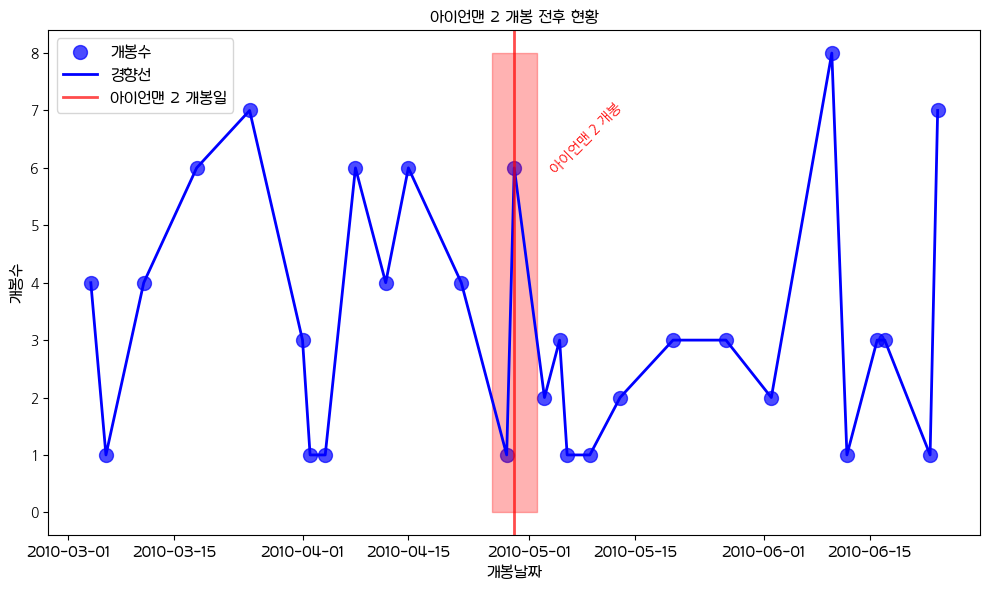

In [28]:
kmovies_df = pd.DataFrame(kmovies2)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (아이언맨 2 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2010-04-26')  # 3일 전
highlight_end = pd.to_datetime('2010-05-02')    # 3일 후
release = pd.to_datetime('2010-04-29')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용

plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='아이언맨 2 개봉일')

# 9. 텍스트 추가 (아이언맨 2 개봉일 설명)
new_x_position = pd.to_datetime('2010-04-29') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '아이언맨 2 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('아이언맨 2 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [31]:
# Thor (토르), 2011-04-28, 2011-02-28, 2011-06-28
query3 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2011-02-28' AND '2011-06-28';"
kmovies3 = pd.read_sql(query3, mydb_aws)

/tmp/ipykernel_6812/1897083591.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies3 = pd.read_sql(query3, mydb_aws)


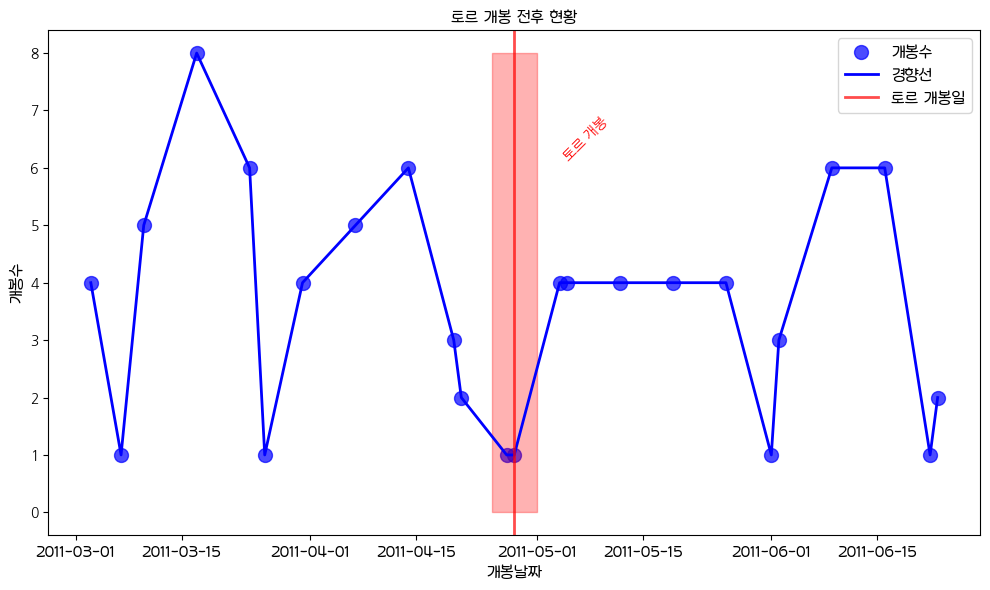

In [24]:
kmovies_df = pd.DataFrame(kmovies3)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (토르 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2011-04-25')  # 3일 전
highlight_end = pd.to_datetime('2011-05-01')    # 3일 후
release = pd.to_datetime('2011-04-28')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='토르 개봉일')


# 9. 텍스트 추가 (토르 개봉일 설명)
new_x_position = pd.to_datetime('2011-04-28') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '토르 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('토르 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [32]:
# Captain America: The First Avenger (캡틴 아메리카: 퍼스트 어벤져), 2011-07-28, 2011-05-28, 2011-09-28
query4 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2011-05-28' AND '2011-09-28';"
kmovies4 = pd.read_sql(query4, mydb_aws)

/tmp/ipykernel_6812/3339620626.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies4 = pd.read_sql(query4, mydb_aws)


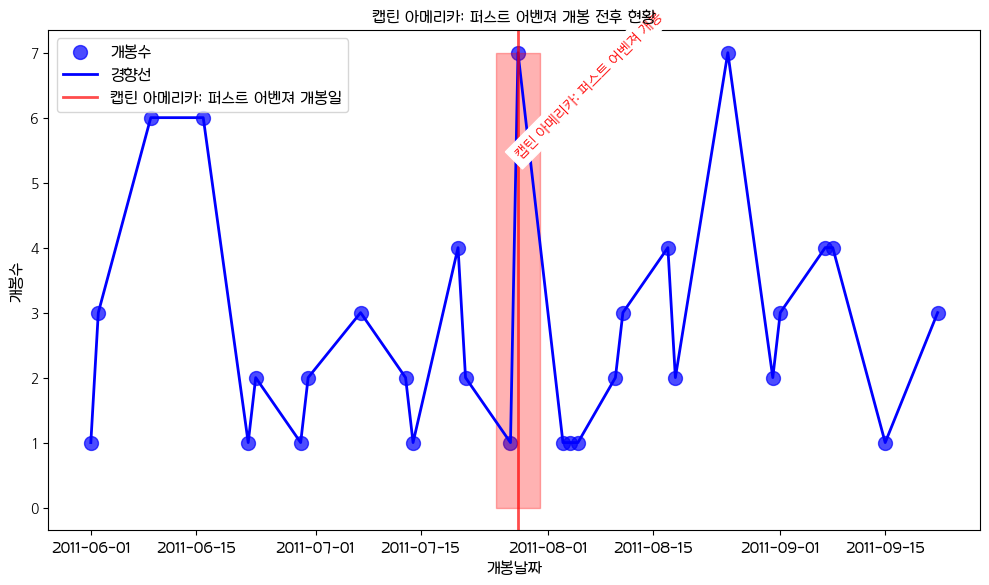

In [26]:
kmovies_df = pd.DataFrame(kmovies4)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (캡틴 아메리카: 퍼스트 어벤져 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2011-07-25')  # 3일 전
highlight_end = pd.to_datetime('2011-07-31')    # 3일 후
release = pd.to_datetime('2011-07-28')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='캡틴 아메리카: 퍼스트 어벤져 개봉일')


# 9. 텍스트 추가 (캡틴 아메리카: 퍼스트 어벤져 개봉일 설명)
new_x_position = pd.to_datetime('2011-07-28') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '캡틴 아메리카: 퍼스트 어벤져 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('캡틴 아메리카: 퍼스트 어벤져 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [33]:
# The Avengers (어벤져스), 2012-04-26, 2012-02-26, 2012-06-26
query5 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2012-02-26' AND '2012-06-26';"
kmovies5 = pd.read_sql(query5, mydb_aws)

/tmp/ipykernel_6812/1255106120.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies5 = pd.read_sql(query5, mydb_aws)


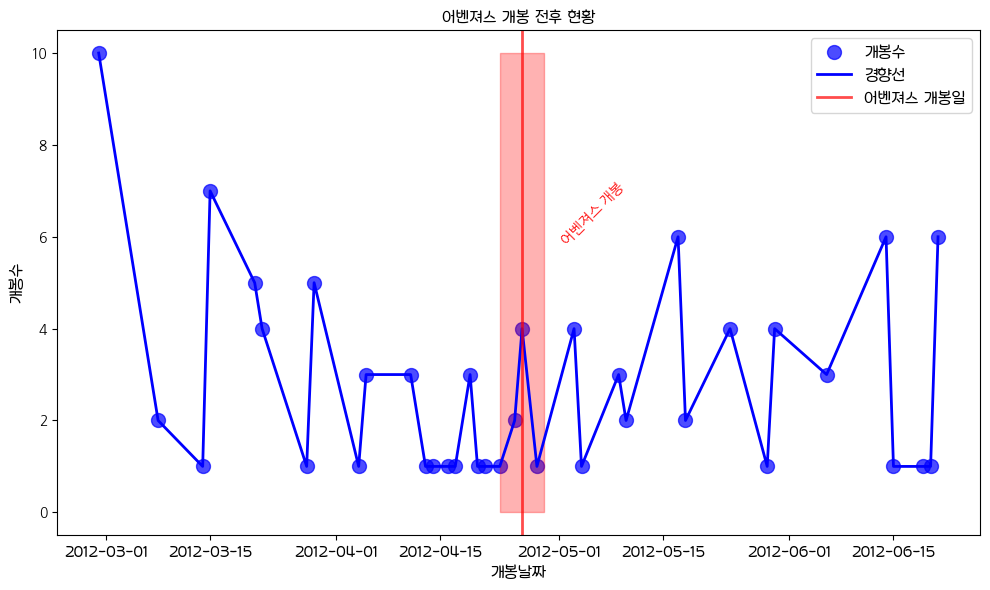

In [30]:
kmovies_df = pd.DataFrame(kmovies5)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (어벤져스 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2012-04-23')  # 3일 전
highlight_end = pd.to_datetime('2012-04-29')    # 3일 후
release = pd.to_datetime('2012-04-26')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='어벤져스 개봉일')


# 9. 텍스트 추가 (어벤져스 개봉일 설명)
new_x_position = pd.to_datetime('2012-04-26') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '어벤져스 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('어벤져스 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [34]:
# Iron Man 3 (아이언맨 3), 2013-04-25, 2013-02-25, 2013-06-25
query6 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2013-02-25' AND '2013-06-25';"
kmovies6 = pd.read_sql(query6, mydb_aws)

/tmp/ipykernel_6812/3497319916.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies6 = pd.read_sql(query6, mydb_aws)


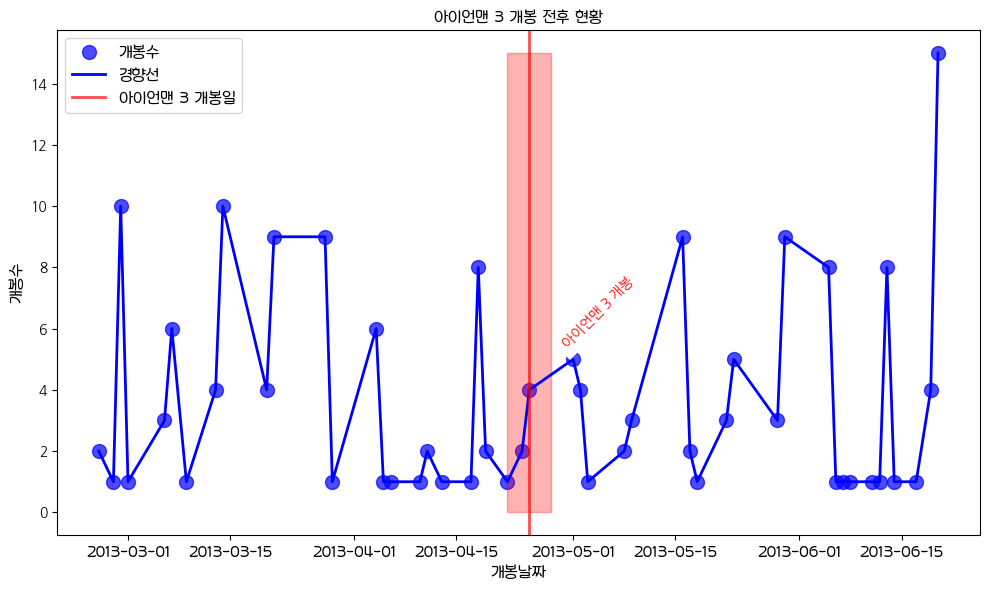

In [32]:
kmovies_df = pd.DataFrame(kmovies6)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (아이언맨 3 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2013-04-22')  # 3일 전
highlight_end = pd.to_datetime('2013-04-28')    # 3일 후
release = pd.to_datetime('2013-04-25')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='아이언맨 3 개봉일')


# 9. 텍스트 추가 (아이언맨 3 개봉일 설명)
new_x_position = pd.to_datetime('2013-04-25') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '아이언맨 3 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('아이언맨 3 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [35]:
# Thor: The Dark World (토르: 다크 월드), 2013-10-30, 2013-08-30, 2013-12-30
query7 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2013-08-30' AND '2013-12-30';"
kmovies7 = pd.read_sql(query7, mydb_aws)

/tmp/ipykernel_6812/3802305623.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies7 = pd.read_sql(query7, mydb_aws)


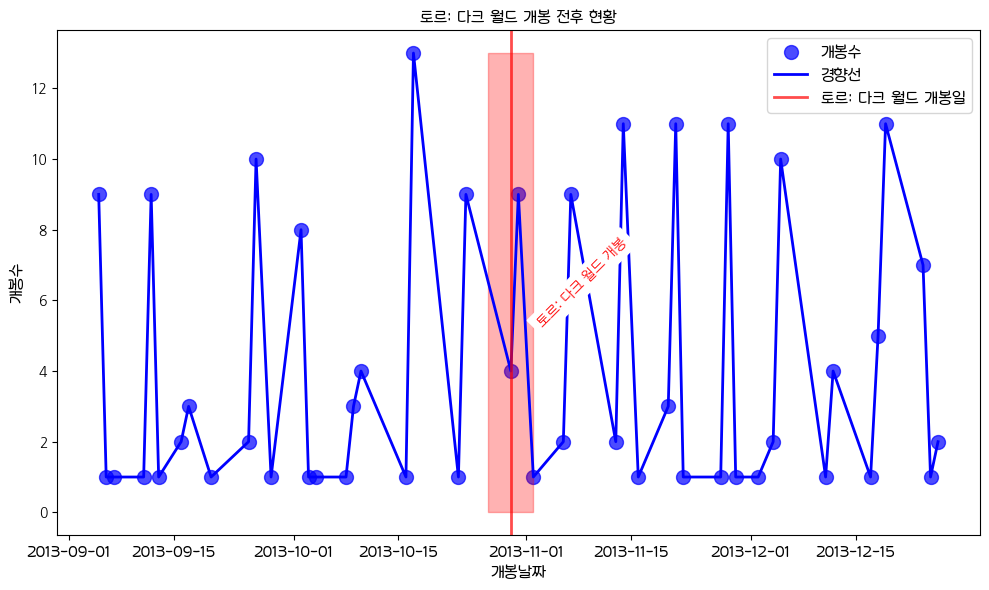

In [34]:
kmovies_df = pd.DataFrame(kmovies7)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (토르: 다크 월드 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2013-10-27')  # 3일 전
highlight_end = pd.to_datetime('2013-11-02')    # 3일 후
release = pd.to_datetime('2013-10-30')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='토르: 다크 월드 개봉일')


# 9. 텍스트 추가 (토르: 다크 월드 개봉일 설명)
new_x_position = pd.to_datetime('2013-10-30') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '토르: 다크 월드 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('토르: 다크 월드 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [36]:
# Captain America: The Winter Soldier (캡틴 아메리카: 윈터 솔져), 2014-03-26, 2014-01-26, 2014-05-26
query8 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2014-01-26' AND '2014-05-26';"
kmovies8 = pd.read_sql(query8, mydb_aws)

/tmp/ipykernel_6812/819521490.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies8 = pd.read_sql(query8, mydb_aws)


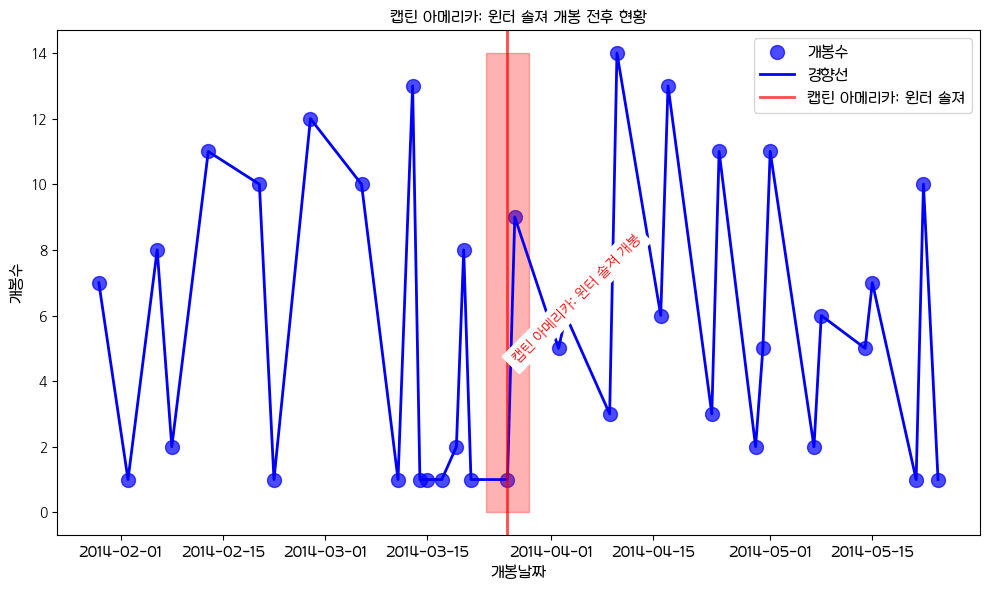

In [37]:
kmovies_df = pd.DataFrame(kmovies8)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (캡틴 아메리카: 윈터 솔져 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2014-03-23')  # 3일 전
highlight_end = pd.to_datetime('2014-03-29')    # 3일 후
release = pd.to_datetime('2014-03-26')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='캡틴 아메리카: 윈터 솔져')


# 9. 텍스트 추가 (캡틴 아메리카: 윈터 솔져 개봉일 설명)
new_x_position = pd.to_datetime('2014-03-26') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '캡틴 아메리카: 윈터 솔져 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('캡틴 아메리카: 윈터 솔져 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [37]:
# Guardians of the Galaxy (가디언즈 오브 갤럭시), 2014-07-31, 2014-05-31, 2014-09-30
query9 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2014-05-31' AND '2014-09-30';"
kmovies9 = pd.read_sql(query9, mydb_aws)

/tmp/ipykernel_6812/667324907.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies9 = pd.read_sql(query9, mydb_aws)


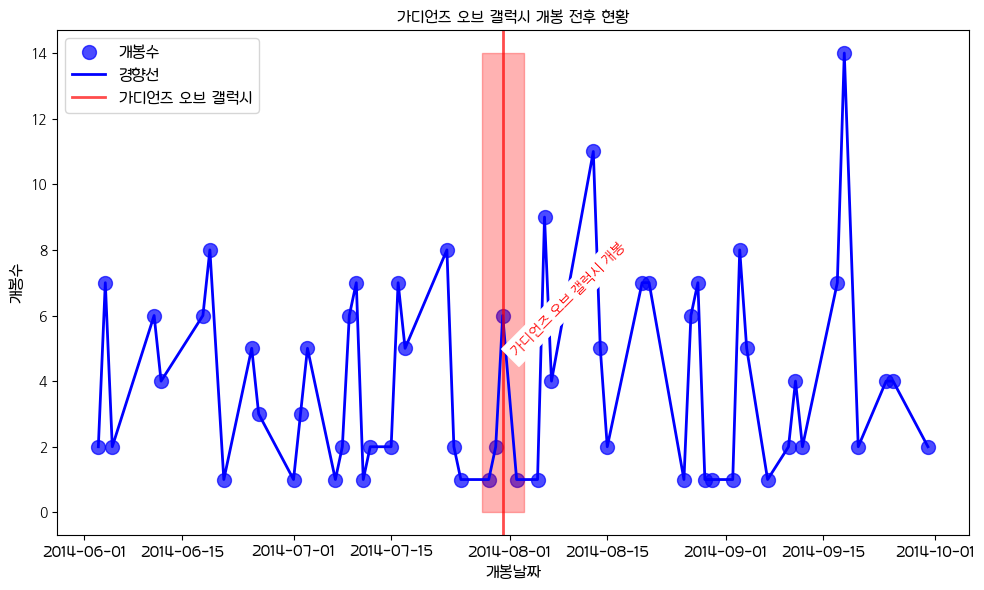

In [39]:
kmovies_df = pd.DataFrame(kmovies9)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (가디언즈 오브 갤럭시 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2014-07-28')  # 3일 전
highlight_end = pd.to_datetime('2014-08-03')    # 3일 후
release = pd.to_datetime('2014-07-31')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='가디언즈 오브 갤럭시')


# 9. 텍스트 추가 (가디언즈 오브 갤럭시 개봉일 설명)
new_x_position = pd.to_datetime('2014-07-31') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '가디언즈 오브 갤럭시 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('가디언즈 오브 갤럭시 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [38]:
# Avengers: Age of Ultron (어벤져스: 에이지 오브 울트론), 2015-04-23, 2015-02-23, 2015-06-23
query10 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2015-02-23' AND '2015-06-23';"
kmovies10 = pd.read_sql(query10, mydb_aws)

/tmp/ipykernel_6812/515924875.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies10 = pd.read_sql(query10, mydb_aws)


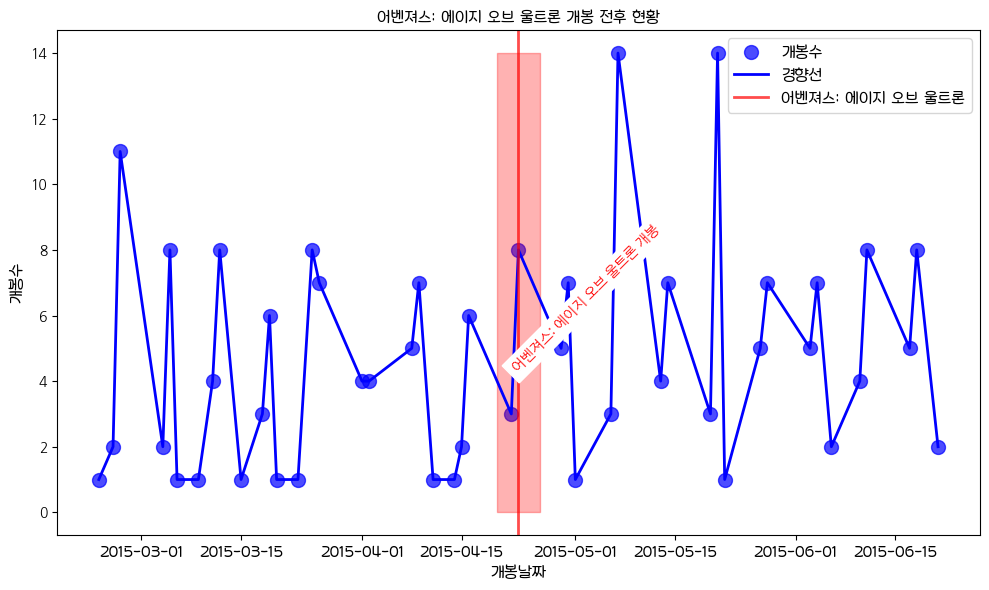

In [41]:
kmovies_df = pd.DataFrame(kmovies10)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (어벤져스: 에이지 오브 울트론 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2015-04-20')  # 3일 전
highlight_end = pd.to_datetime('2015-04-26')    # 3일 후
release = pd.to_datetime('2015-04-23')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='어벤져스: 에이지 오브 울트론')


# 9. 텍스트 추가 (어벤져스: 에이지 오브 울트론 개봉일 설명)
new_x_position = pd.to_datetime('2015-04-23') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '어벤져스: 에이지 오브 울트론 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('어벤져스: 에이지 오브 울트론 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [39]:
# Ant-Man (앤트맨), 2015-09-03, 2015-07-03, 2015-11-03
query11 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2015-07-03' AND '2015-11-03';"
kmovies11 = pd.read_sql(query11, mydb_aws)

/tmp/ipykernel_6812/2552754908.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies11 = pd.read_sql(query11, mydb_aws)


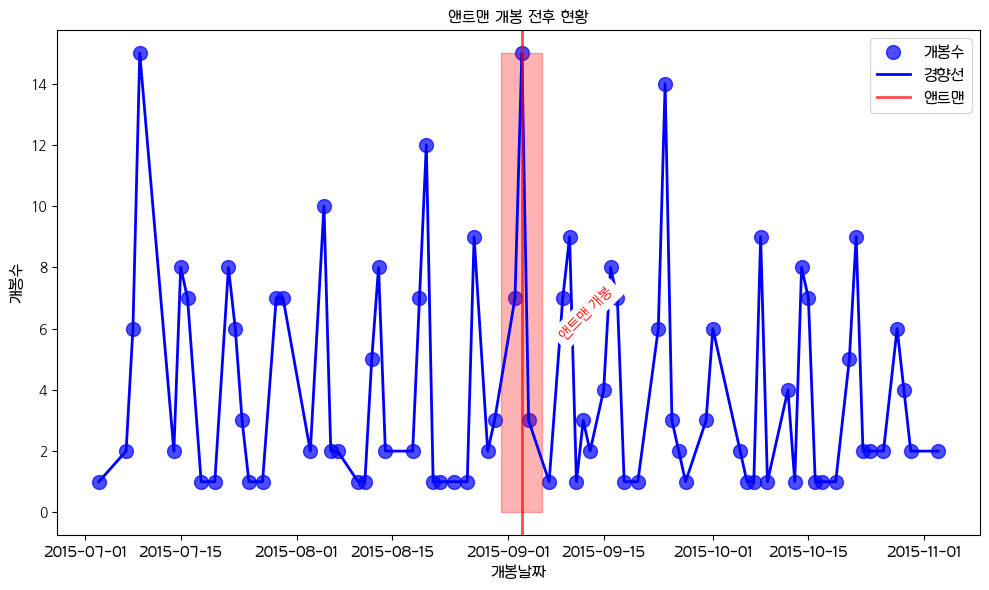

In [43]:
kmovies_df = pd.DataFrame(kmovies11)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (앤트맨 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2015-08-31')  # 3일 전
highlight_end = pd.to_datetime('2015-09-06')    # 3일 후
release = pd.to_datetime('2015-09-03')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='앤트맨')


# 9. 텍스트 추가 (앤트맨 개봉일 설명)
new_x_position = pd.to_datetime('2015-09-03') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '앤트맨 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('앤트맨 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [40]:
# Captain America: Civil War (캡틴 아메리카: 시빌 워), 2016-04-27, 2016-02-27, 2016-06-27
query12 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2016-02-27' AND '2016-06-27';"
kmovies12 = pd.read_sql(query12, mydb_aws)

/tmp/ipykernel_6812/3002504325.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies12 = pd.read_sql(query12, mydb_aws)


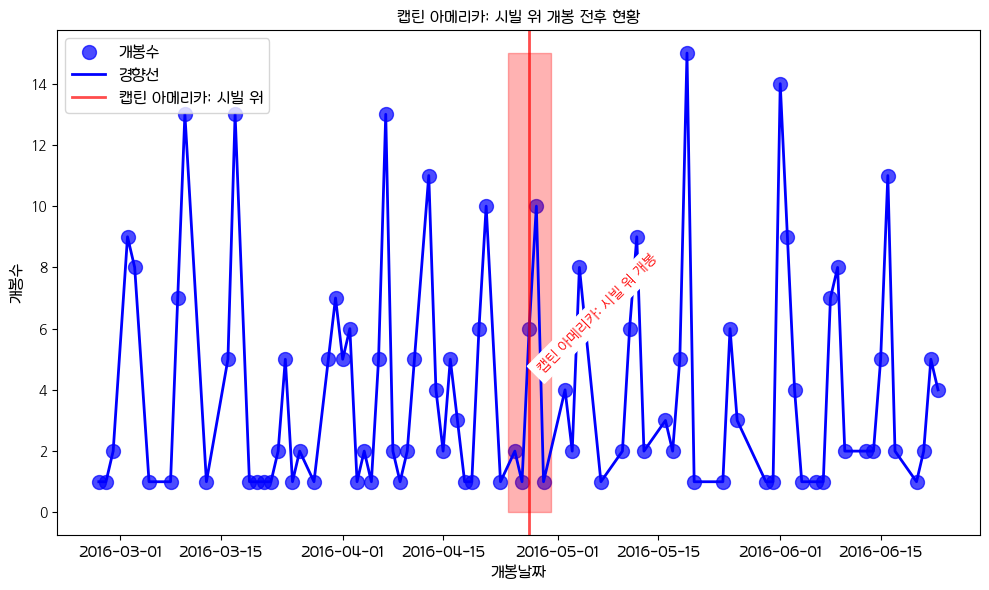

In [47]:
kmovies_df = pd.DataFrame(kmovies12)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (캡틴 아메리카: 시빌 워 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2016-04-24')  # 3일 전
highlight_end = pd.to_datetime('2016-04-30')    # 3일 후
release = pd.to_datetime('2016-04-27')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='캡틴 아메리카: 시빌 워')


# 9. 텍스트 추가 (캡틴 아메리카: 시빌 워 개봉일 설명)
new_x_position = pd.to_datetime('2016-04-27') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '캡틴 아메리카: 시빌 워 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('캡틴 아메리카: 시빌 워 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [41]:
# Doctor Strange (닥터 스트레인지), 2016-10-26, 2016-08-26, 2016-12-26
query13 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2016-08-26' AND '2016-12-26';"
kmovies13 = pd.read_sql(query13, mydb_aws)

/tmp/ipykernel_6812/3788671958.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies13 = pd.read_sql(query13, mydb_aws)


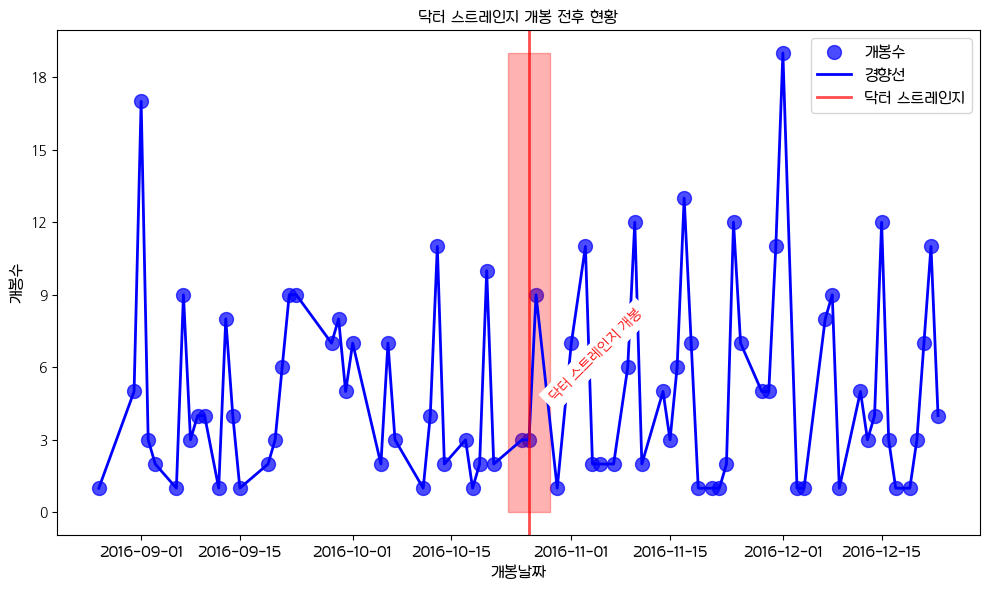

In [49]:
kmovies_df = pd.DataFrame(kmovies13)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (닥터 스트레인지 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2016-10-23')  # 3일 전
highlight_end = pd.to_datetime('2016-10-29')    # 3일 후
release = pd.to_datetime('2016-10-26')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='닥터 스트레인지')


# 9. 텍스트 추가 (닥터 스트레인지 개봉일 설명)
new_x_position = pd.to_datetime('2016-10-26') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '닥터 스트레인지 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('닥터 스트레인지 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# y축을 정수로만 표시되도록 설정
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [42]:
# Guardians of the Galaxy Vol. 2 (가디언즈 오브 갤럭시 Vol. 2), 2017-05-03, 2017-03-03, 2017-07-03
query14 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2017-03-03' AND '2017-07-03';"
kmovies14 = pd.read_sql(query14, mydb_aws)

/tmp/ipykernel_6812/3027026481.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies14 = pd.read_sql(query14, mydb_aws)


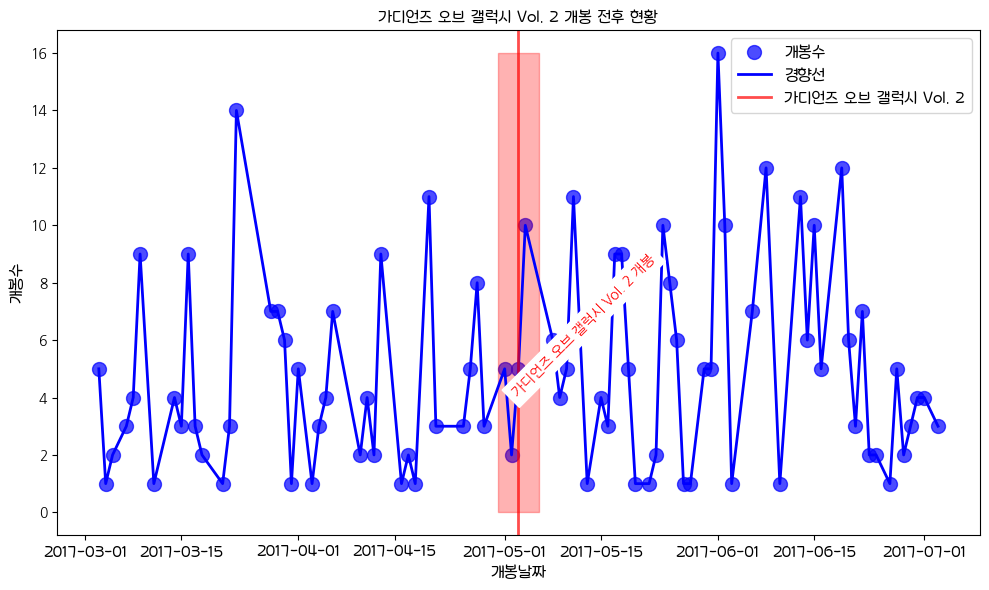

In [51]:
kmovies_df = pd.DataFrame(kmovies14)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (가디언즈 오브 갤럭시 Vol. 2 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2017-04-30')  # 3일 전
highlight_end = pd.to_datetime('2017-05-06')    # 3일 후
release = pd.to_datetime('2017-05-03')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='가디언즈 오브 갤럭시 Vol. 2')


# 9. 텍스트 추가 (가디언즈 오브 갤럭시 Vol. 2 개봉일 설명)
new_x_position = pd.to_datetime('2017-05-03') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '가디언즈 오브 갤럭시 Vol. 2 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('가디언즈 오브 갤럭시 Vol. 2 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [43]:
# Spider-Man: Homecoming (스파이더맨: 홈커밍), 2017-07-05, 2017-05-05, 2017-09-05
query15 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2017-05-05' AND '2017-09-05';"
kmovies15 = pd.read_sql(query15, mydb_aws)

/tmp/ipykernel_6812/4074219664.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies15 = pd.read_sql(query15, mydb_aws)


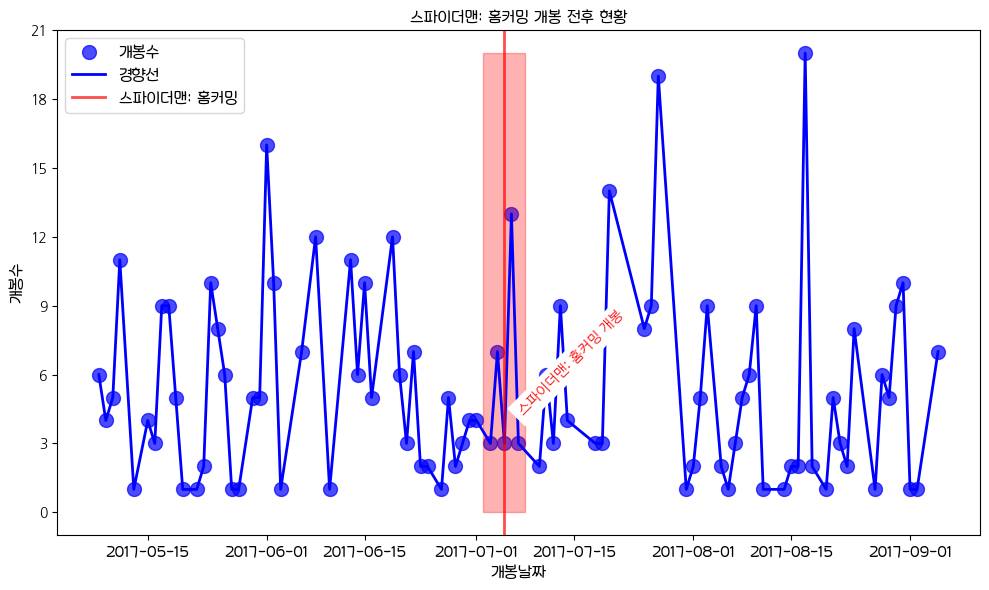

In [53]:
kmovies_df = pd.DataFrame(kmovies15)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (스파이더맨: 홈커밍 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2017-07-02')  # 3일 전
highlight_end = pd.to_datetime('2017-07-08')    # 3일 후
release = pd.to_datetime('2017-07-05')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='스파이더맨: 홈커밍')


# 9. 텍스트 추가 (스파이더맨: 홈커밍 개봉일 설명)
new_x_position = pd.to_datetime('2017-07-05') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '스파이더맨: 홈커밍 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('스파이더맨: 홈커밍 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [44]:
# Thor: Ragnarok (토르: 라그나로크), 2017-10-25, 2017-08-25, 2017-12-25
query16 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2017-08-25' AND '2017-12-25';"
kmovies16 = pd.read_sql(query16, mydb_aws)

/tmp/ipykernel_6812/199336913.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies16 = pd.read_sql(query16, mydb_aws)


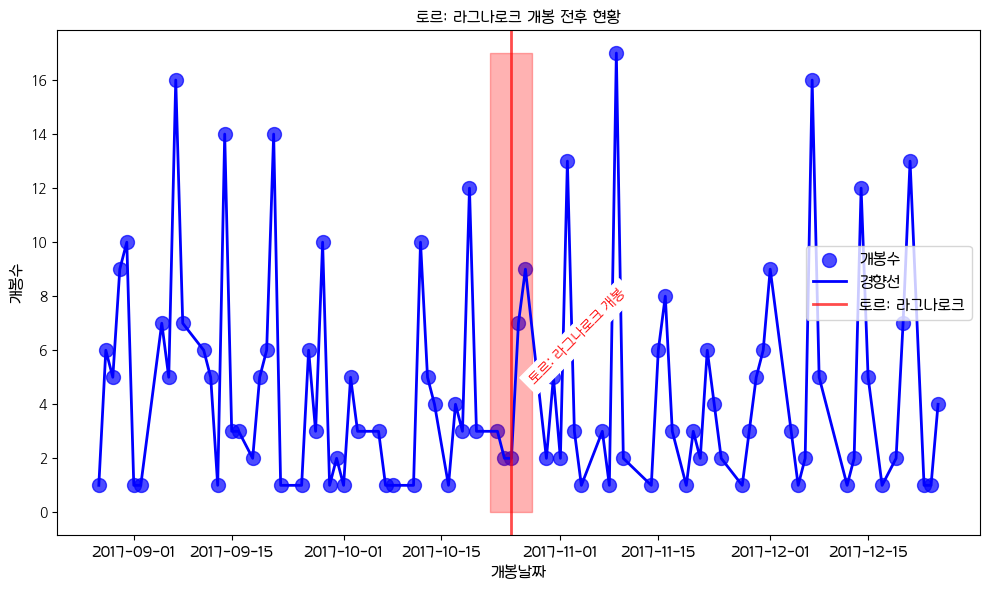

In [57]:
kmovies_df = pd.DataFrame(kmovies16)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (토르: 라그나로크 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2017-10-22')  # 3일 전
highlight_end = pd.to_datetime('2017-10-28')    # 3일 후
release = pd.to_datetime('2017-10-25')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='토르: 라그나로크')


# 9. 텍스트 추가 (토르: 라그나로크 개봉일 설명)
new_x_position = pd.to_datetime('2017-10-25') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '토르: 라그나로크 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('토르: 라그나로크 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# y축을 정수로만 표시되도록 설정
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [47]:
# Black Panther (블랙 팬서), 2018-02-14, 2017-12-14, 2018-04-14
query17 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2017-12-14' AND '2018-04-14';"
kmovies17 = pd.read_sql(query17, mydb_aws)

/tmp/ipykernel_6812/2986318736.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies17 = pd.read_sql(query17, mydb_aws)


In [46]:
kmovies_df = pd.DataFrame(kmovies17)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (블랙 팬서 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2018-02-11')  # 3일 전
highlight_end = pd.to_datetime('2018-02-17')    # 3일 후
release = pd.to_datetime('2018-02-14')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='블랙 팬서')


# 9. 텍스트 추가 (블랙 팬서 개봉일 설명)
new_x_position = pd.to_datetime('2018-02-14') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '블랙 팬서 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('블랙 팬서 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# y축을 정수로만 표시되도록 설정
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'

Error in callback <function _draw_all_if_interactive at 0x718683f49cf0> (for post_execute), with arguments args (),kwargs {}:


FileNotFoundError: [Errno 2] No such file or directory: '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'

FileNotFoundError: [Errno 2] No such file or directory: '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'

<Figure size 1000x600 with 1 Axes>

In [48]:
# Avengers: Infinity War (어벤져스: 인피니티 워), 2018-04-25, 2018-02-25, 2018-06-25
query18 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2018-02-25' AND '2018-06-25';"
kmovies18 = pd.read_sql(query18, mydb_aws)

/tmp/ipykernel_6812/1487847588.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies18 = pd.read_sql(query18, mydb_aws)


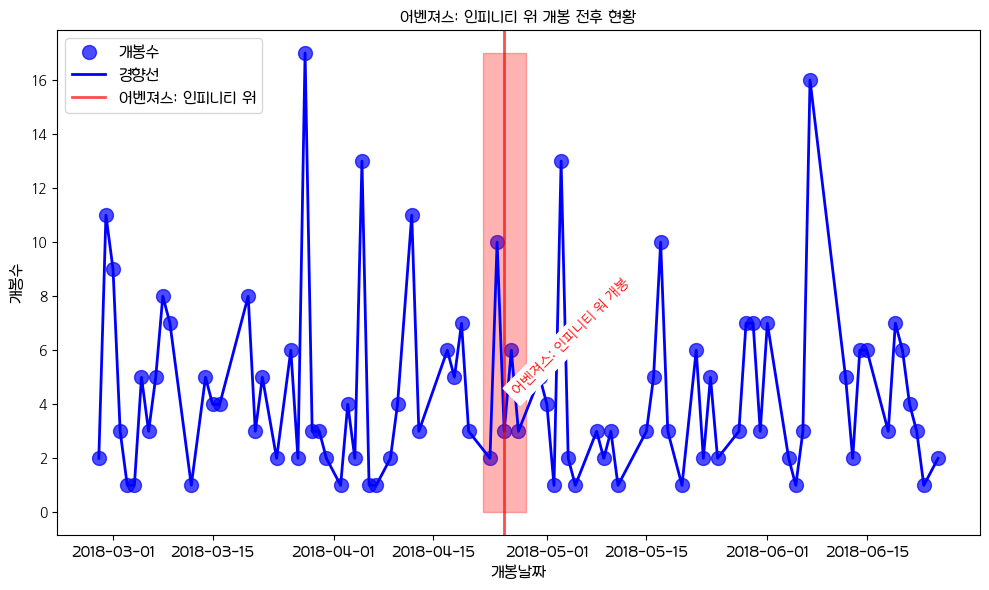

In [63]:
kmovies_df = pd.DataFrame(kmovies18)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (어벤져스: 인피니티 워 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2018-04-22')  # 3일 전
highlight_end = pd.to_datetime('2018-04-28')    # 3일 후
release = pd.to_datetime('2018-04-25')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='어벤져스: 인피니티 워')


# 9. 텍스트 추가 (어벤져스: 인피니티 워 개봉일 설명)
new_x_position = pd.to_datetime('2018-04-25') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '어벤져스: 인피니티 워 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('어벤져스: 인피니티 워 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# y축을 정수로만 표시되도록 설정
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [49]:
# Ant-Man and the Wasp (앤트맨과 와스프), 2018-07-04, 2018-05-04, 2018-09-04
query19 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2018-05-04' AND '2018-09-04';"
kmovies19 = pd.read_sql(query19, mydb_aws)

/tmp/ipykernel_6812/3589330794.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies19 = pd.read_sql(query19, mydb_aws)


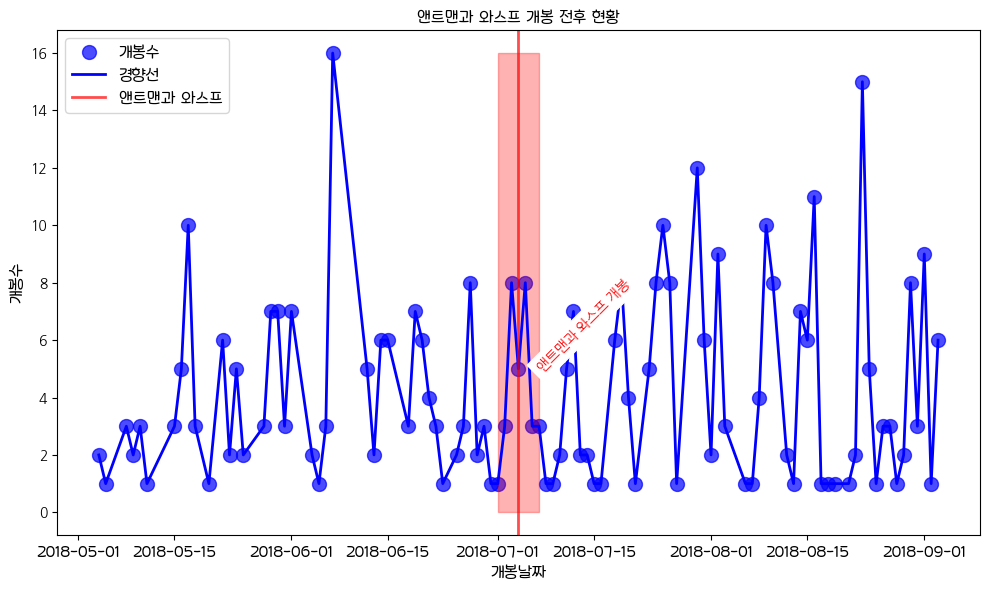

In [65]:
kmovies_df = pd.DataFrame(kmovies19)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (앤트맨과 와스프 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2018-07-01')  # 3일 전
highlight_end = pd.to_datetime('2018-07-07')    # 3일 후
release = pd.to_datetime('2018-07-04')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='앤트맨과 와스프')


# 9. 텍스트 추가 (앤트맨과 와스프 개봉일 설명)
new_x_position = pd.to_datetime('2018-07-04') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '앤트맨과 와스프 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('앤트맨과 와스프 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [50]:
# Captain Marvel (캡틴 마블), 2019-03-06, 2019-01-06, 2019-05-06

query20 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2019-01-06' AND '2019-05-06';"
kmovies20 = pd.read_sql(query20, mydb_aws)


/tmp/ipykernel_6812/2435951925.py:4: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies20 = pd.read_sql(query20, mydb_aws)


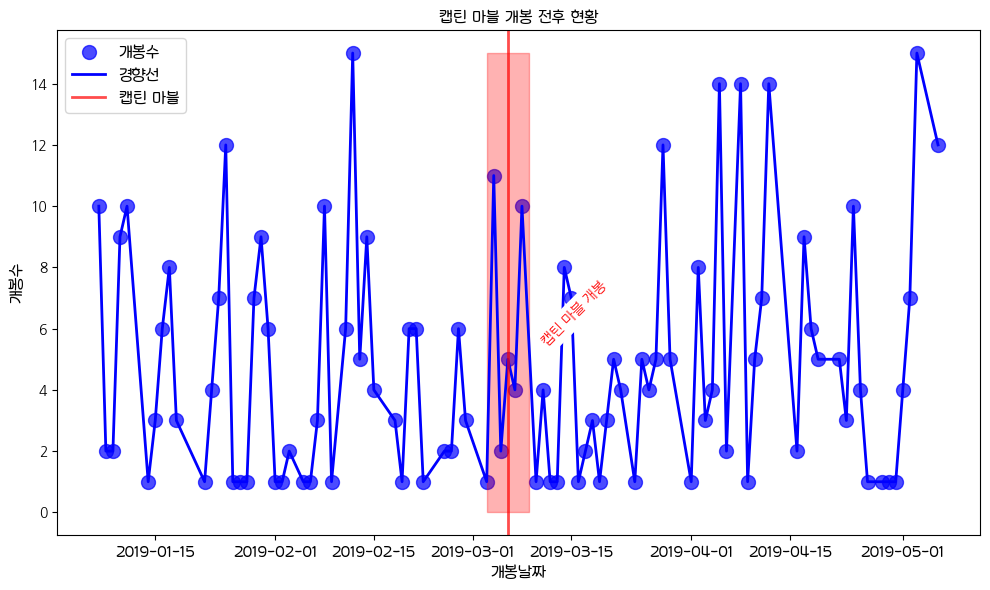

In [67]:
kmovies_df = pd.DataFrame(kmovies20)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (캡틴 마블 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2019-03-03')  # 3일 전
highlight_end = pd.to_datetime('2019-03-09')    # 3일 후
release = pd.to_datetime('2019-03-06')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='캡틴 마블')


# 9. 텍스트 추가 (캡틴 마블 개봉일 설명)
new_x_position = pd.to_datetime('2019-03-06') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '캡틴 마블 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('캡틴 마블 개봉 전후 현황', 
          fontsize=16, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [51]:
# Avengers: Endgame (어벤져스: 엔드게임), 2019-04-24, 2019-02-24, 2019-06-24

query21 = "SELECT * FROM koreanMovies WHERE date BETWEEN '2019-02-24' AND '2019-06-24';"
kmovies21 = pd.read_sql(query21, mydb_aws)

/tmp/ipykernel_6812/1671941366.py:4: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  kmovies21 = pd.read_sql(query21, mydb_aws)


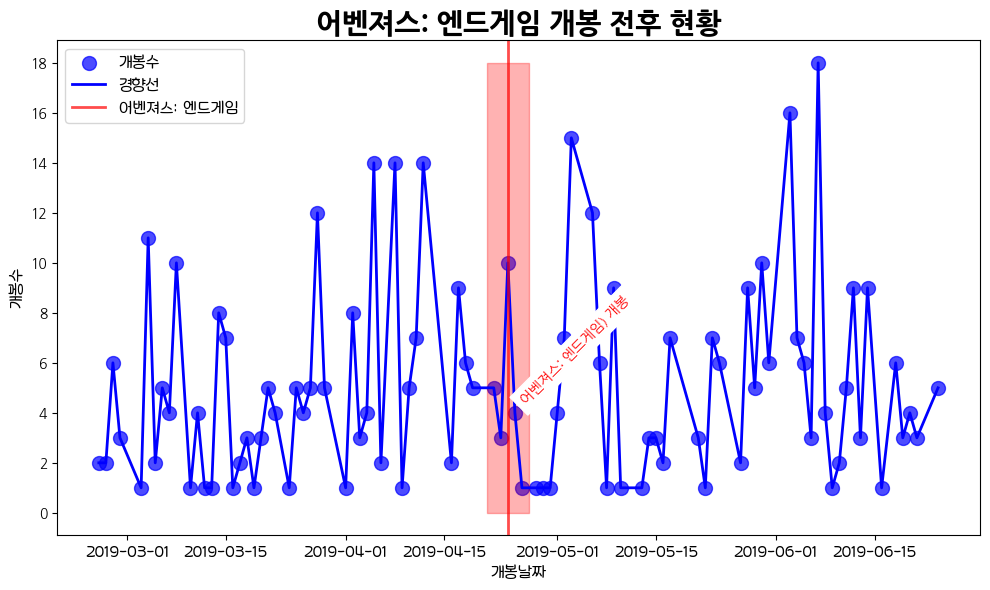

In [16]:
kmovies_df = pd.DataFrame(kmovies21)

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수',s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (어벤져스: 엔드게임 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2019-04-21')  # 3일 전
highlight_end = pd.to_datetime('2019-04-27')    # 3일 후
release = pd.to_datetime('2019-04-24')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='어벤져스: 엔드게임')


# 9. 텍스트 추가 (어벤져스: 엔드게임) 개봉일 설명)
new_x_position = pd.to_datetime('2019-04-24') + pd.Timedelta(days=9.5)
plt.text(new_x_position, 
         6.5, 
         '어벤져스: 엔드게임) 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('어벤져스: 엔드게임 개봉 전후 현황', 
          fontsize=20, 
          #fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0,fontproperties=fontprop)

# y축을 정수로만 표시되도록 설정
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

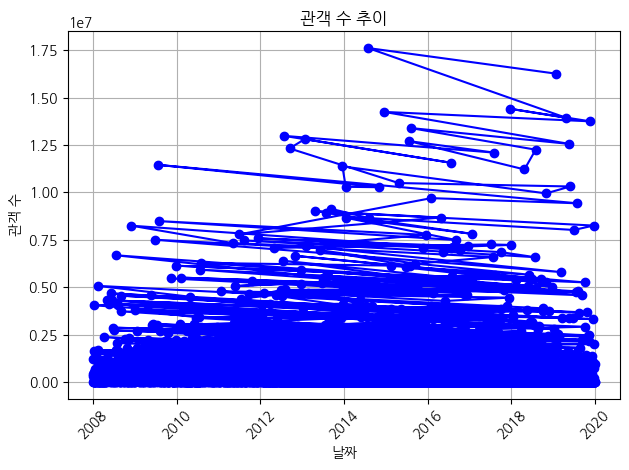

In [21]:
koreanMovies_df = pd.DataFrame(koreanMovies)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies_df['date'] = pd.to_datetime(koreanMovies_df['date']).dt.date

# 선형 그래프 그리기
plt.plot(koreanMovies_df['date'], koreanMovies_df['person'], marker='o', linestyle='-', color='blue')

# 그래프 제목 및 레이블 설정
plt.title('관객 수 추이')
plt.xlabel('날짜')
plt.ylabel('관객 수')

# 날짜 포맷 조정
plt.xticks(rotation=45)

# 그래프 표시
plt.tight_layout()
plt.grid(True)
plt.show()

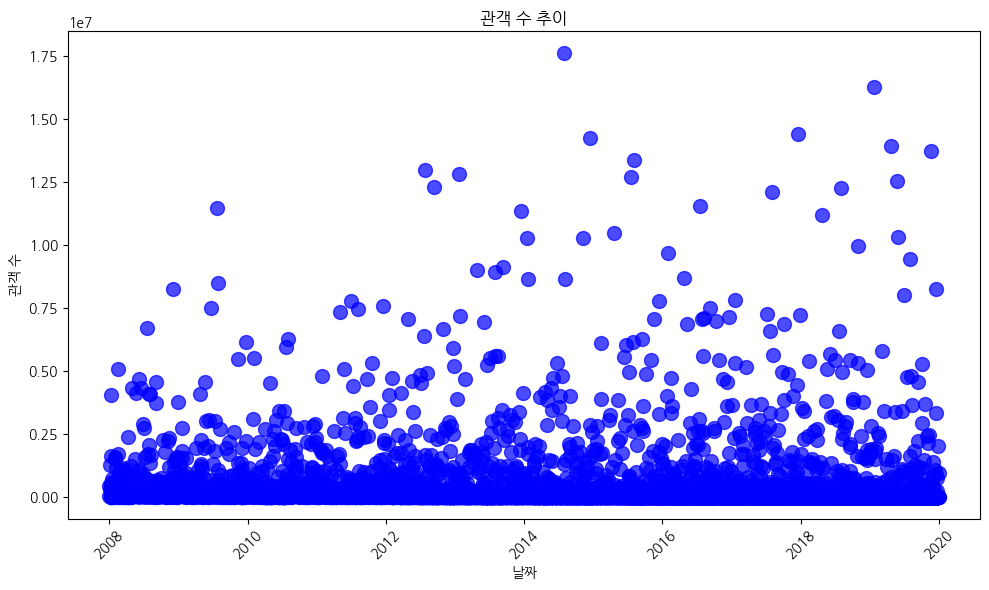

In [23]:
# 데이터프레임 생성
koreanMovies_df = pd.DataFrame(koreanMovies)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies_df['date'] = pd.to_datetime(koreanMovies_df['date']).dt.date

# 산점도 그리기 (선 없이, 포인트만 표시)
plt.figure(figsize=(10, 6))
plt.scatter(koreanMovies_df['date'], koreanMovies_df['person'], color='blue', alpha=0.7, s=100)

# 그래프 제목 및 레이블 설정
plt.title('관객 수 추이')
plt.xlabel('날짜')
plt.ylabel('관객 수')

# 날짜 포맷 조정
plt.xticks(rotation=45)

# 그래프 출력
plt.tight_layout()
# 데이터프레임 생성
koreanMovies_df = pd.DataFrame(koreanMovies)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies_df['date'] = pd.to_datetime(koreanMovies_df['date']).dt.date
plt.show()

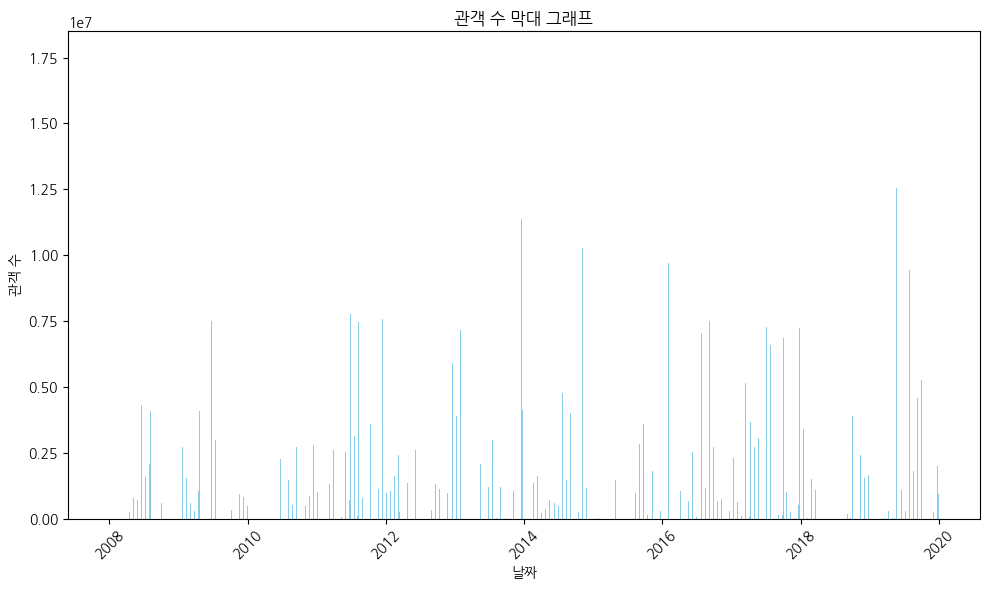

In [72]:
# 데이터프레임 생성
koreanMovies_df = pd.DataFrame(koreanMovies)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies_df['date'] = pd.to_datetime(koreanMovies_df['date']).dt.date


# 막대 그래프
plt.figure(figsize=(10, 6))
plt.bar(koreanMovies_df['date'], koreanMovies_df['person'], color='skyblue')

# 그래프 제목 및 레이블 설정
plt.title('관객 수 막대 그래프')
plt.xlabel('날짜')
plt.ylabel('관객 수')

# 날짜 포맷 조정
plt.xticks(rotation=45)

# 그래프 출력
plt.tight_layout()
plt.show()


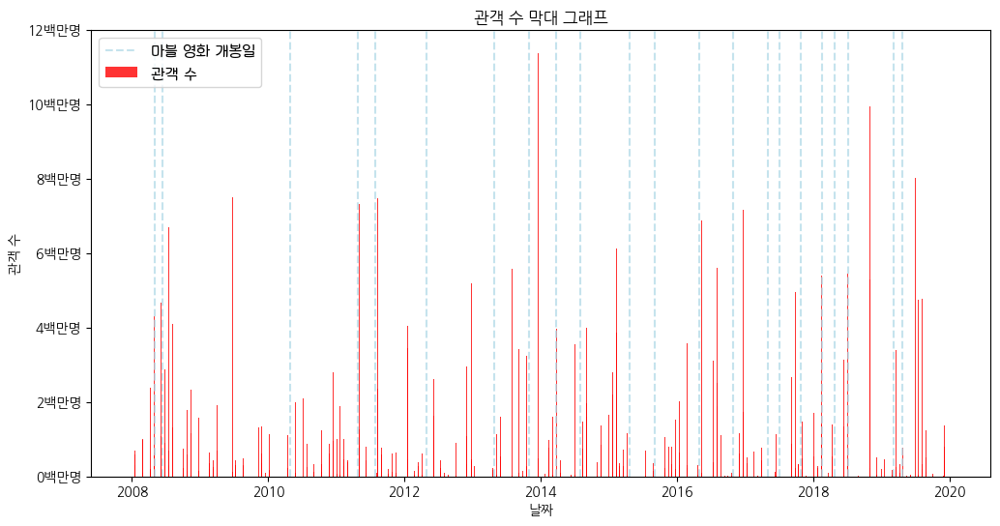

In [86]:
# 그래프 그리기 (이전에 작성한 코드를 바탕으로)
plt.figure(figsize=(12, 6))
plt.bar(koreanMovies['date'], koreanMovies['person'],color='red', alpha=0.8, label = '관객 수')

# y축을 백만 단위로 보기 쉽게 설정
def millions(x, pos):
    '1,000,000 단위로 y축 값을 백만 단위로 변경'
    return '%1.0f백만명' % (x * 1e-6)

# 마블 영화 개봉일에 수직선 표시
# 첫 번째 선에만 label을 추가해서 범례가 중복되지 않도록 함
first_label = True
for release_date in koreanMovies_marvel['date']:
    if first_label:
        plt.axvline(x=release_date, color='lightblue', linestyle='--', alpha=0.7, label='마블 영화 개봉일')
        first_label = False
    else:
        plt.axvline(x=release_date, color='lightblue', linestyle='--', alpha=0.7)

formatter = ticker.FuncFormatter(millions)
plt.gca().yaxis.set_major_formatter(formatter)

# y축 범위를 12백만명까지로 제한
plt.ylim(0, 12000000)

# 그래프 제목과 축 레이블 설정
plt.title('관객 수 막대 그래프')
plt.xlabel('날짜')
plt.ylabel('관객 수')

# 범례 추가
plt.legend(prop=fontprop)

# 그래프 출력
plt.show()

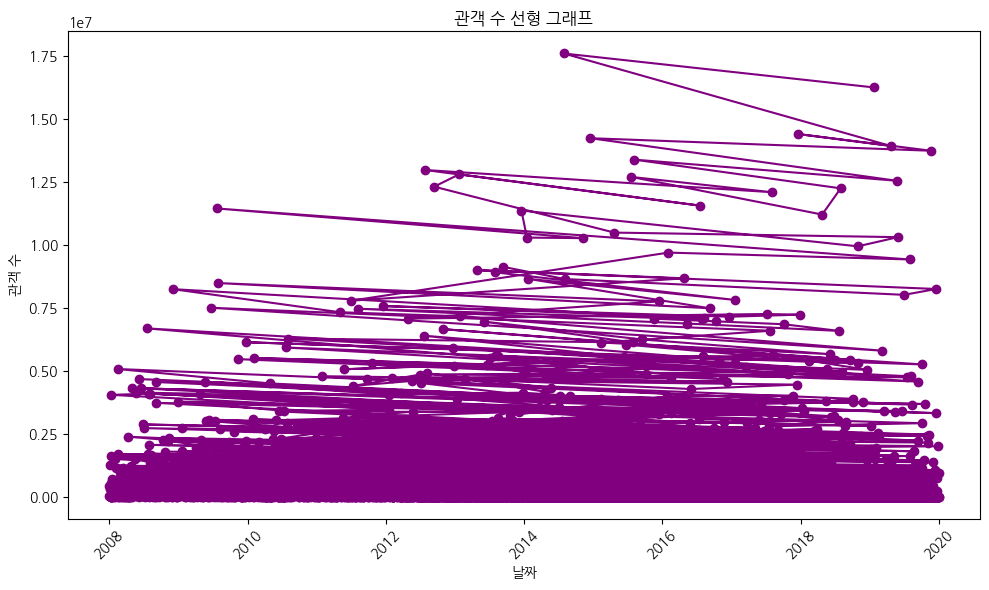

In [96]:
# 선형 그래프
plt.figure(figsize=(10, 6))
plt.plot(koreanMovies_df['date'], koreanMovies_df['person'], marker='o', color='purple')

# 그래프 제목 및 레이블 설정
plt.title('관객 수 선형 그래프')
plt.xlabel('날짜')
plt.ylabel('관객 수')

# 날짜 포맷 조정
plt.xticks(rotation=45)

# 그래프 출력
plt.tight_layout()
plt.show()


In [29]:
query_marvel = "SELECT Original_Title , Release_Date FROM marvelMovies;'"
marvel_Movies = pd.read_sql(query_marvel, mydb_aws)
marvel_Movies

/tmp/ipykernel_32898/4204857163.py:2: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  marvel_Movies = pd.read_sql(query_marvel, mydb_aws)


OperationalError: MySQL Connection not available.

In [109]:
marvel_Movies
# Release_Date를 datetime 형식으로 변환
marvel_Movies['Release_Date'] = pd.to_datetime(marvel_Movies['Release_Date'])

# 원하는 형식으로 변환 (YYYY-MM-DD)
marvel_Movies['Release_Date'] = marvel_Movies['Release_Date'].dt.strftime('%Y-%m-%d')

# 결과 확인
marvel_Movies.head()


,Original_Title,Release_Date
0,Iron Man,2008-05-02
1,The Incredible Hulk,2008-06-13
2,Iron Man 2,2010-05-07
3,Thor,2011-05-06
4,Captain America: The First Avenger,2011-07-22


In [110]:
koreanMovies_marvel.head()

,title,date
0,아이언맨,2008-04-30
1,인크레더블 헐크,2008-06-12
2,아이언맨 2,2010-04-29
3,토르: 천둥의 신,2011-04-28
4,퍼스트 어벤져,2011-07-28


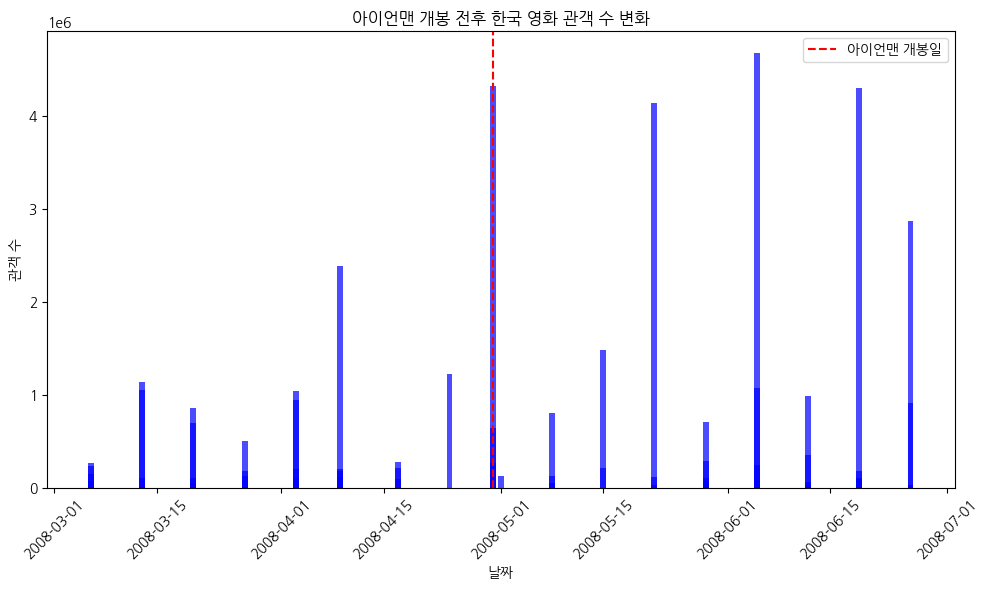

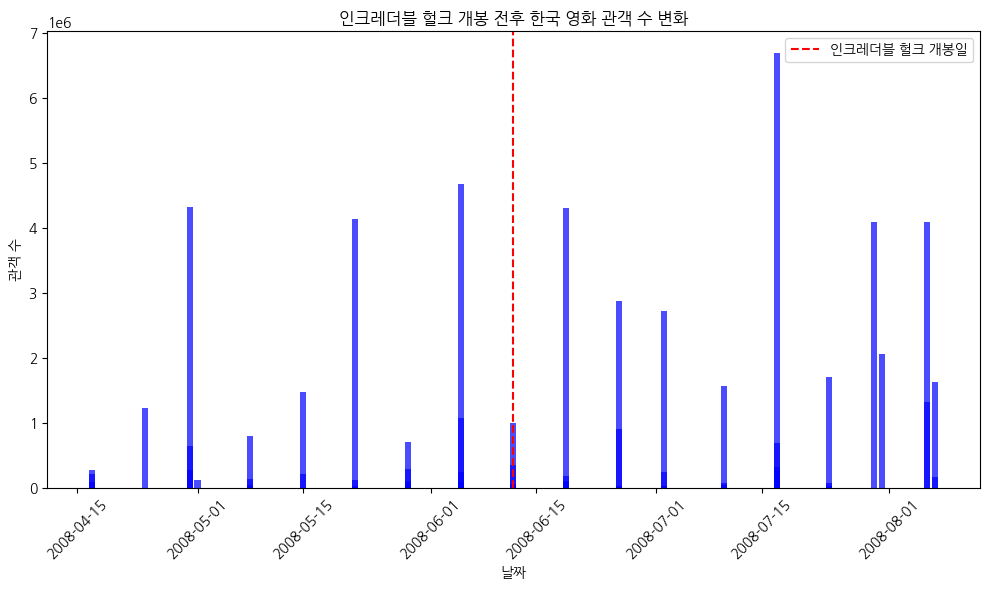

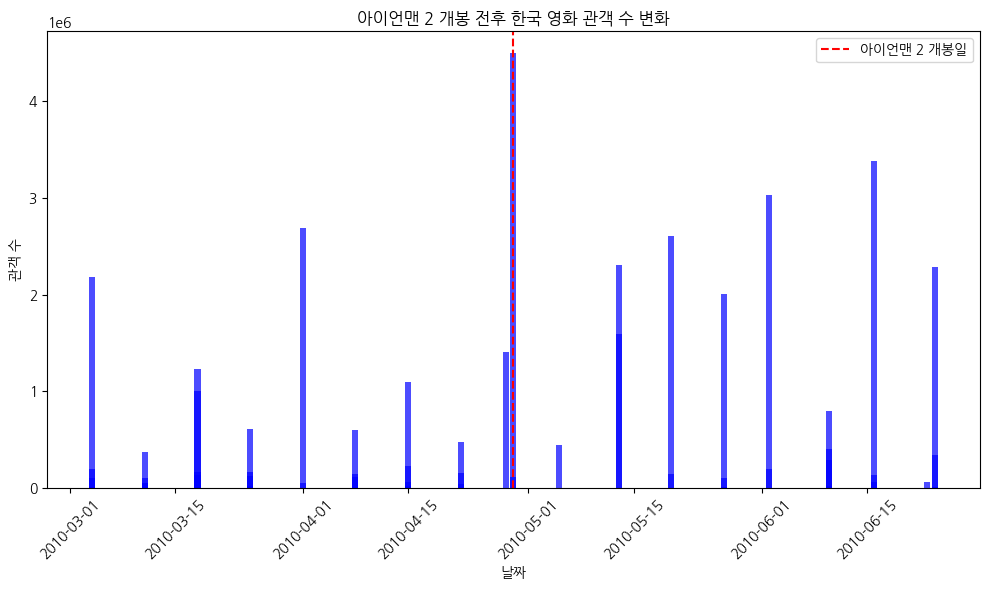

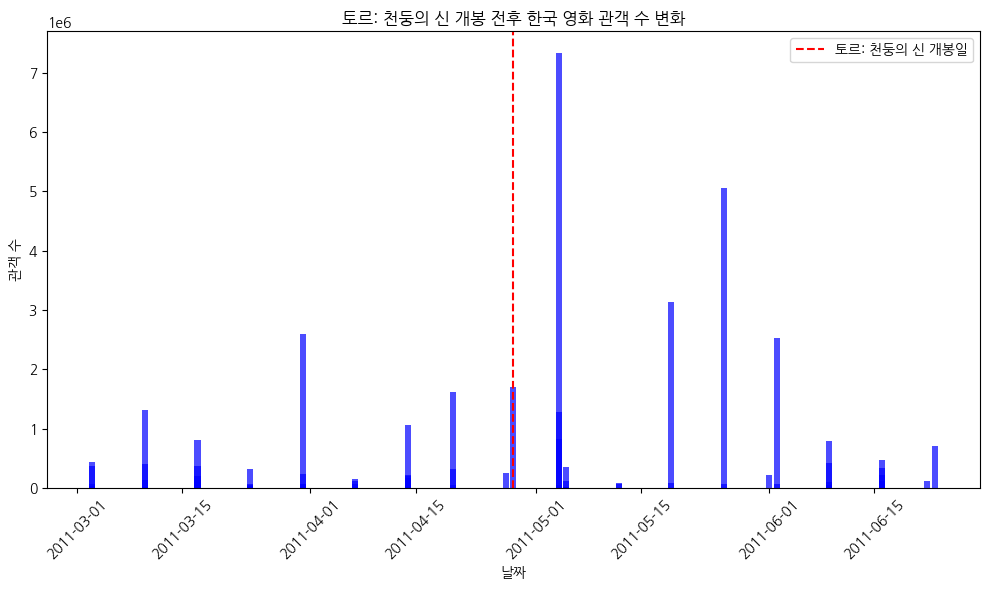

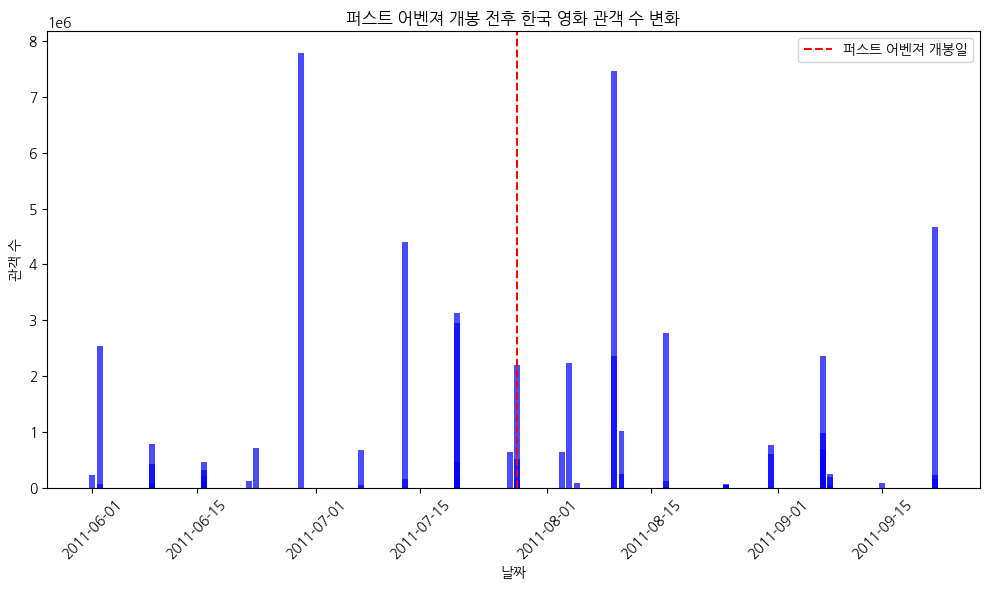

...

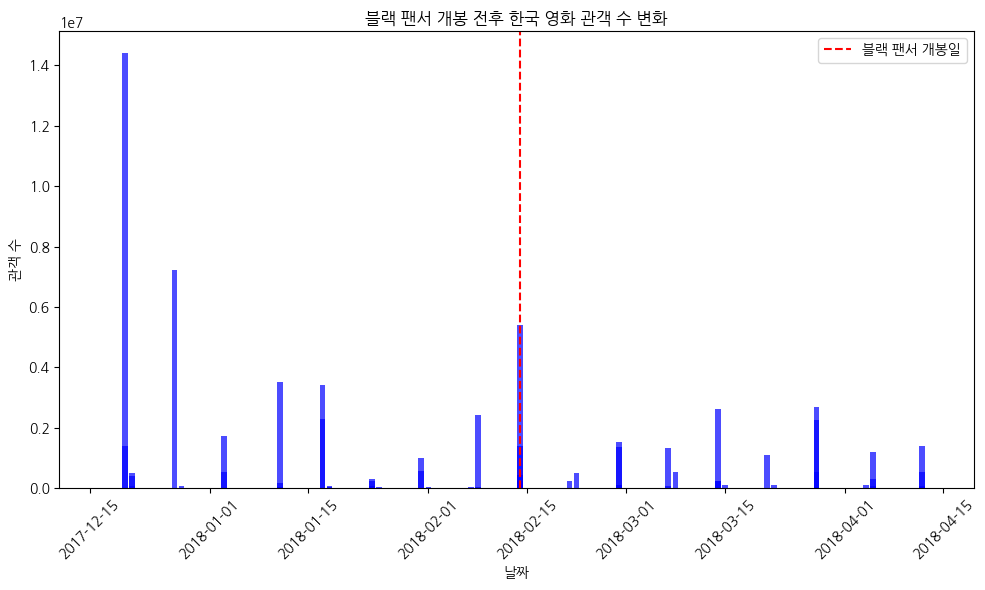

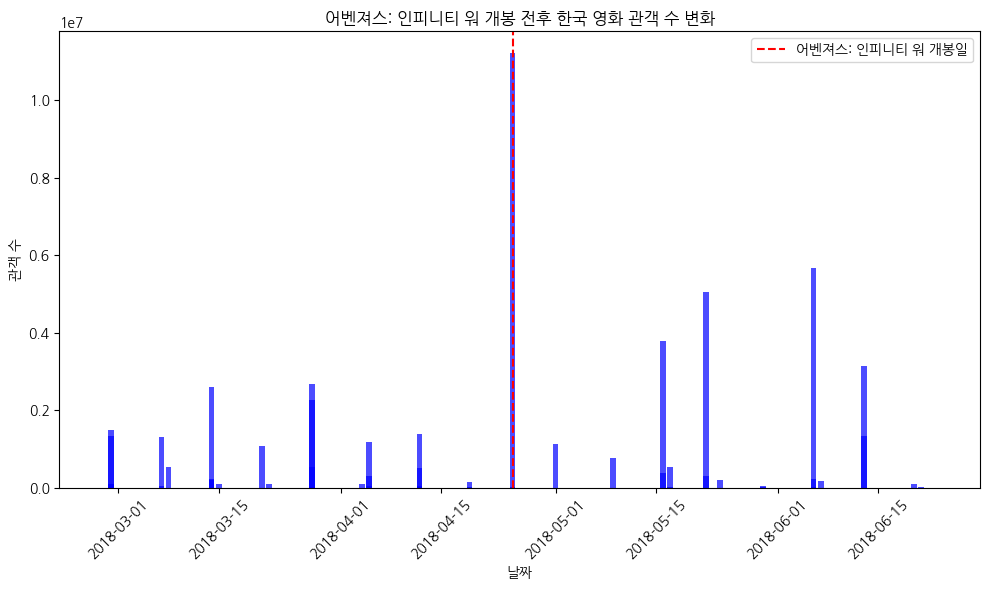

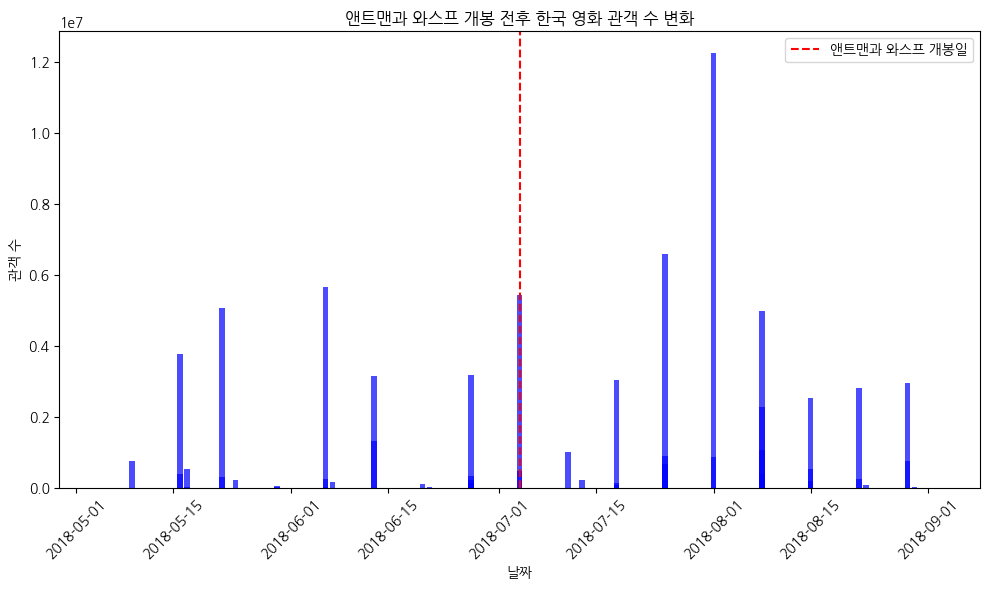

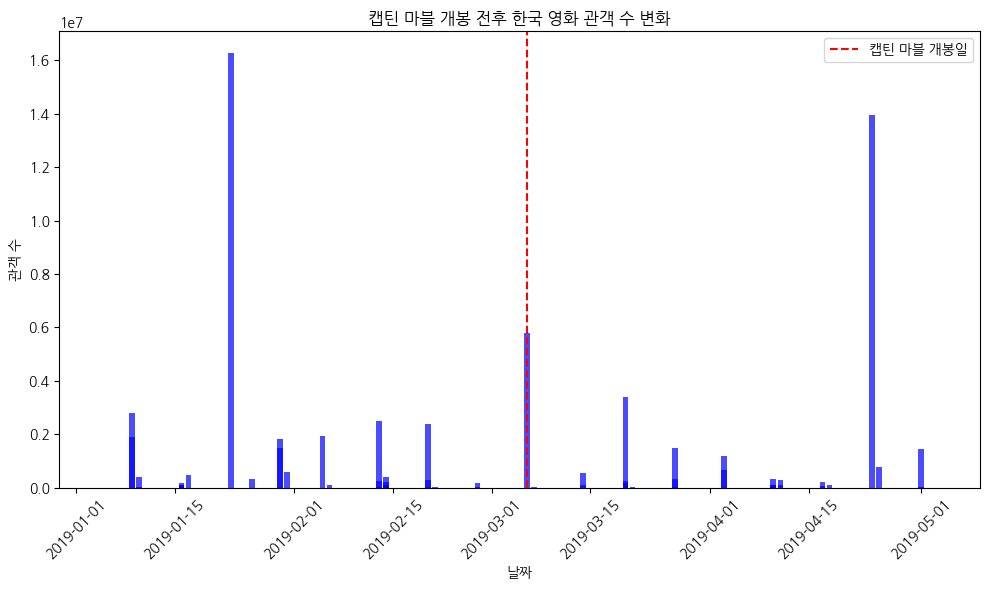

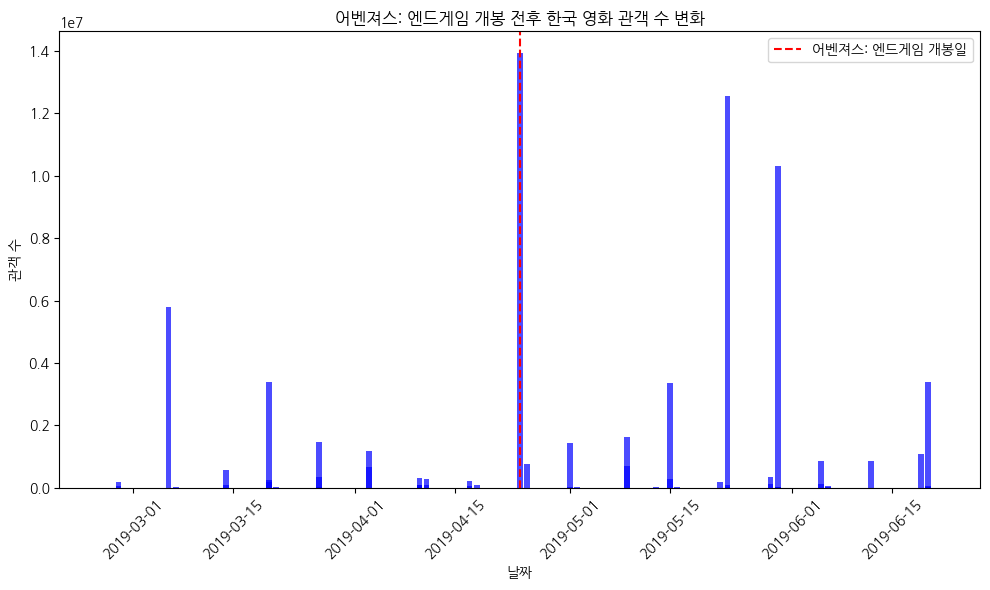

In [74]:
koreanMovies_df = pd.DataFrame(koreanMovies)
korean_marvelMovies_df = pd.DataFrame(koreanMovies_marvel)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies_df['date'] = pd.to_datetime(koreanMovies_df['date'])
korean_marvelMovies_df['date'] = pd.to_datetime(korean_marvelMovies_df['date'])

# 마블 영화 개봉일 기준으로 한국 영화의 관객 수를 분석
# 마블 영화 개봉 전후 1주일 간 한국 영화 관객 수를 추출하는 함수
def get_korean_movies_before_after(marvel_date, days=60):
    start_date = marvel_date - pd.Timedelta(days=days)
    end_date = marvel_date + pd.Timedelta(days=days)
    return koreanMovies_df[(koreanMovies_df['date'] >= start_date) & (koreanMovies_df['date'] <= end_date)]

# 마블 영화 개봉일 전후로 한국 영화 관객 수 변화 확인
for _, marvel_row in korean_marvelMovies_df.iterrows():
    marvel_date = marvel_row['date']
    marvel_title = marvel_row['title']
    
    korean_movies_window = get_korean_movies_before_after(marvel_date)
    
    # 그래프 그리기
    plt.figure(figsize=(10, 6))
    plt.bar(korean_movies_window['date'], korean_movies_window['person'], color='blue', alpha=0.7)
    plt.axvline(x=marvel_date, color='red', linestyle='--', label=f'{marvel_title} 개봉일')
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 관객 수 변화')
    plt.xlabel('날짜')
    plt.ylabel('관객 수')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()

    filename = f'{marvel_title}_관객수_변화.png'
    plt.savefig(filename)
    plt.show()

In [18]:
koreanMovies_df = pd.DataFrame(koreanMovies)
marvelMovies_df = pd.DataFrame(marvelMovies)

# 날짜 데이터를 datetime 형식으로 변환
koreanMovies_df['date'] = pd.to_datetime(koreanMovies_df['date'])
marvelMovies_df['Release_Date'] = pd.to_datetime(marvelMovies_df['Release_Date'])

# 마블 영화 개봉일 기준으로 한국 영화의 관객 수를 분석
# 마블 영화 개봉 전후 1주일 간 한국 영화 관객 수를 추출하는 함수
def get_korean_movies_before_after(marvel_date, days=7):
    start_date = marvel_date - pd.Timedelta(days=days)
    end_date = marvel_date + pd.Timedelta(days=days)
    return koreanMovies_df[(koreanMovies_df['date'] >= start_date) & (koreanMovies_df['date'] <= end_date)]

# 마블 영화 개봉일 전후로 한국 영화 관객 수 변화 확인
for _, marvel_row in marvelMovies_df.iterrows():
    marvel_date = marvel_row['Release_Date']
    marvel_title = marvel_row['Original_Title']
    
    korean_movies_window = get_korean_movies_before_after(marvel_date)
    
    # 그래프 그리기
    plt.figure(figsize=(10, 6))
    plt.bar(korean_movies_window['date'], korean_movies_window['person'], color='blue', alpha=0.7)
    plt.axvline(x=marvel_date, color='red', linestyle='--', label=f'{marvel_title} 개봉일')
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 관객 수 변화')
    plt.xlabel('날짜')
    plt.ylabel('관객 수')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

NameError: name 'marvelMovies' is not defined

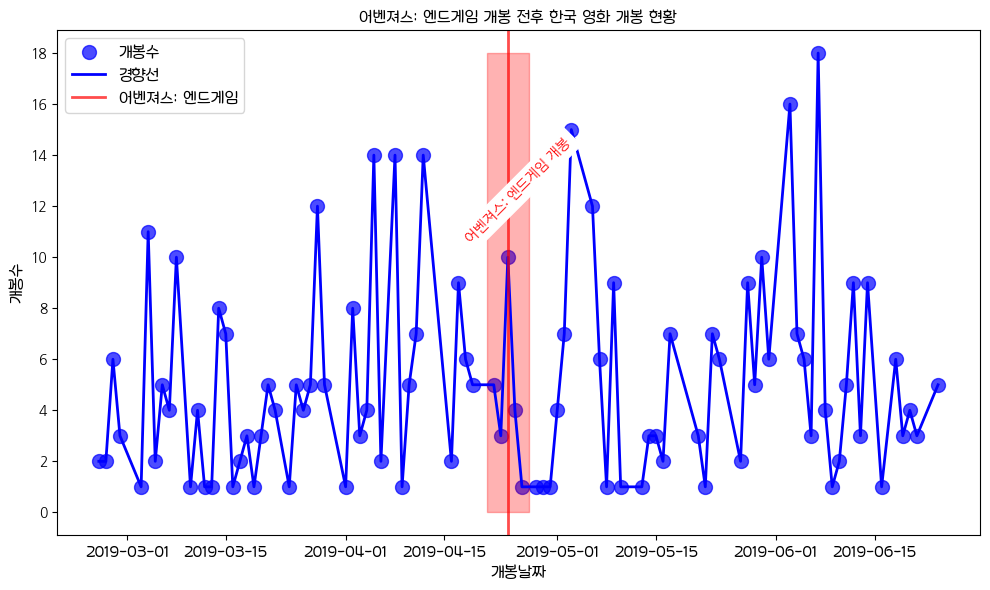

In [21]:
# 날짜 데이터를 datetime 형식으로 변환
koreanMovies_df['date'] = pd.to_datetime(koreanMovies_df['date'])
korean_marvelMovies_df['date'] = pd.to_datetime(korean_marvelMovies_df['date'])

# 1. date를 datetime 타입으로 변환
kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

# 2. 각 날짜에 해당하는 title 개수 계산
date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

# 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
fontprop = fm.FontProperties(fname=font_path, size=12)

# 4. 곡선으로 점들을 잇는 그래프 그리기
plt.figure(figsize=(10, 6))

# 5. 산점도 그리기 (원 데이터)
plt.scatter(date_count_kmovies['date'], 
            date_count_kmovies['title_count'], 
            color='blue', 
            alpha=0.7, 
            label='개봉수', s=100)

# 6. 데이터 포인트를 정확히 지나는 곡선 그리기
plt.plot(date_count_kmovies['date'], 
         date_count_kmovies['title_count'], 
         color='blue', 
         label='경향선', 
         linewidth=2)

# 7. 빨간색 직선 추가 (어벤져스: 엔드게임 개봉일 기준 3일 전후로 영역을 채우기)
highlight_start = pd.to_datetime('2019-04-21')  # 3일 전
highlight_end = pd.to_datetime('2019-04-27')    # 3일 후
release = pd.to_datetime('2019-04-24')

# 8. 영역 채우기 (투명한 연한 빨간색으로)
plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
                  highlight_start, 
                  highlight_end, 
                  color='red', 
                  alpha=0.3)  # 투명도 적용
plt.axvline(x=release, color='red', linestyle='-', alpha=0.7, linewidth=2, label='어벤져스: 엔드게임')

# 9. 텍스트 추가 (어벤져스: 엔드게임 개봉일 설명)
new_x_position = pd.to_datetime('2019-04-24') + pd.Timedelta(days=1.5)
plt.text(new_x_position, 
         max(date_count_kmovies['title_count']) * 0.7, 
         '어벤져스: 엔드게임 개봉', 
         color='red', 
         fontsize=10, 
         rotation=45, 
         ha='center', 
         va='center', 
         backgroundcolor='white')

# 10. 그래프 제목 및 라벨 설정
plt.title('어벤져스: 엔드게임 개봉 전후 한국 영화 개봉 현황', 
          fontsize=20, 
          fontproperties=fontprop, 
          weight='bold')
plt.xlabel('개봉날짜', 
           fontsize=12, 
           fontproperties=fontprop)
plt.ylabel('개봉수', 
           fontsize=12, 
           fontproperties=fontprop)
plt.xticks(rotation=0, fontproperties=fontprop)

# y축을 정수로만 표시되도록 설정
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

# 11. 그래프 레이아웃 설정
plt.tight_layout()

# 12. 범례 추가
plt.legend(prop=fontprop)

# 13. 그래프 출력
plt.show()

In [9]:
kmovies_list = [kmovies0 ,kmovies1, kmovies2, kmovies3, kmovies4, kmovies5, kmovies6, 
                kmovies7, kmovies8, kmovies9, kmovies10, kmovies11, kmovies12, 
                kmovies13, kmovies14, kmovies15, kmovies16, kmovies17, kmovies18, 
                kmovies19, kmovies20, kmovies21]

In [8]:
koreanMovies_marvel.head()

,title,date
0,아이언맨,2008-04-30
1,인크레더블 헐크,2008-06-12
2,아이언맨 2,2010-04-29
3,토르: 천둥의 신,2011-04-28
4,퍼스트 어벤져,2011-07-28


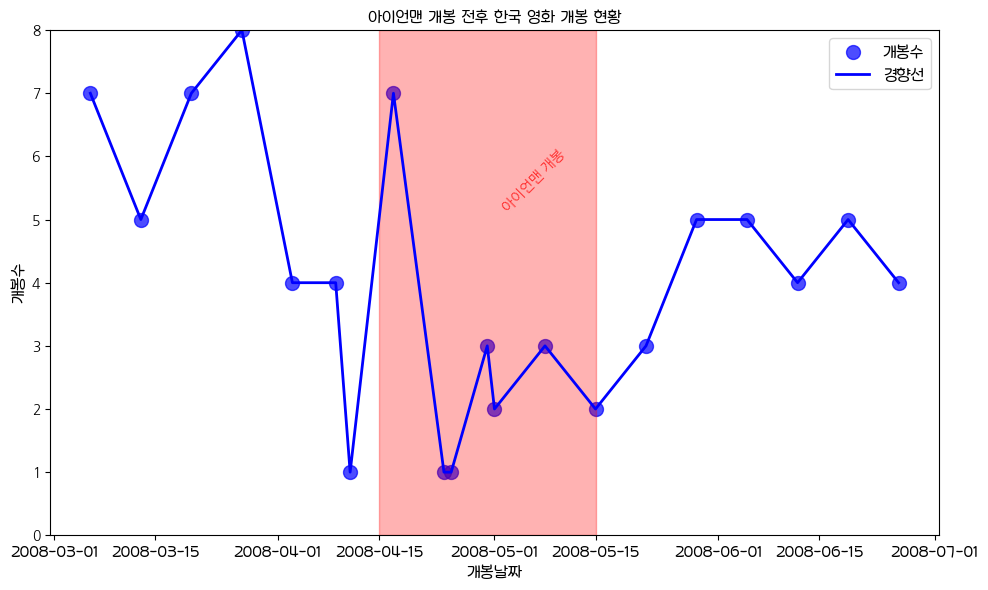

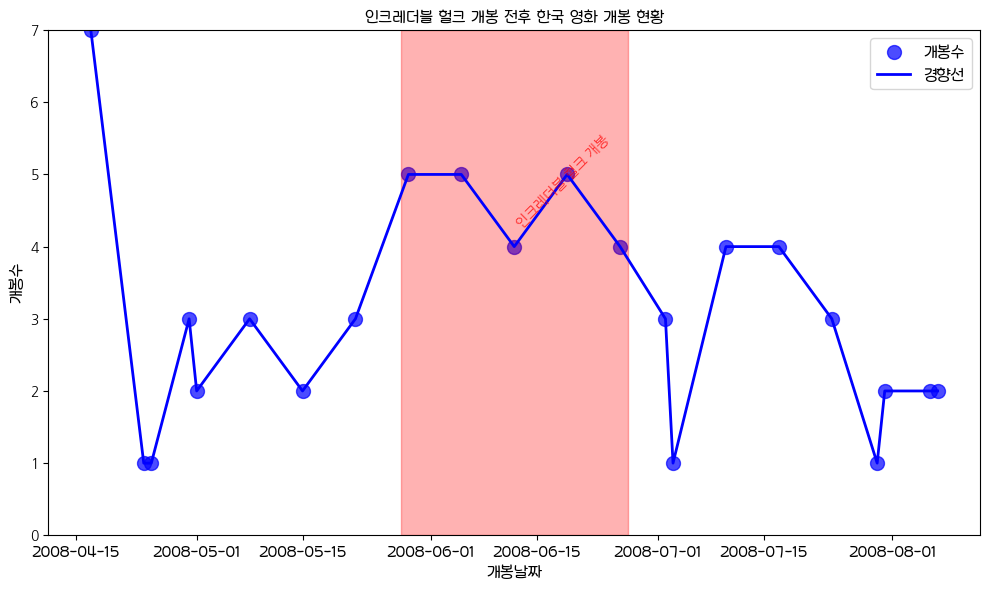

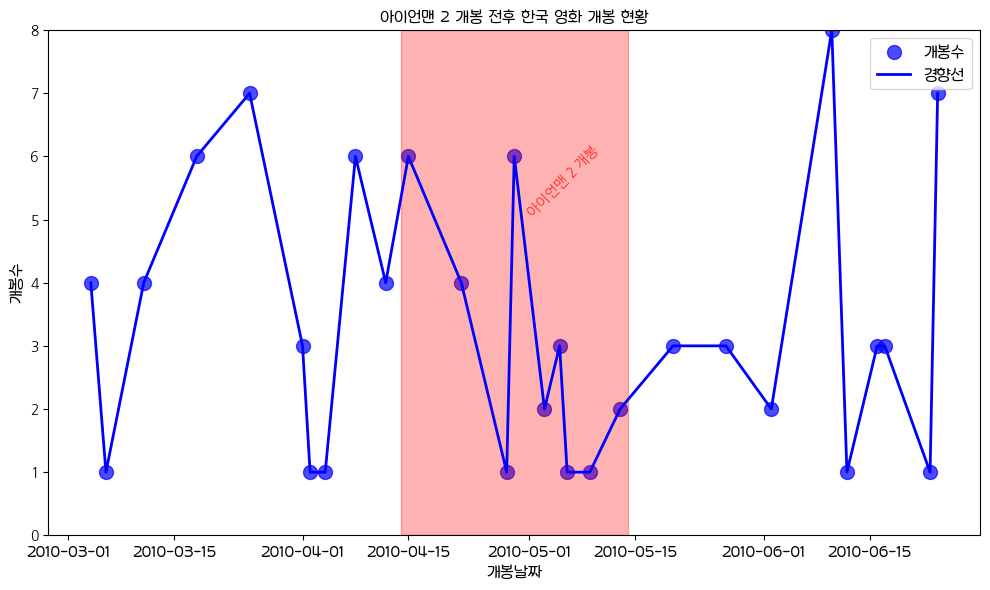

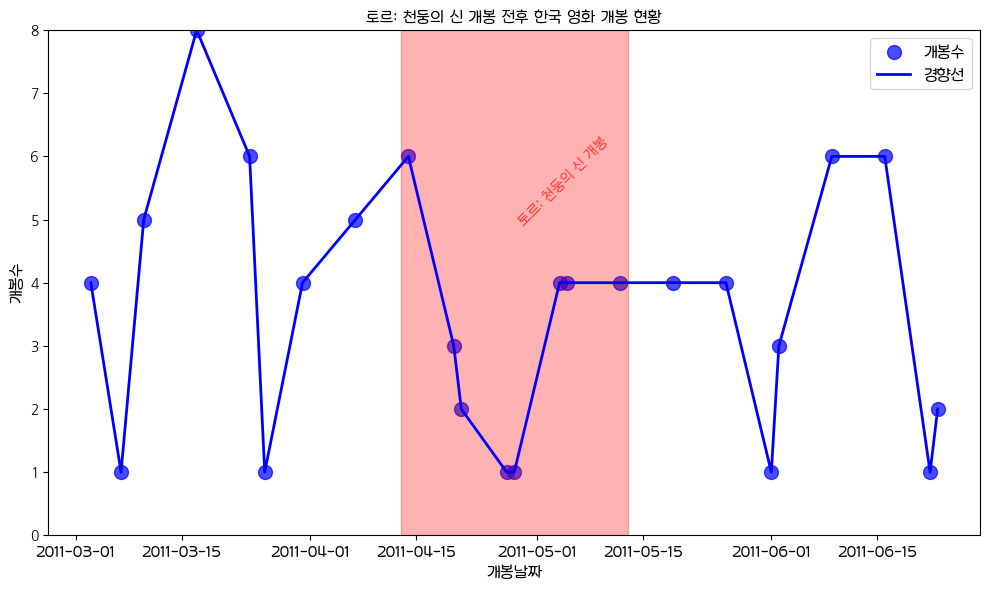

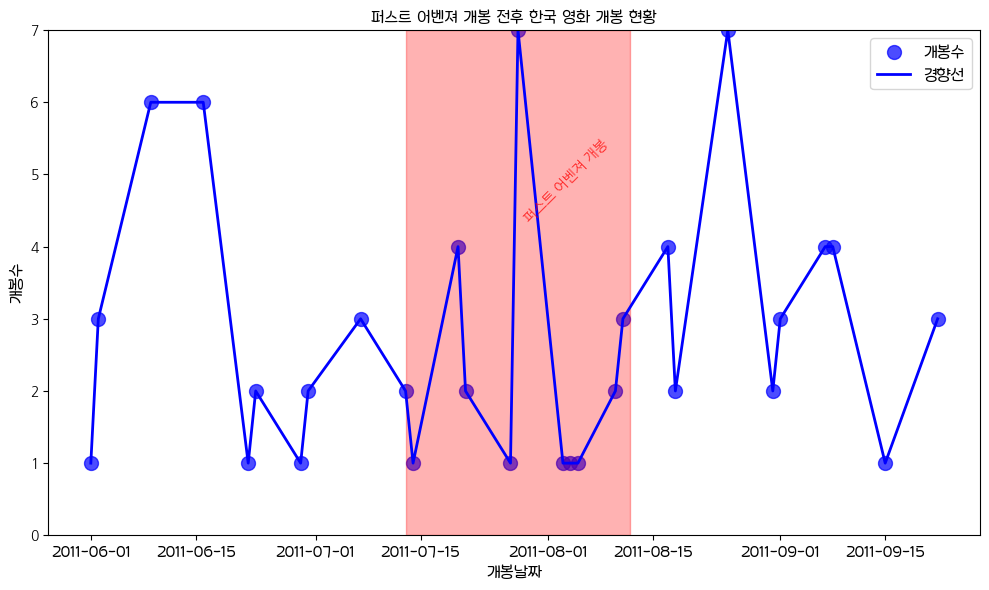

...

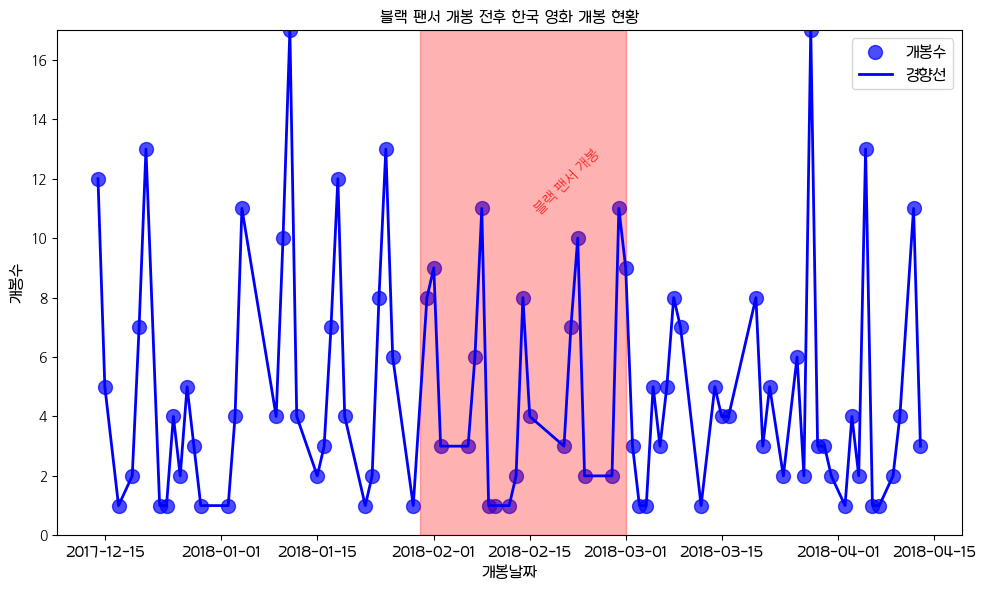

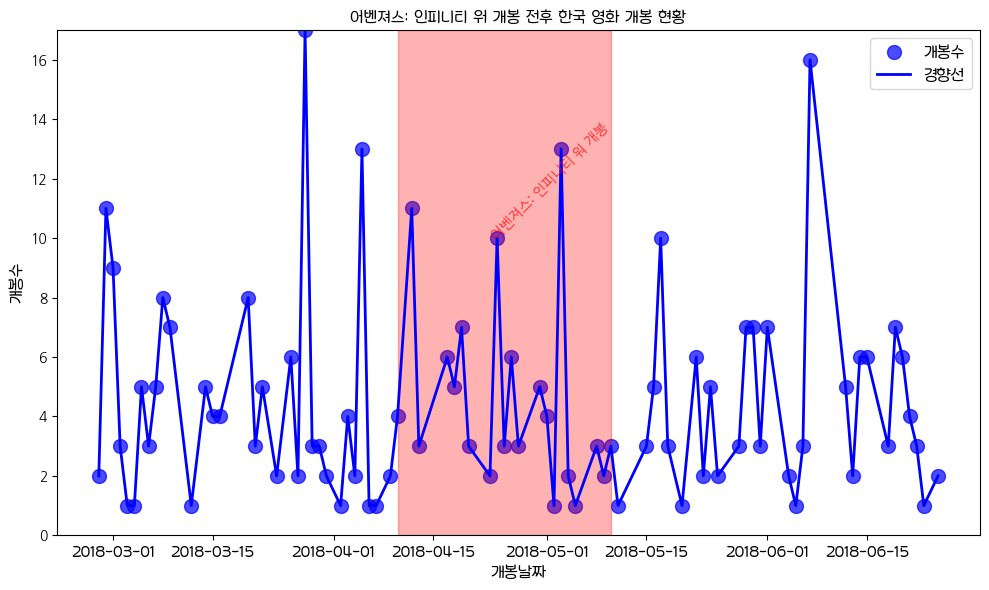

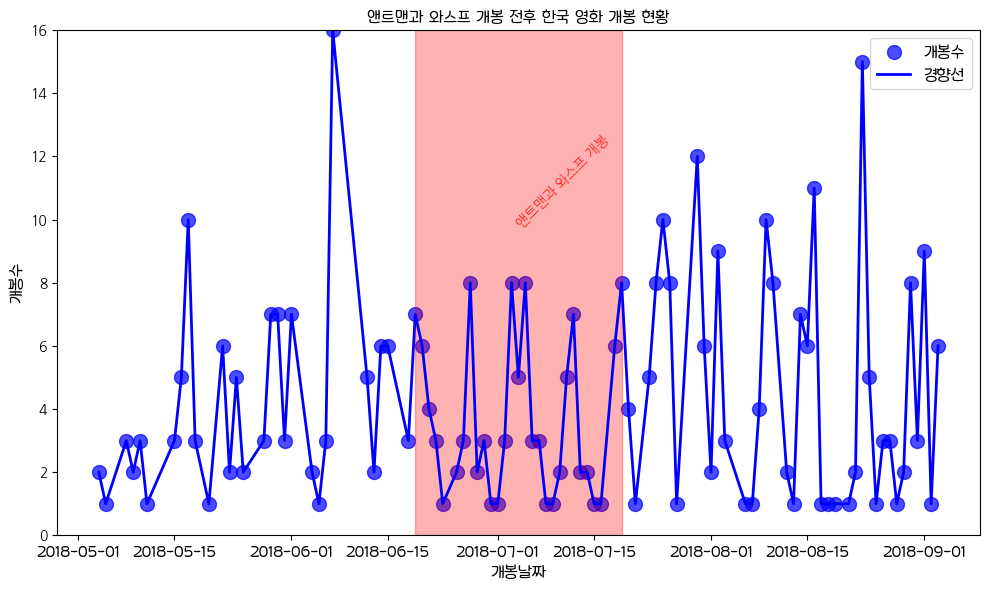

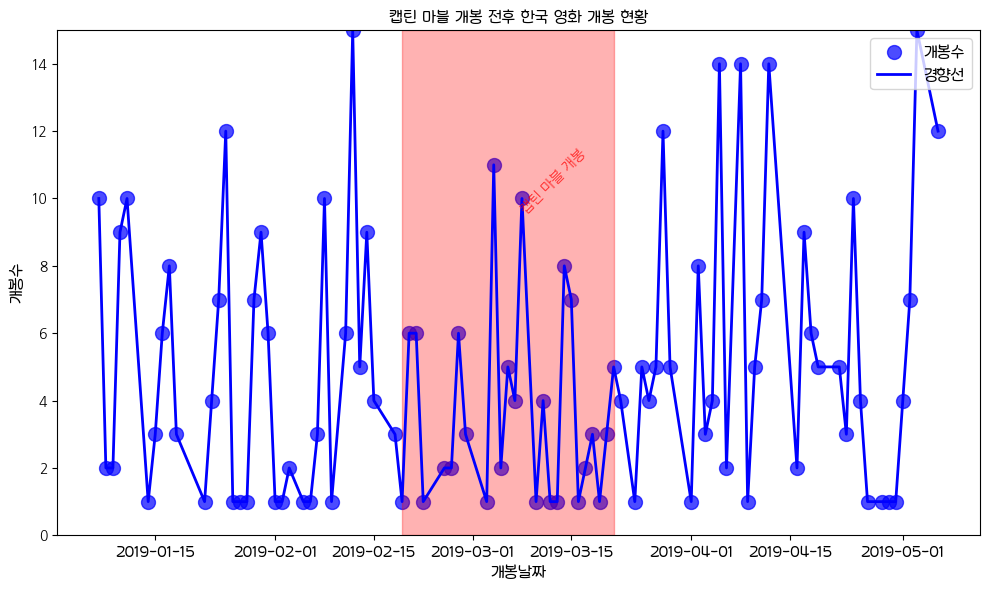

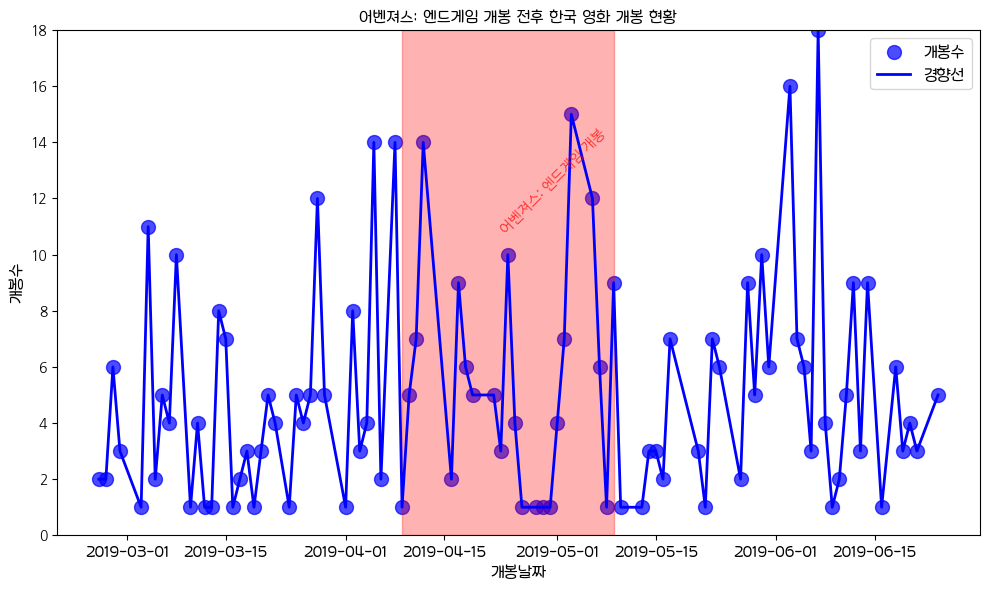

In [67]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
    fontprop = fm.FontProperties(fname=font_path, size=12)

    # 4. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 5. 산점도 그리기 (원 데이터)
    plt.scatter(date_count_kmovies['date'], 
                date_count_kmovies['title_count'], 
                color='blue', 
                alpha=0.7, 
                label='개봉수', 
                s=100)

    # 6. 데이터 포인트를 정확히 지나는 곡선 그리기
    plt.plot(date_count_kmovies['date'], 
             date_count_kmovies['title_count'], 
             color='blue', 
             label='경향선', 
             linewidth=2)

    # 7. 빨간색 직선 추가 (마블 영화 개봉일 기준 3일 전후로 영역을 채우기)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기
    
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 3일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 3일 후
    

    # 8. 영역 채우기 (투명한 연한 빨간색으로)
    # plt.fill_betweenx([0, max(date_count_kmovies['title_count'])], 
    #                   highlight_start, 
    #                   highlight_end, 
    #                   color='red', 
    #                   alpha=0.3)  # 투명도 적용
        #plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일')
# 8. 영역 채우기 (투명한 연한 빨간색으로, y축 전체를 채우도록 수정)
    plt.ylim(0, max(date_count_kmovies['title_count']))  # y축 범위를 수동으로 설정

    plt.fill_betweenx([0, max(date_count_kmovies['title_count'])],  # y축의 최소값과 최대값을 가져옴
                    highlight_start, 
                    highlight_end, 
                    color='red', 
                    alpha=0.3)  # 투명도 적용



    # 9. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max(date_count_kmovies['title_count']) * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=45, 
             ha='center', 
             va='center', 
             alpha = 0.8)
    
 

    # 10. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=fontprop, 
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.xticks(rotation=0, fontproperties=fontprop)

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 11. 그래프 레이아웃 설정
    plt.tight_layout()

    # 12. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 13. 그래프 출력
    plt.show()


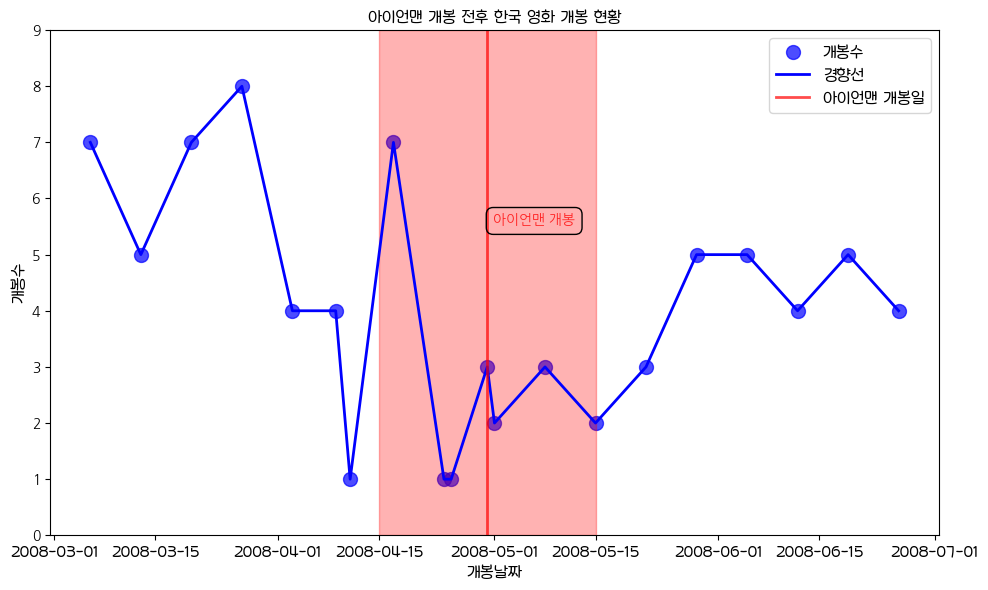

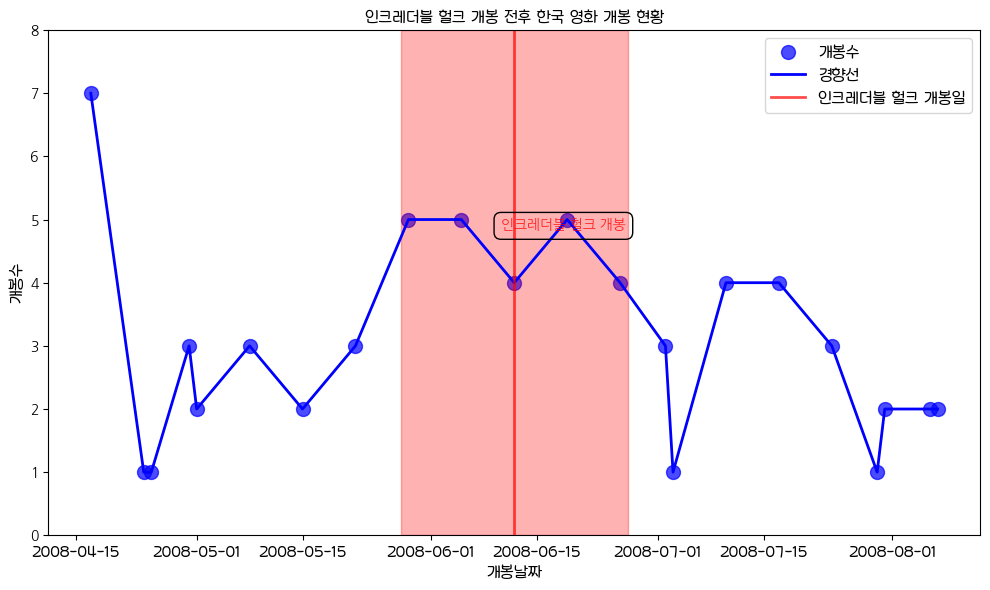

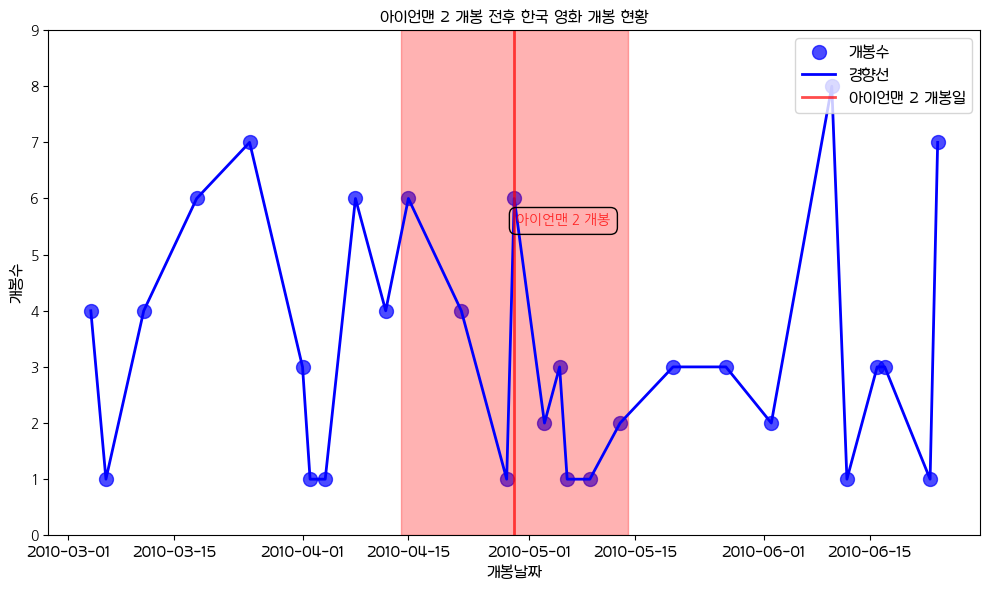

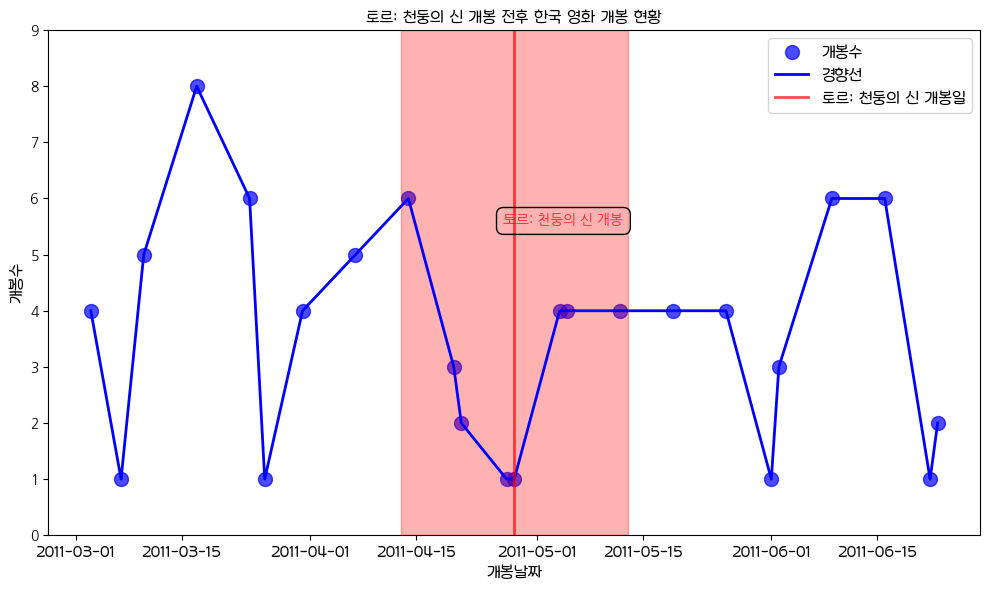

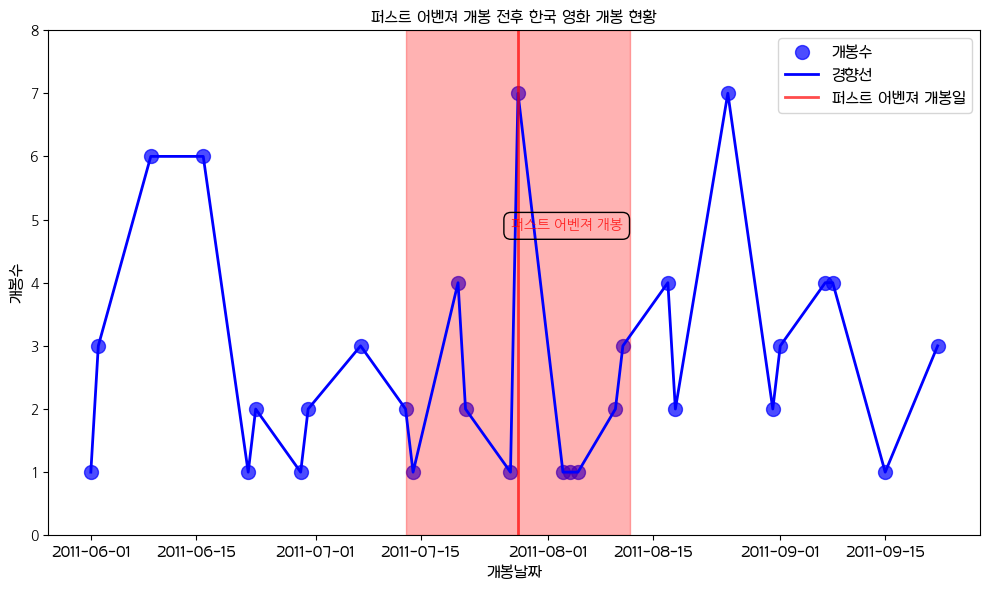

...

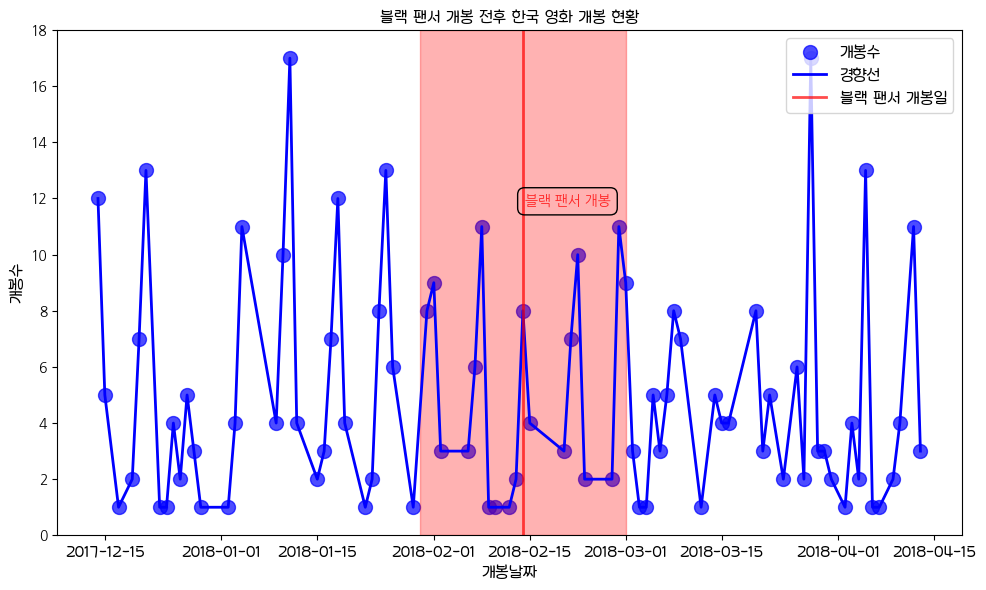

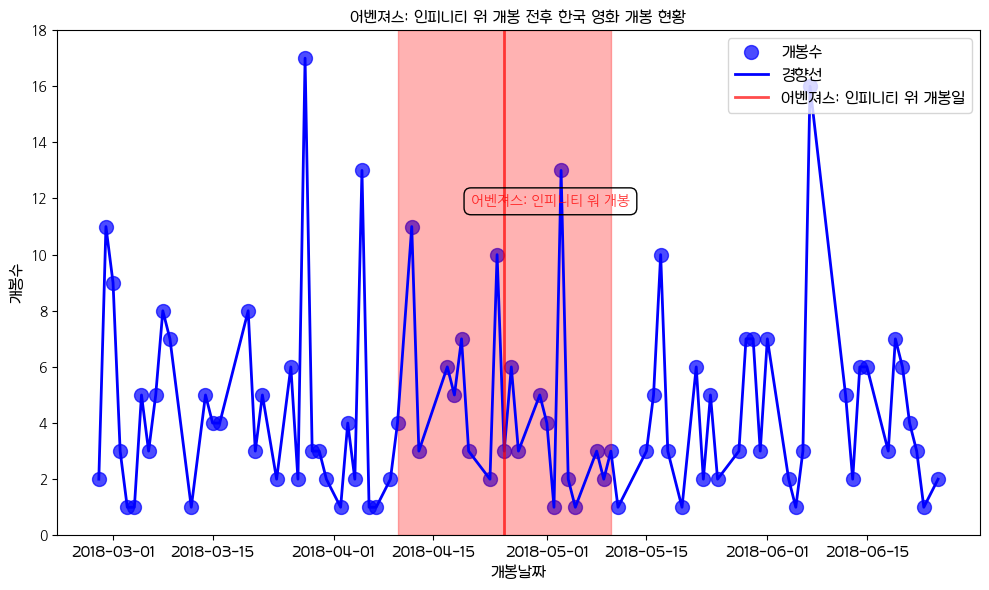

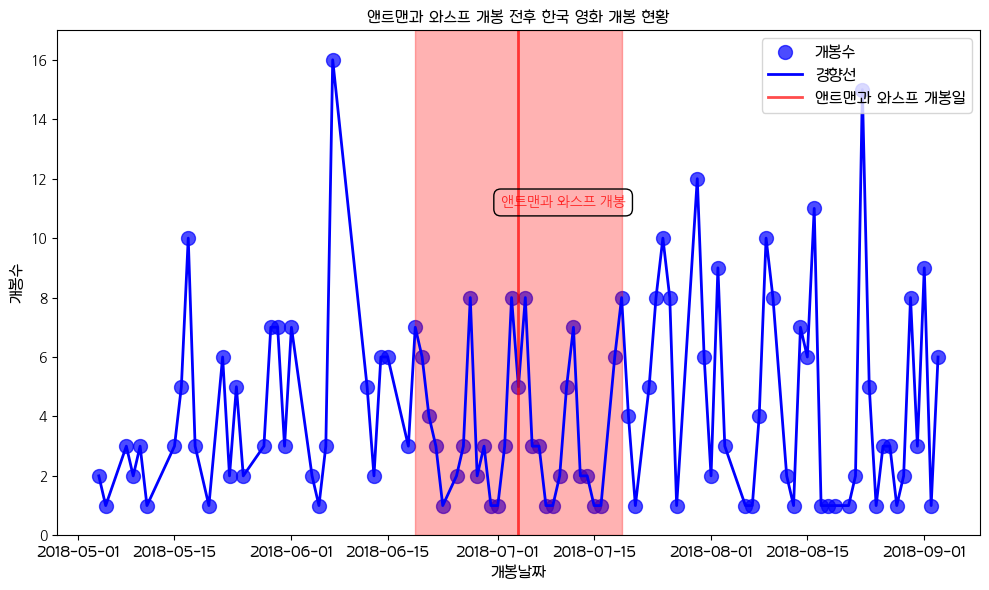

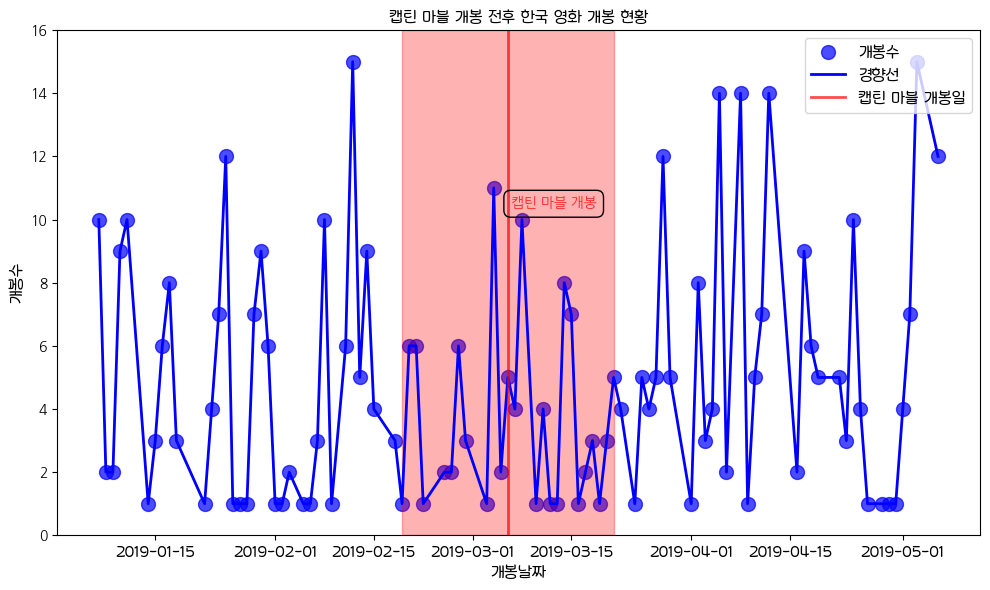

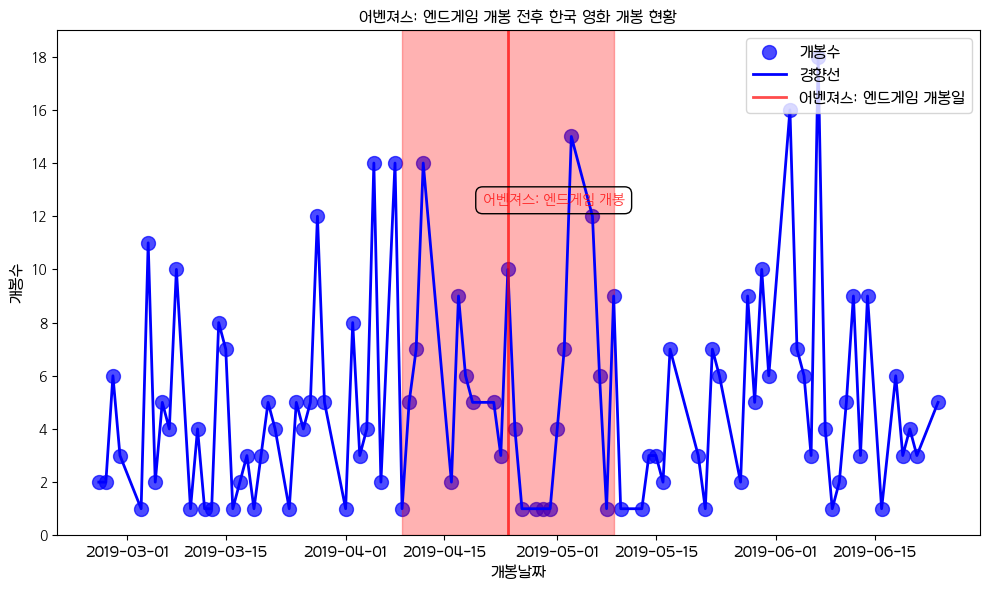

In [73]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
    fontprop = fm.FontProperties(fname=font_path, size=12)

    # 4. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 5. 산점도 그리기 (원 데이터)
    plt.scatter(date_count_kmovies['date'], 
                date_count_kmovies['title_count'], 
                color='blue', 
                alpha=0.7, 
                label='개봉수', 
                s=100)

    # 6. 데이터 포인트를 정확히 지나는 곡선 그리기
    plt.plot(date_count_kmovies['date'], 
             date_count_kmovies['title_count'], 
             color='blue', 
             label='경향선', 
             linewidth=2)

    # 7. 빨간색 직선 추가 (마블 영화 개봉일 기준 3일 전후로 영역을 채우기)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기
    
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후

    # y축의 범위를 수동으로 설정 (최대값을 약간 더 크게 설정)
    y_max = max(date_count_kmovies['title_count']) + 1  # 최대값보다 1 크게 설정
    plt.ylim(0, y_max)  # y축 범위를 0부터 y_max까지 설정

    # 8. 영역 채우기 (투명한 연한 빨간색으로, y축 전체를 채우도록 수정)
    plt.fill_betweenx([0, y_max],  # y축의 최소값과 최대값을 가져옴
                      highlight_start, 
                      highlight_end, 
                      color='red', 
                      alpha=0.3)  # 투명도 적용
                      
    plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일')




    # 9. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max(date_count_kmovies['title_count']) * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=0, 
             ha='center', 
             va='center', 
             alpha=0.8,
             bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.5'))  # 네모 박스 추가

    # 10. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=fontprop, 
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.xticks(rotation=0, fontproperties=fontprop)

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 11. 그래프 레이아웃 설정
    plt.tight_layout()

    # 12. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 13. 그래프 출력
    plt.show()


ValueError: Array must not contain infs or nans.

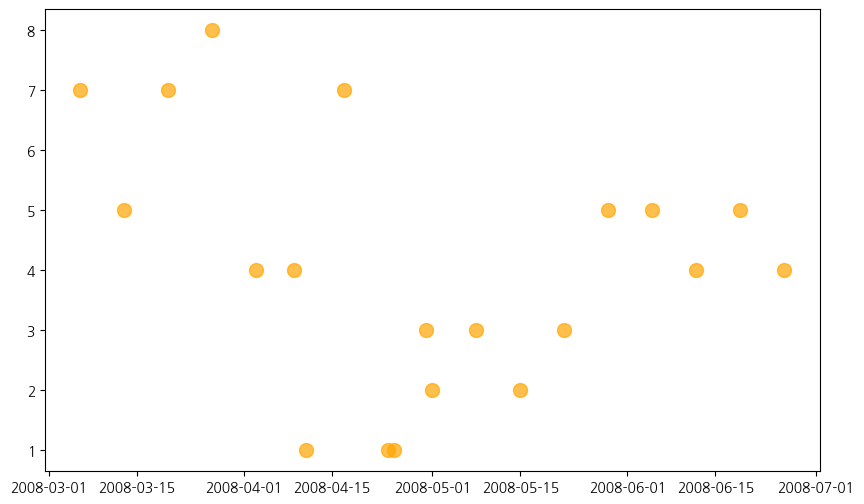

In [10]:
import matplotlib.dates as mdates

# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 월별 평균 계산 (날짜를 월별로 묶고 합한 후 평균을 구함)
    monthly_avg = date_count_kmovies.resample('D', on='date').mean().reset_index()

    # 4. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
    fontprop = fm.FontProperties(fname=font_path, size=12)

    # 5. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 6. 월별 평균 개봉 수를 점으로 그리기
    plt.scatter(monthly_avg['date'], 
                monthly_avg['title_count'], 
                color='orange', 
                label='월별 평균 개봉수', 
                s=100, alpha=0.7)

    # 7. 점들을 곡선으로 부드럽게 이어주기
    # x축 (date를 숫자로 변환)
    x = np.arange(len(monthly_avg['date']))
    y = monthly_avg['title_count']

    # 곡선으로 부드럽게 이어주는 부분
    spline = make_interp_spline(x, y)
    x_smooth = np.linspace(x.min(), x.max(), 300)  # 300개의 점으로 곡선을 부드럽게 만들기
    y_smooth = spline(x_smooth)

    # 부드러운 곡선 그리기 (x_smooth를 원래 date 값으로 매핑)
    dates_smooth = np.linspace(monthly_avg['date'].min().value, monthly_avg['date'].max().value, 300)
    dates_smooth = pd.to_datetime(dates_smooth)  # 숫자로 된 timestamp를 다시 datetime으로 변환
    plt.plot(dates_smooth, y_smooth, color='orange', label='월별 평균 개봉수', linewidth=2)

    # 8. 빨간색 직선 추가 (마블 영화 개봉일 기준)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기

    # x축에 마블 영화 개봉일을 직선으로 표시
    plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일')

    # 9. 영역 채우기 (투명한 연한 빨간색으로)
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후
    plt.ylim(0, max(date_count_kmovies['title_count']))  # y축 범위를 수동으로 설정

    plt.fill_betweenx([0, max(date_count_kmovies['title_count'])],  # y축의 최소값과 최대값을 가져옴
                    highlight_start, 
                    highlight_end, 
                    color='red', 
                    alpha=0.3)  # 투명도 적용

    # 10. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max(date_count_kmovies['title_count']) * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=45, 
             ha='center', 
             va='center', 
             alpha=0.8)

    # x축을 월별로 포맷
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  # x축을 월 단위로
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # 날짜 형식을 'YYYY-MM'으로

    # 11. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=fontprop, 
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.xticks(rotation=0, fontproperties=fontprop)  # x축의 날짜를 45도 회전

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 12. 그래프 레이아웃 설정
    plt.tight_layout()

    # 13. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 14. 그래프 출력
    plt.show()


In [11]:
import numpy as np
from scipy.interpolate import make_interp_spline

# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 월별 평균 계산 (날짜를 월별로 묶고 합한 후 평균을 구함)
    monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()

    # 4. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
    fontprop = fm.FontProperties(fname=font_path, size=12)

    # 5. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 6. 월별 평균 개봉 수를 점으로 그리기
    plt.scatter(monthly_avg['date'], 
                monthly_avg['title_count'], 
                color='orange', 
                label='월별 평균 개봉수', 
                s=100, alpha=0.7)

    # 7. 점들을 곡선으로 부드럽게 이어주기
    # x축 (date를 숫자로 변환)
    x = np.arange(len(monthly_avg['date']))
    y = monthly_avg['title_count']

    # 곡선으로 부드럽게 이어주는 부분
    spline = make_interp_spline(x, y)
    x_smooth = np.linspace(x.min(), x.max(), 300)  # 300개의 점으로 곡선을 부드럽게 만들기
    y_smooth = spline(x_smooth)

    # 부드러운 곡선 그리기 (x_smooth를 원래 date 값으로 매핑)
    dates_smooth = np.linspace(monthly_avg['date'].min().value, monthly_avg['date'].max().value, 300)
    dates_smooth = pd.to_datetime(dates_smooth)  # 숫자로 된 timestamp를 다시 datetime으로 변환
    plt.plot(dates_smooth, y_smooth, color='orange', label='월별 평균 개봉수', linewidth=2)

    # 8. 빨간색 직선 추가 (마블 영화 개봉일 기준)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기

    # x축에 마블 영화 개봉일을 직선으로 표시
    plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일')

    # 9. 영역 채우기 (투명한 연한 빨간색으로)
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후
    plt.ylim(0, max(date_count_kmovies['title_count']))  # y축 범위를 수동으로 설정

    plt.fill_betweenx([0, max(date_count_kmovies['title_count'])],  # y축의 최소값과 최대값을 가져옴
                    highlight_start, 
                    highlight_end, 
                    color='red', 
                    alpha=0.3)  # 투명도 적용

    # 10. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max(date_count_kmovies['title_count']) * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=45, 
             ha='center', 
             va='center', 
             alpha=0.8)
    
    # 11. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=fontprop, 
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.xticks(rotation=0, fontproperties=fontprop)

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 12. 그래프 레이아웃 설정
    plt.tight_layout()

    # 13. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 14. 그래프 출력
    plt.show()


/tmp/ipykernel_6767/871637348.py:17: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'

Error in callback <function _draw_all_if_interactive at 0x7a00cd567250> (for post_execute), with arguments args (),kwargs {}:


FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'

<Figure size 1000x600 with 1 Axes>

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


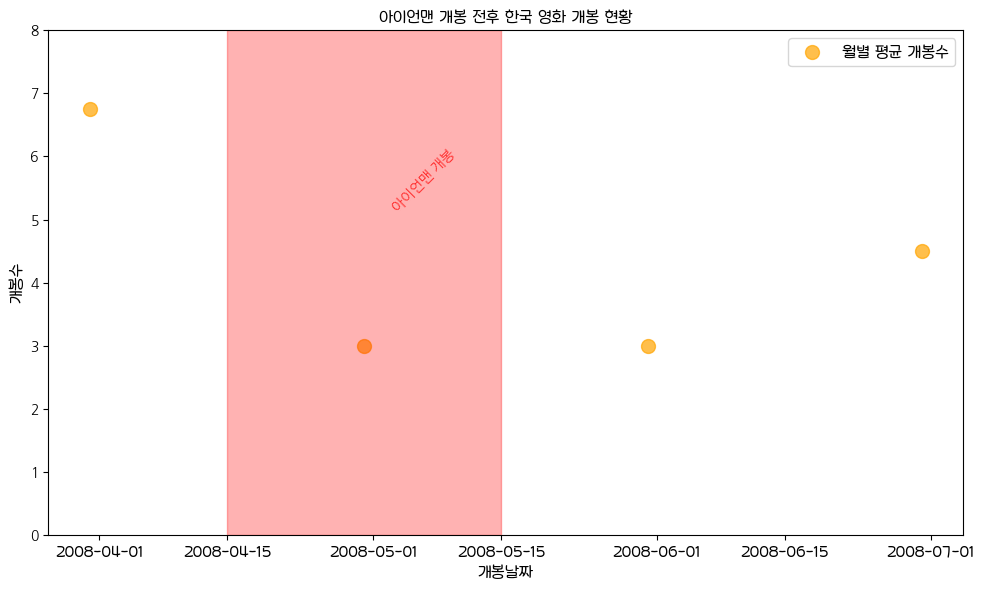

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


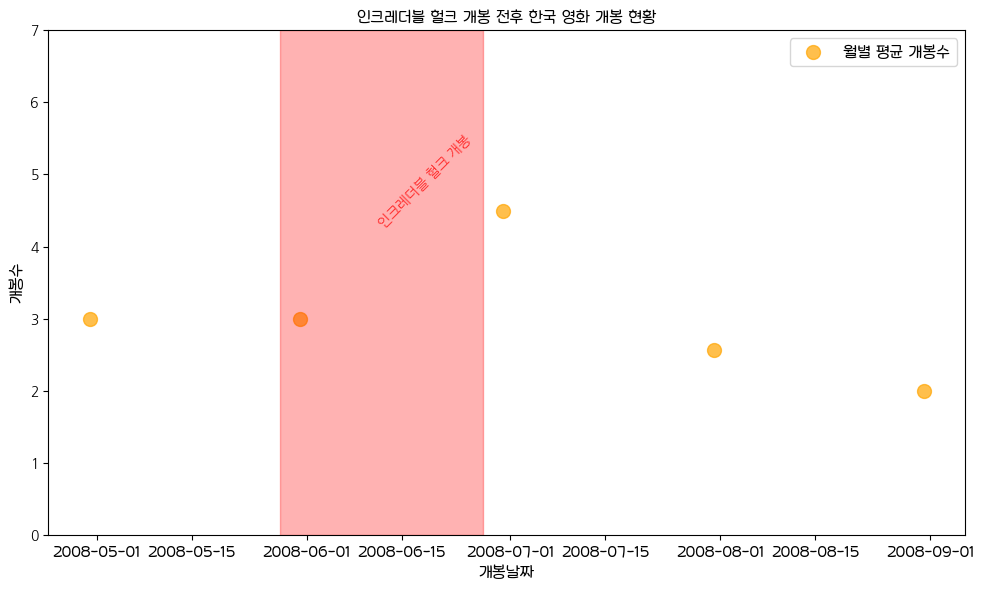

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


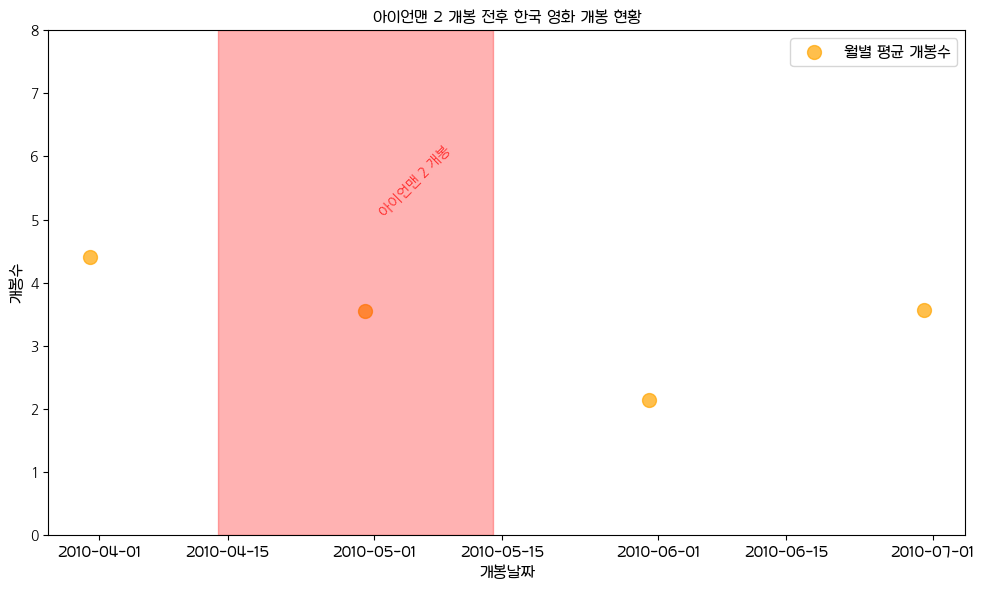

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


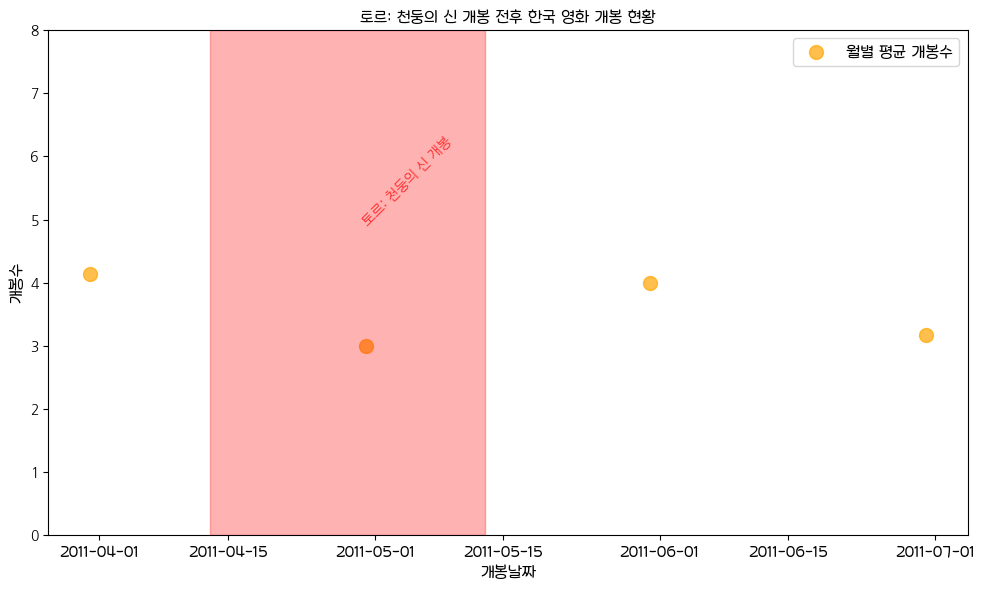

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


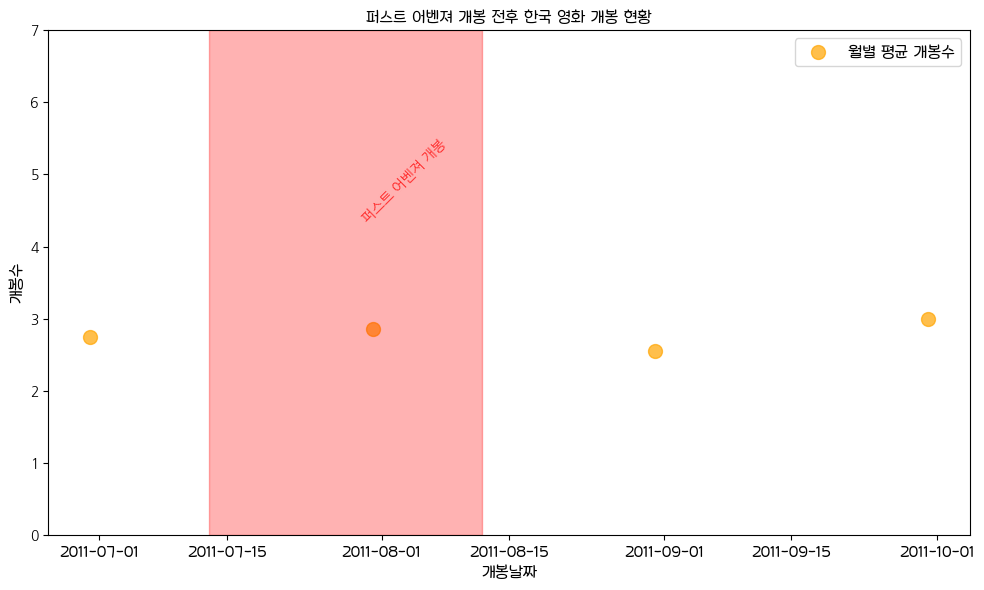

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


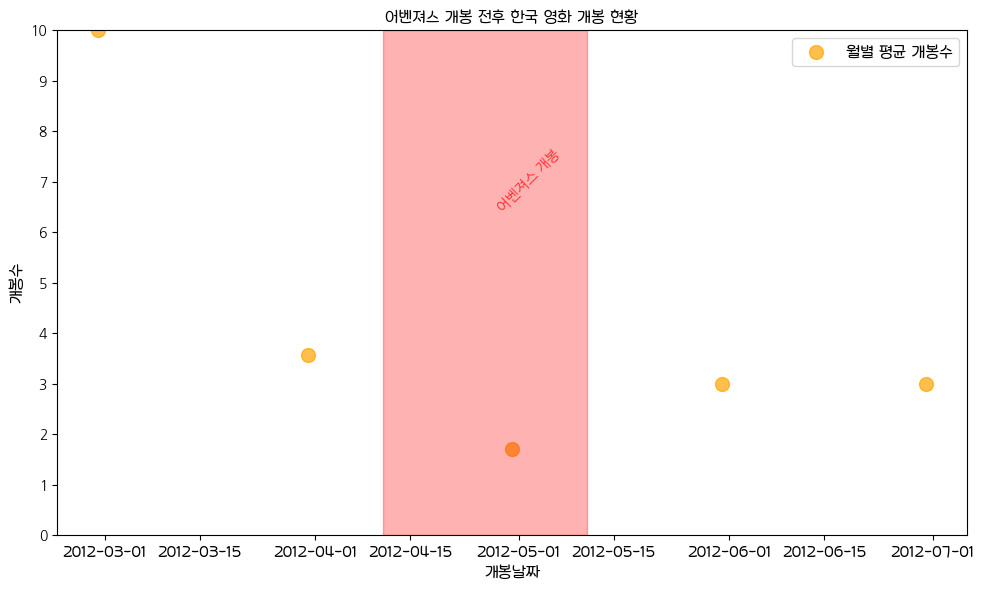

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


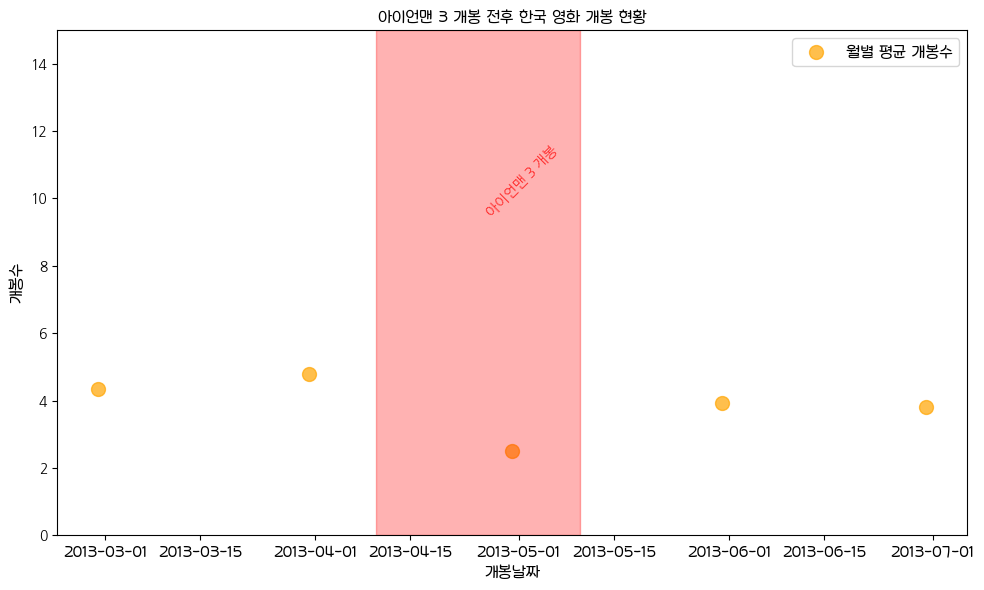

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


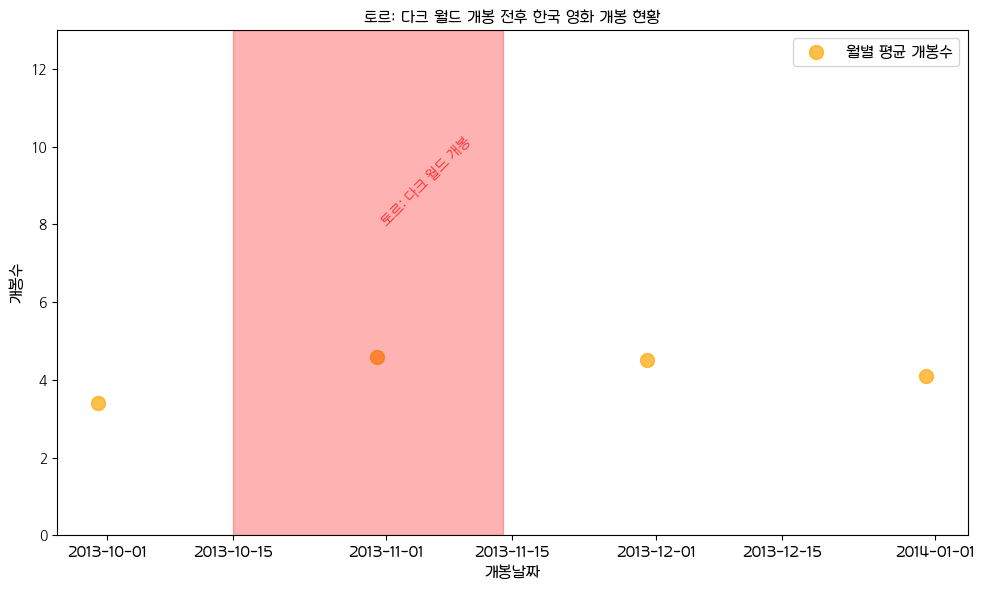

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


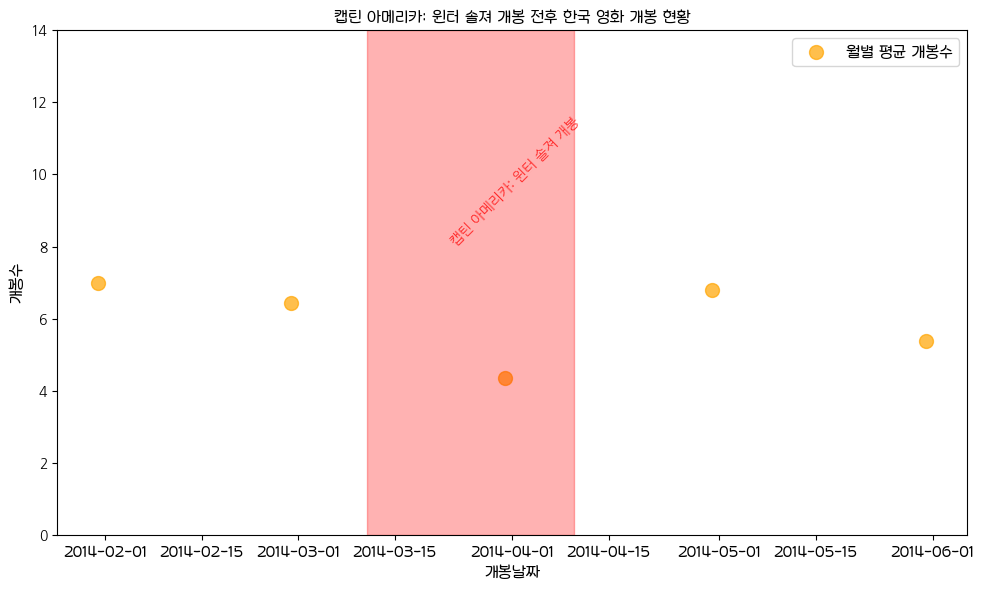

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


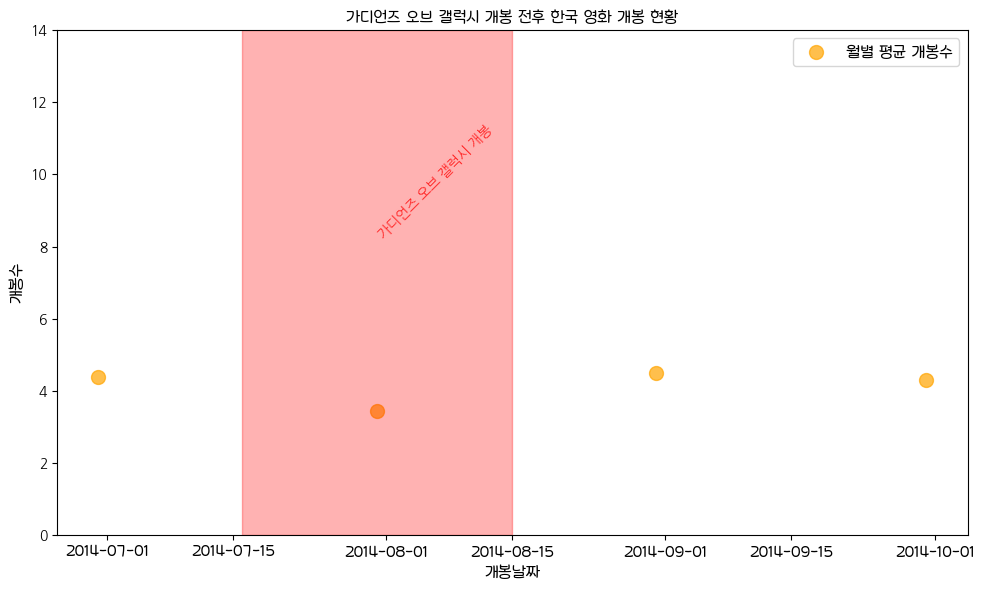

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


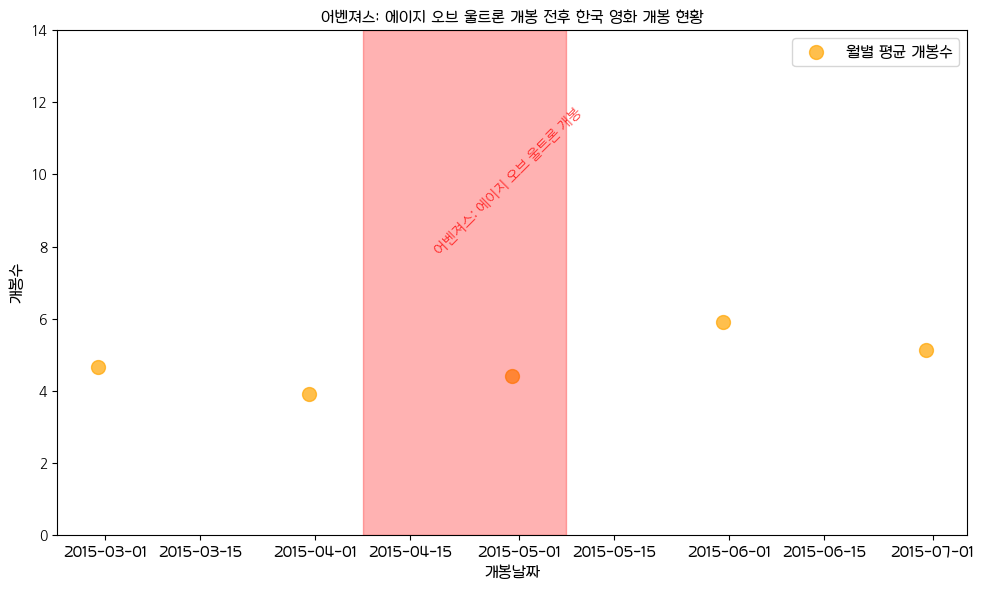

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


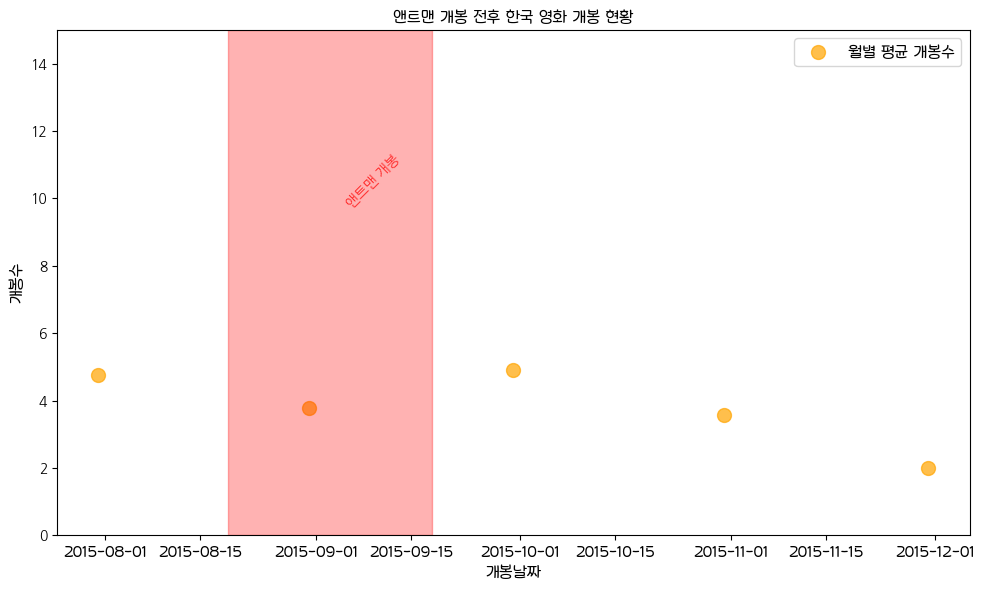

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


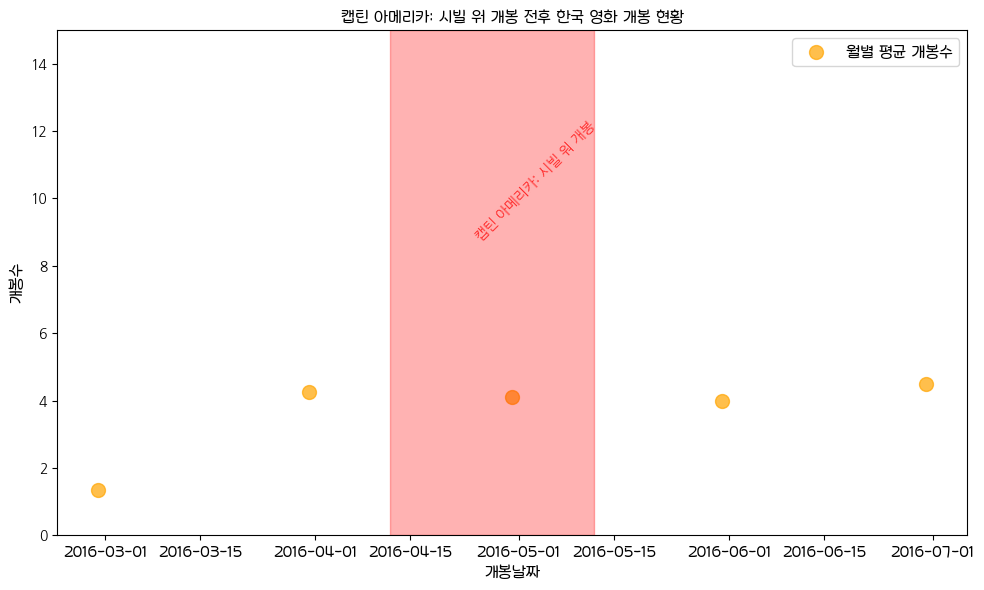

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


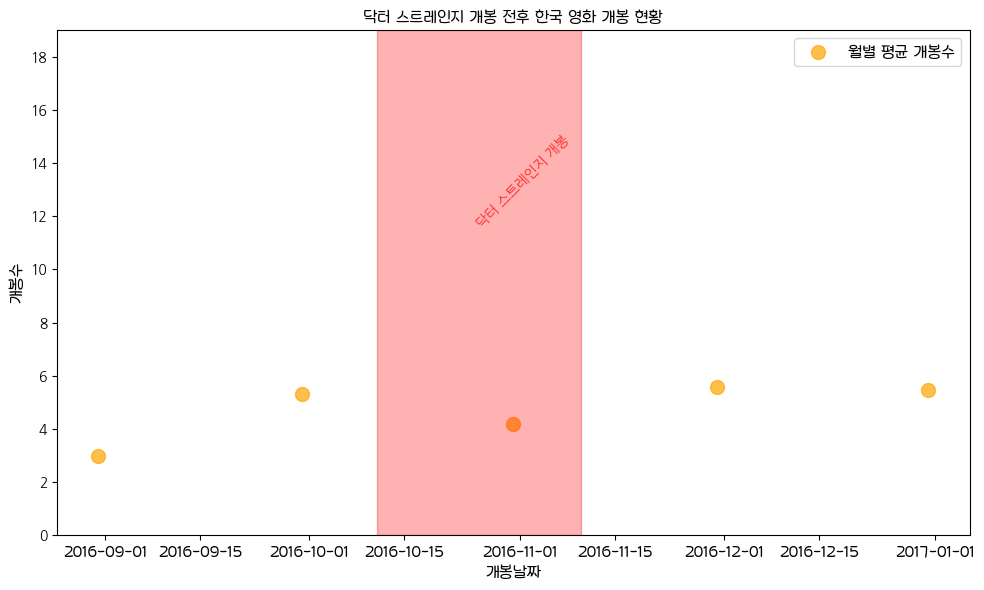

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


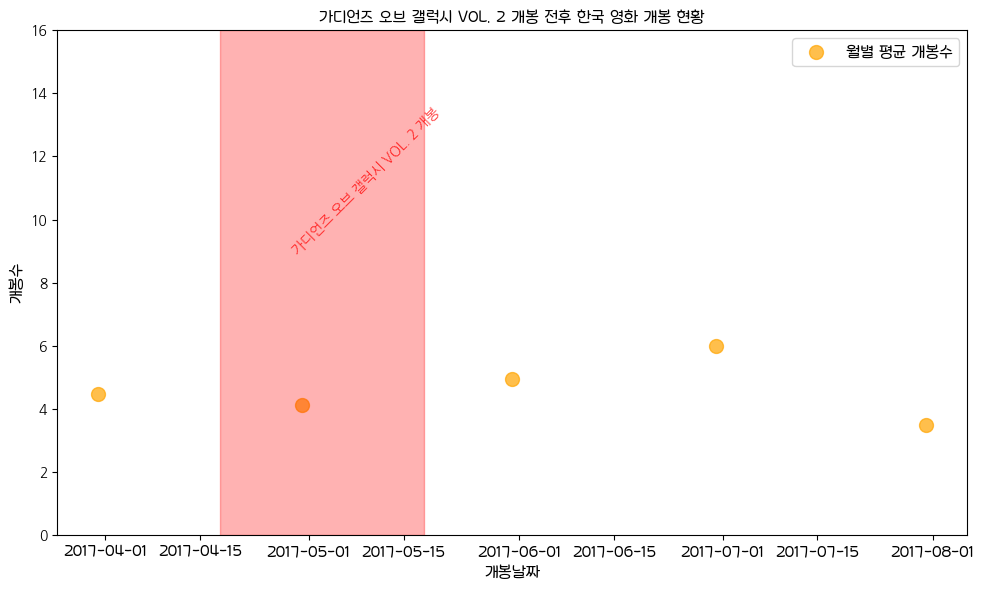

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


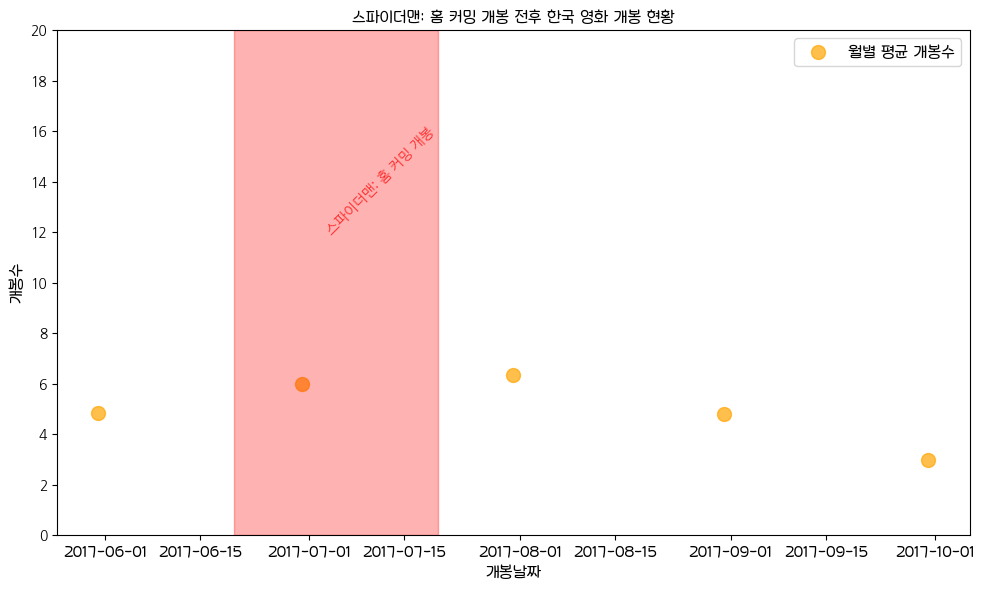

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


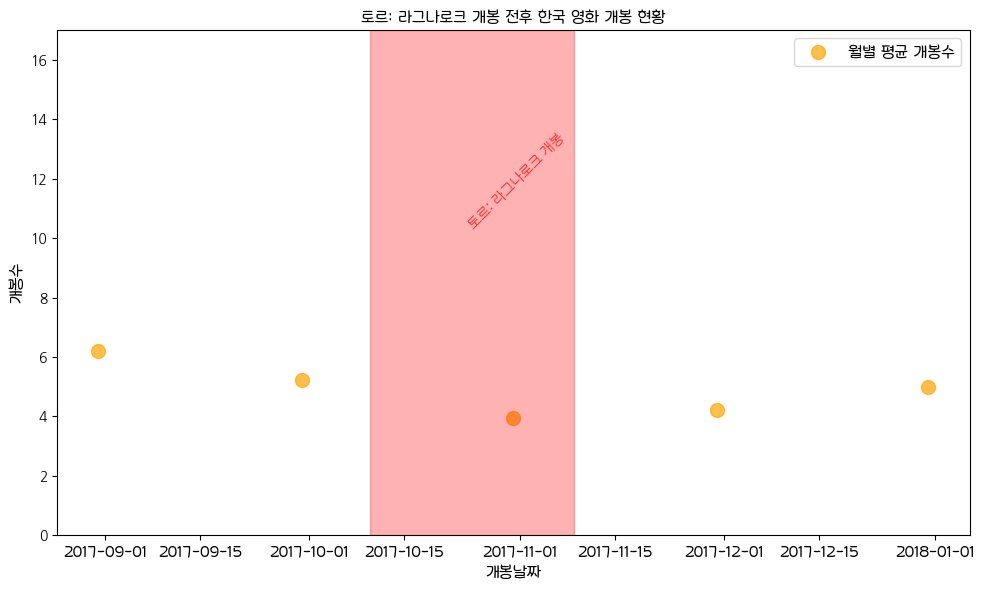

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


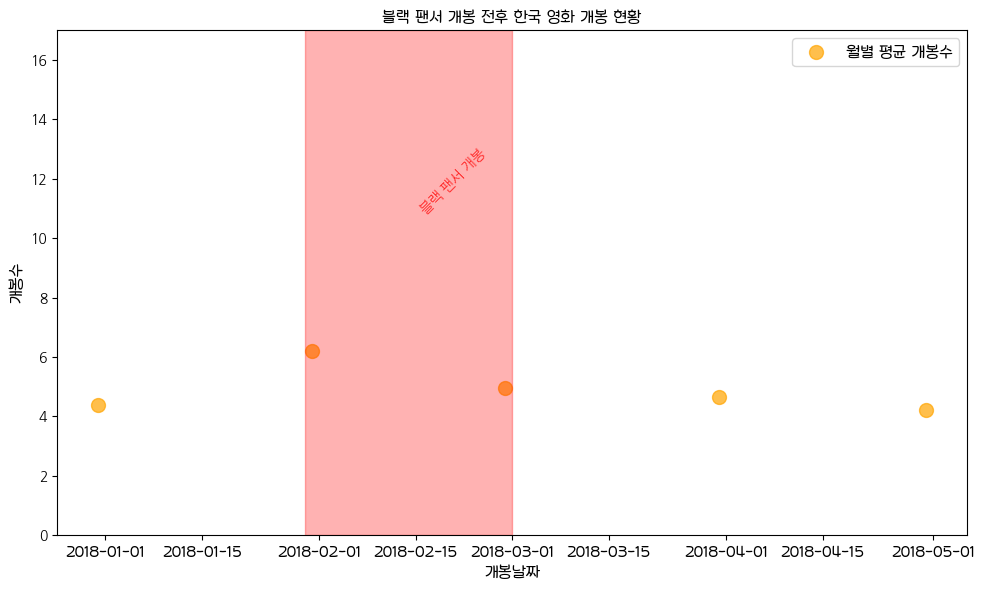

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


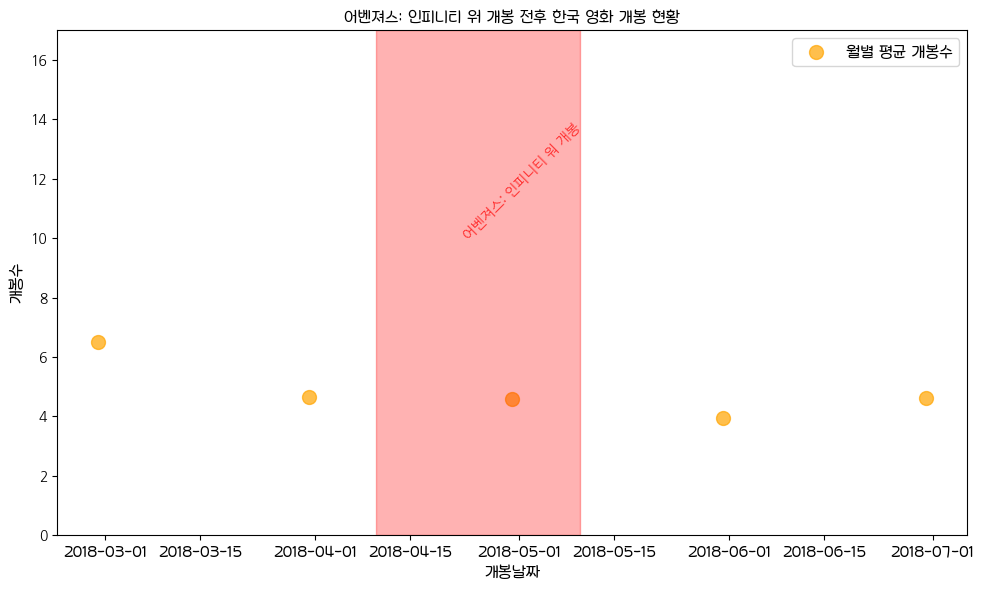

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


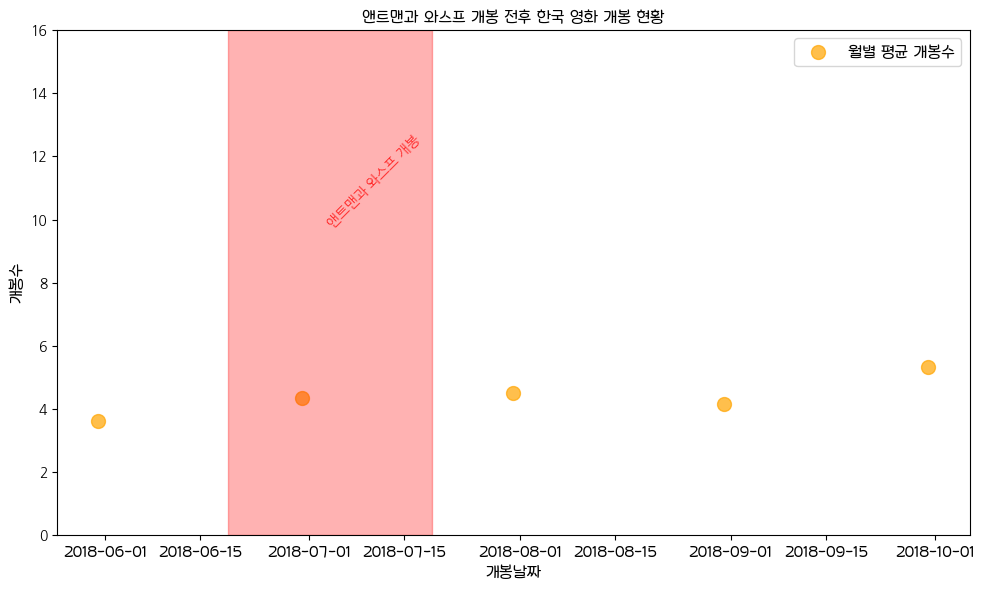

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


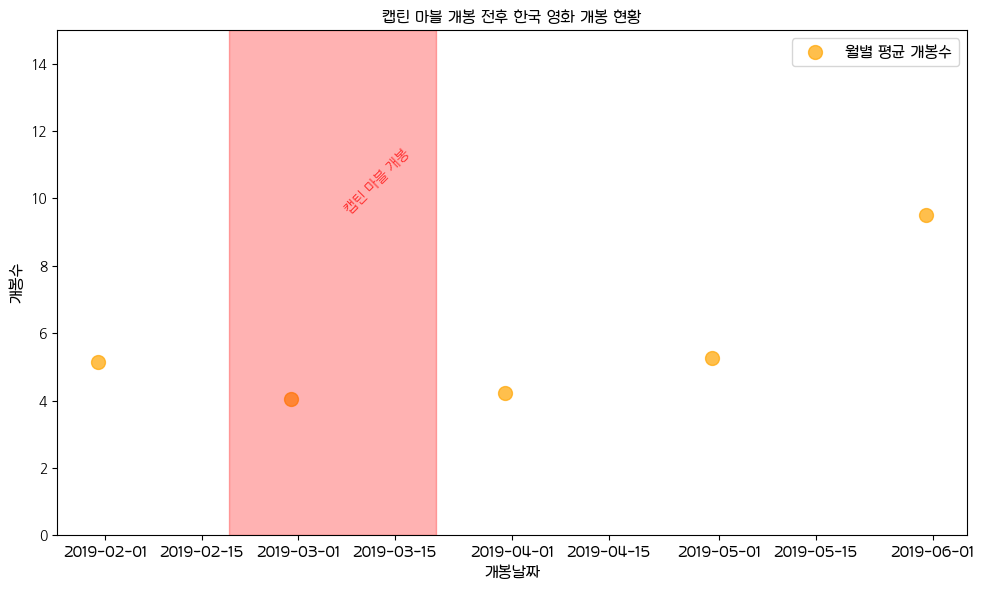

/tmp/ipykernel_6812/51674221.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


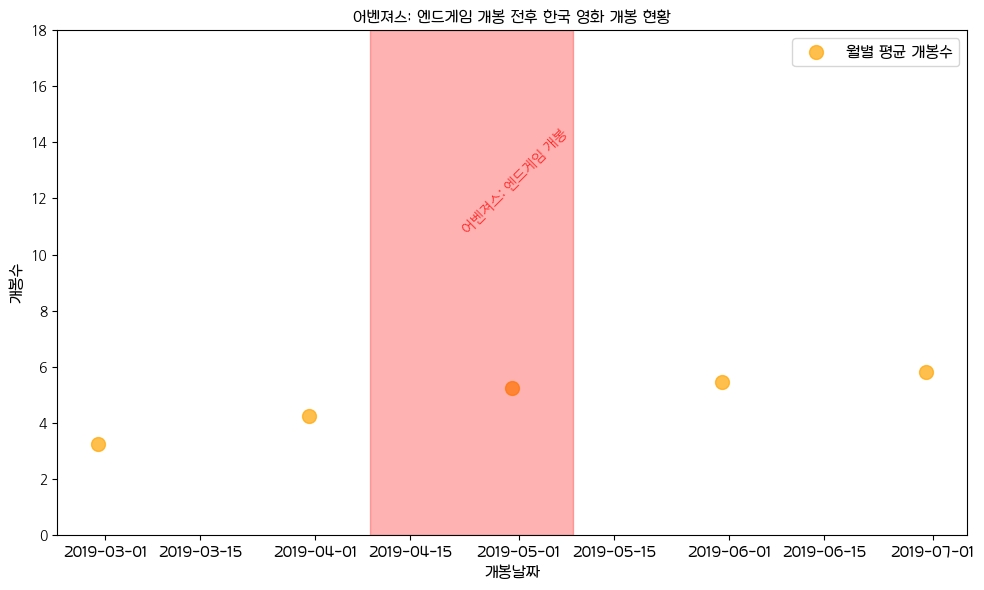

In [77]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 월별 평균 계산 (날짜를 월별로 묶고 합한 후 평균을 구함)
    monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()

    # 4. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
    fontprop = fm.FontProperties(fname=font_path, size=12)

    # 5. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 6. 월별 평균 개봉 수를 점으로 그리기
    plt.scatter(monthly_avg['date'], 
                monthly_avg['title_count'], 
                color='orange', 
                label='월별 평균 개봉수', 
                s=100, alpha=0.7)

    # 7. 빨간색 직선 추가 (마블 영화 개봉일 기준 3일 전후로 영역을 채우기)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기
    
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후

    # 8. 영역 채우기 (투명한 연한 빨간색으로)
    plt.ylim(0, max(date_count_kmovies['title_count']))  # y축 범위를 수동으로 설정

    plt.fill_betweenx([0, max(date_count_kmovies['title_count'])],  # y축의 최소값과 최대값을 가져옴
                    highlight_start, 
                    highlight_end, 
                    color='red', 
                    alpha=0.3)  # 투명도 적용

    # 9. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max(date_count_kmovies['title_count']) * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=45, 
             ha='center', 
             va='center', 
             alpha=0.8)
    
    # 10. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=fontprop, 
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.xticks(rotation=0, fontproperties=fontprop)

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 11. 그래프 레이아웃 설정
    plt.tight_layout()

    # 12. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 13. 그래프 출력
    plt.show()


/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


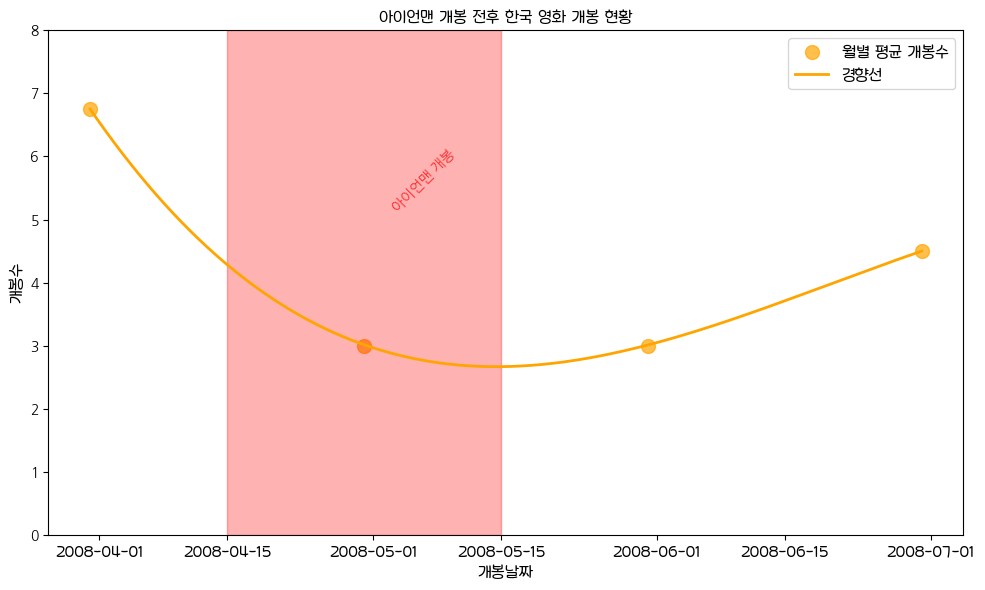

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


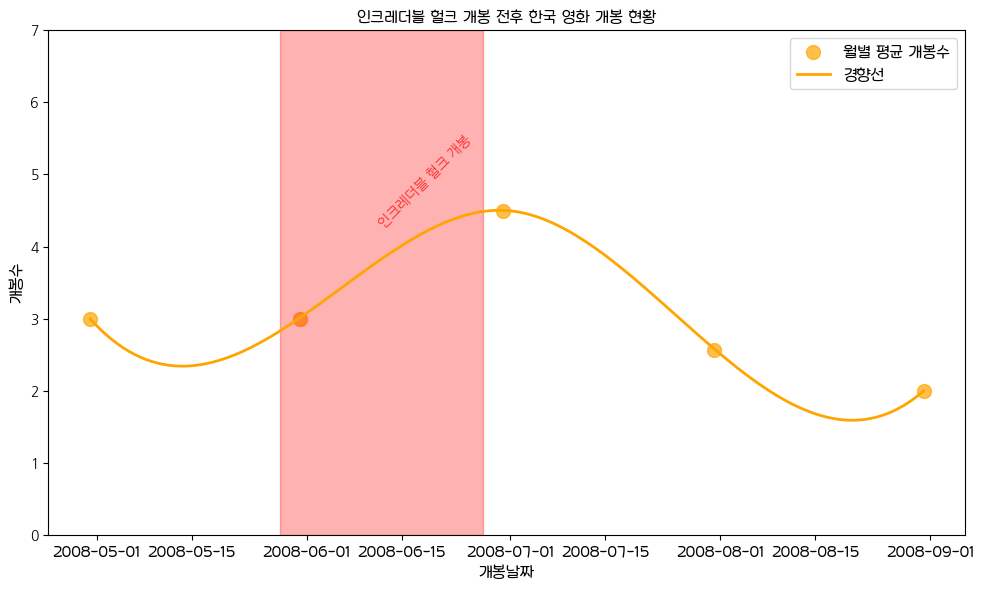

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


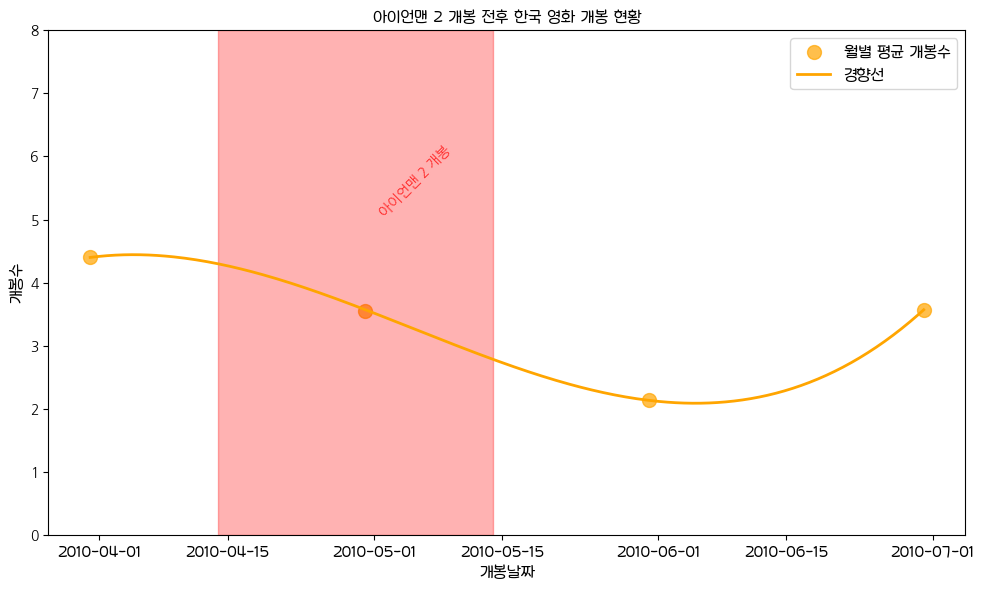

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


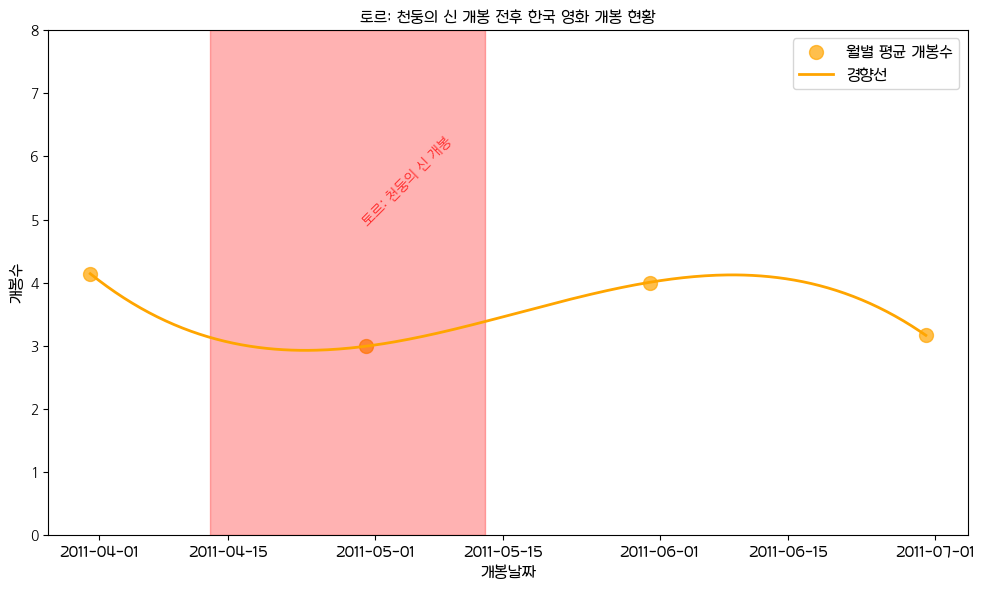

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


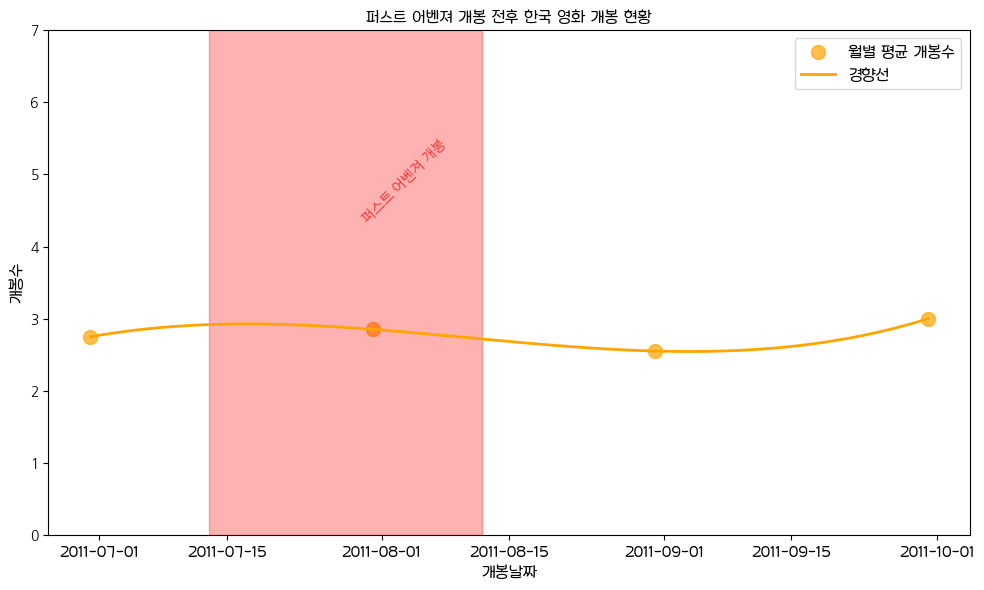

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


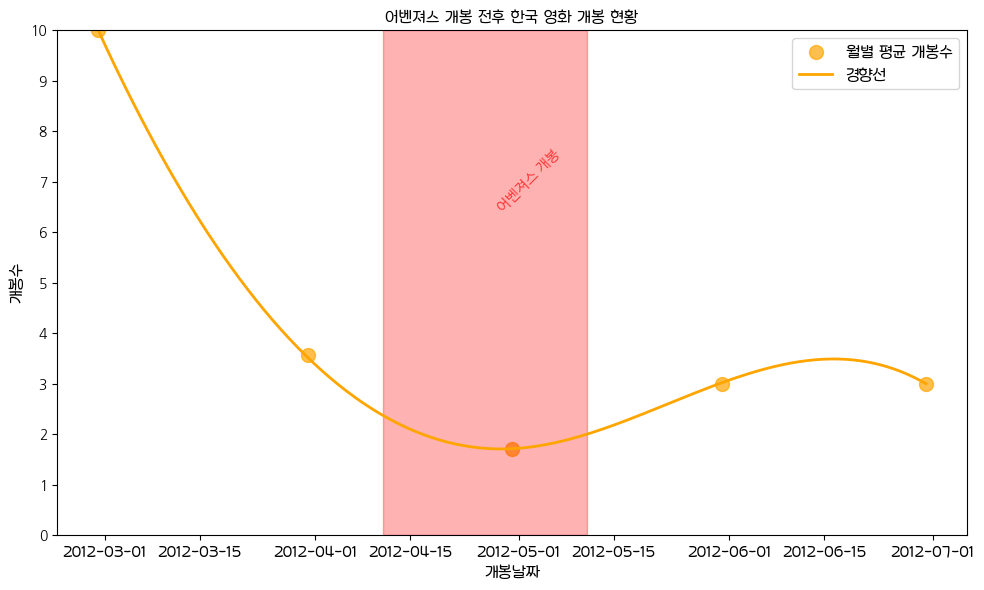

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


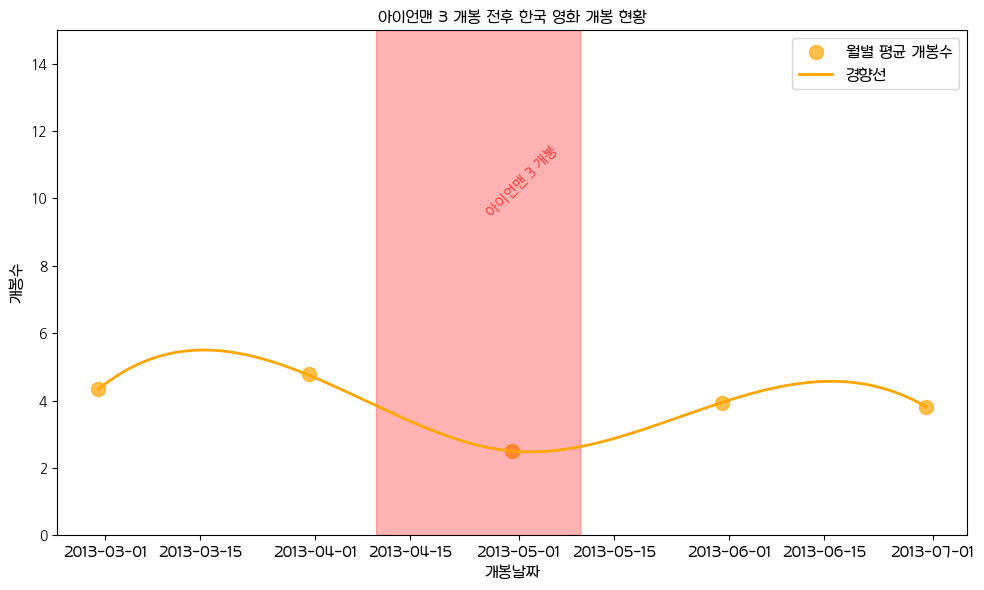

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


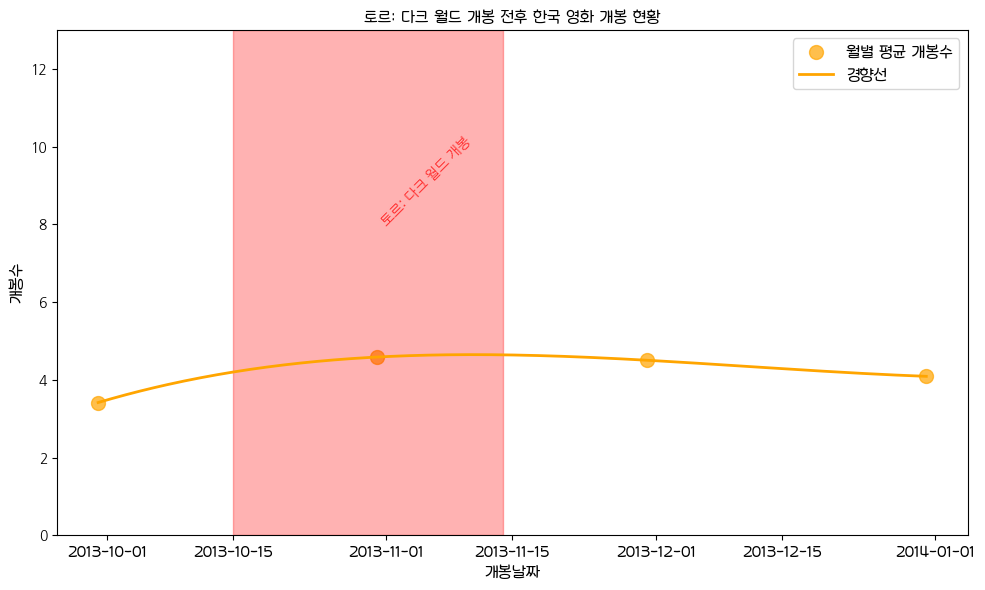

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


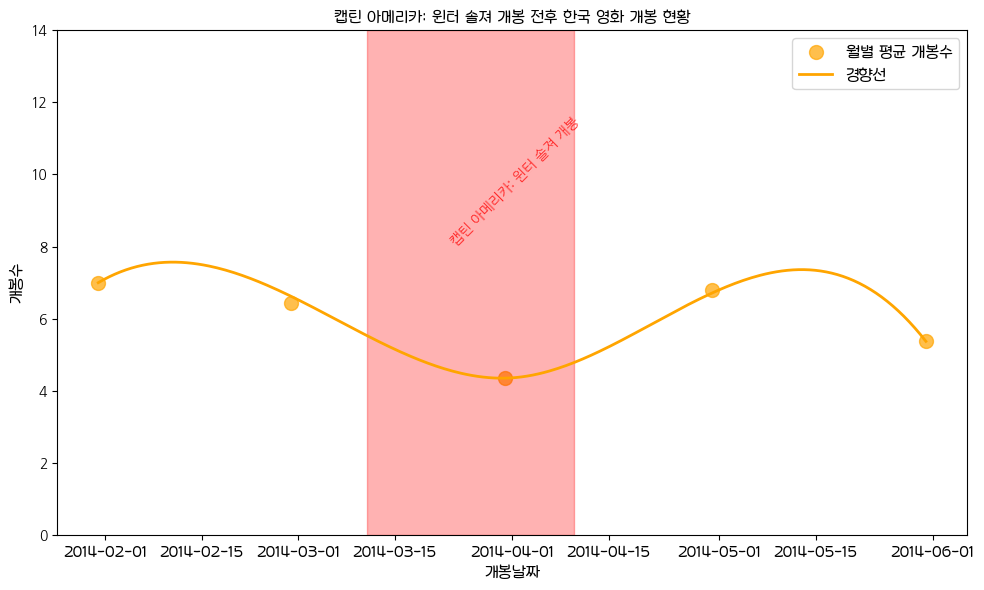

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


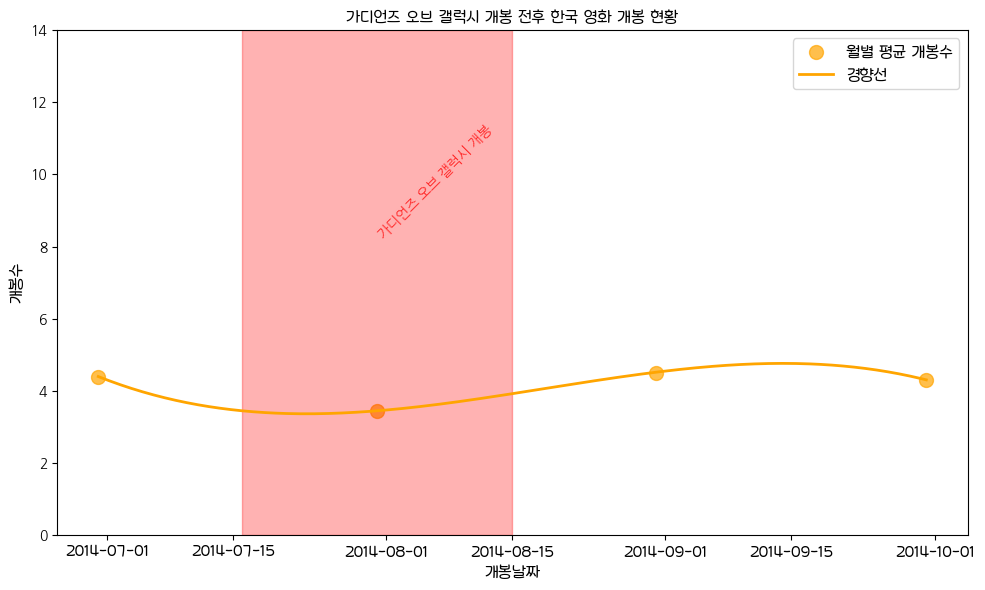

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


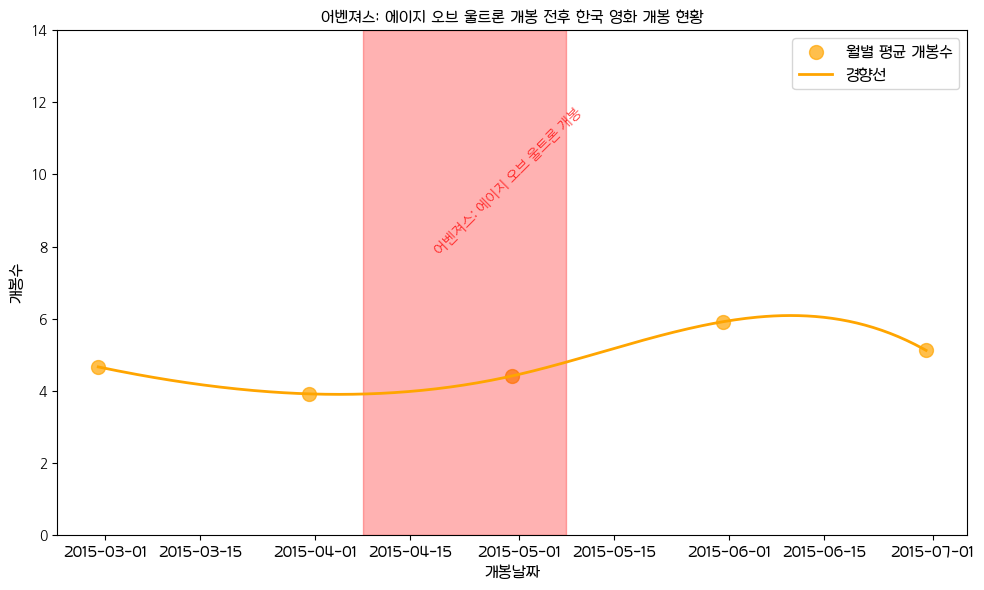

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


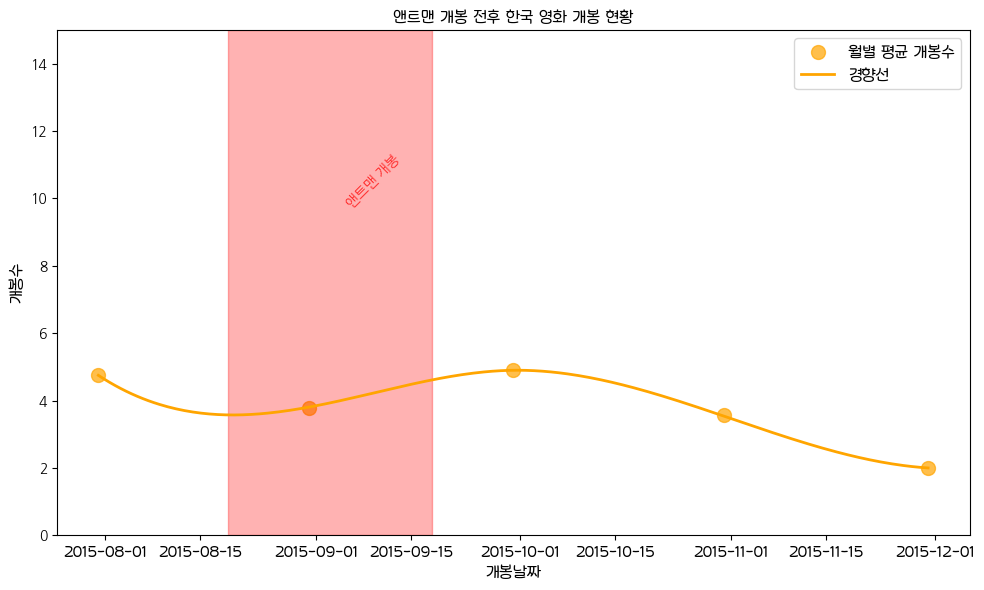

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


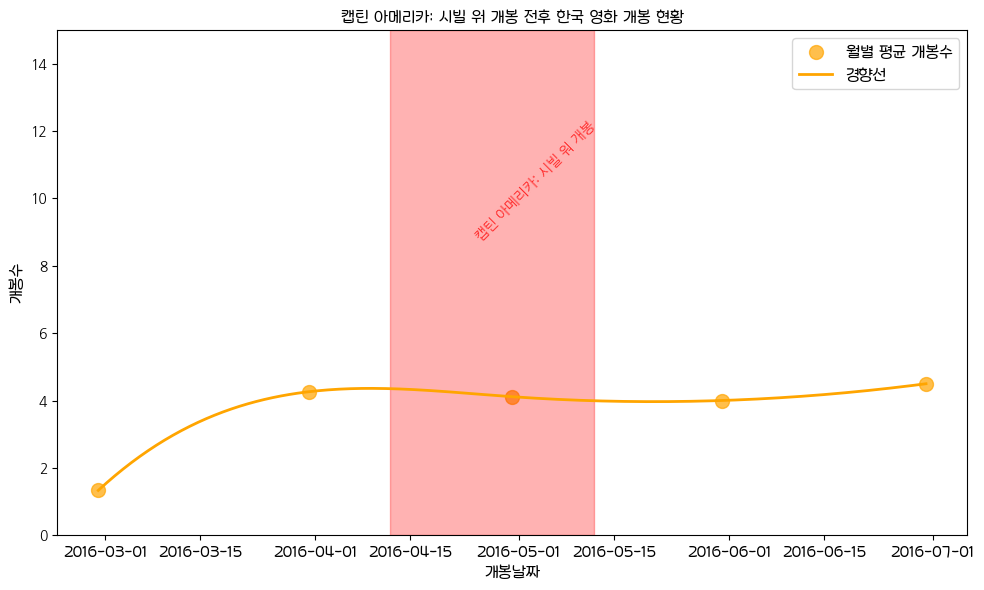

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


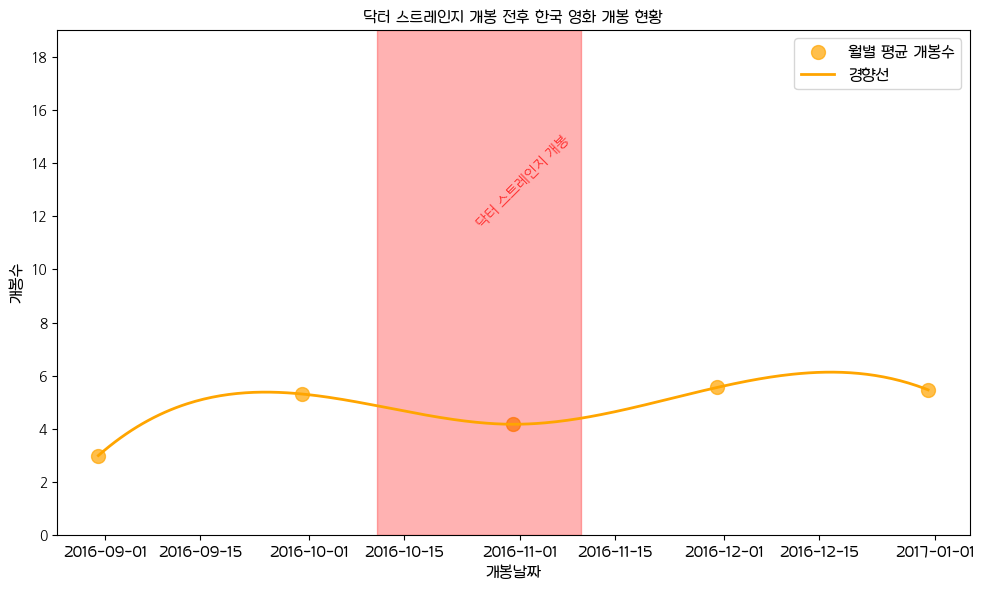

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


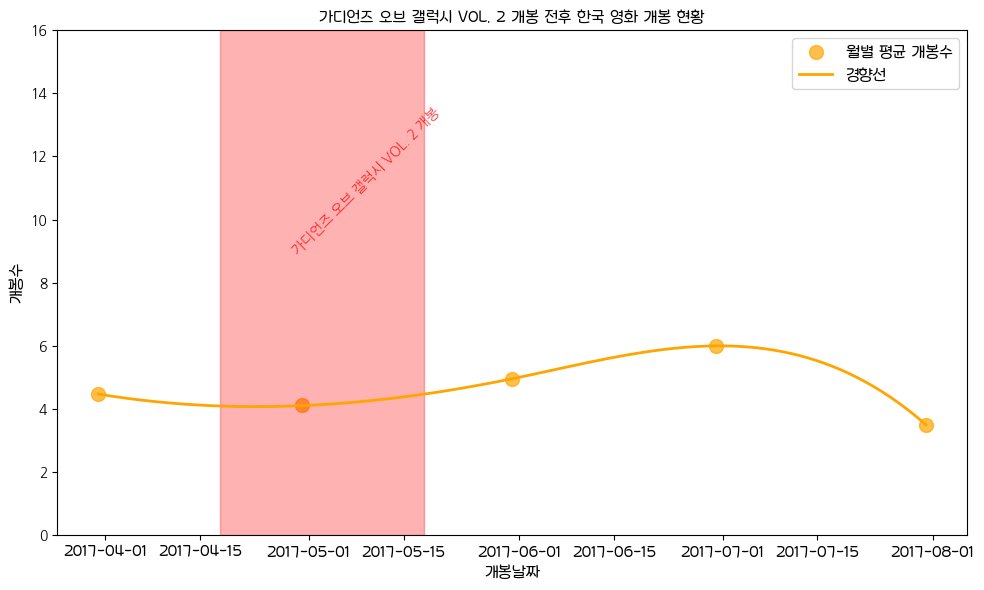

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


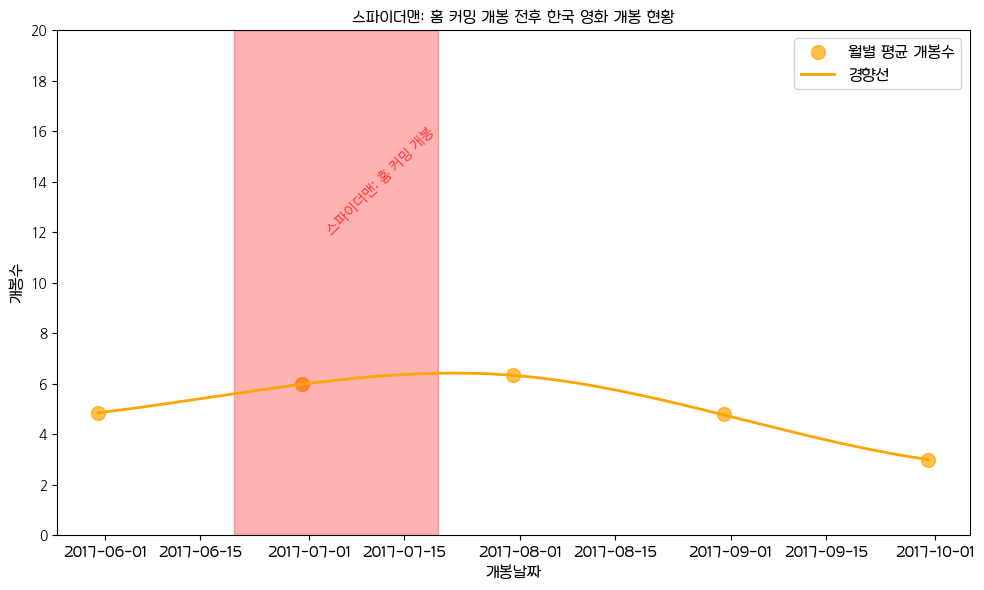

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


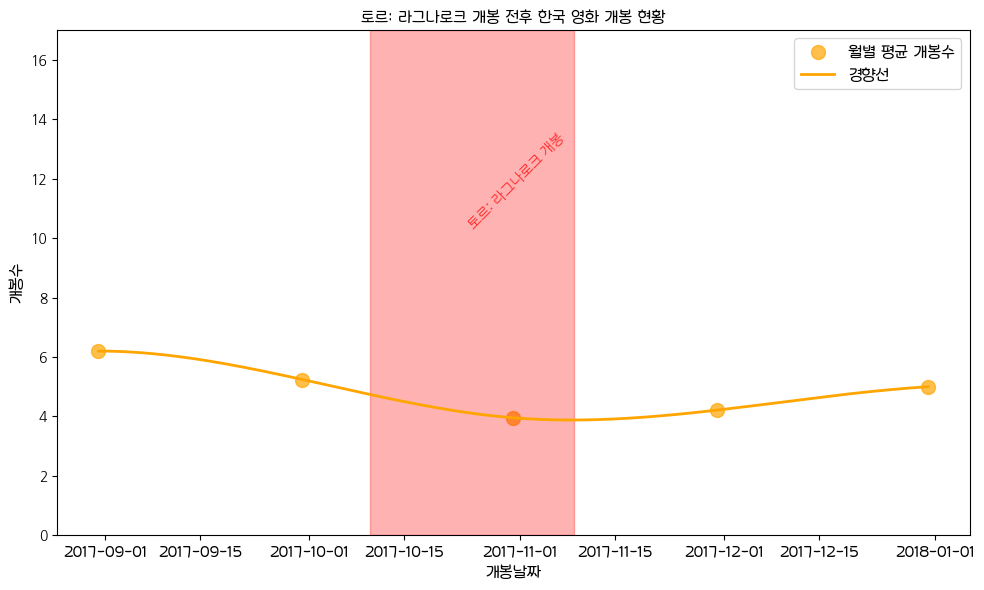

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


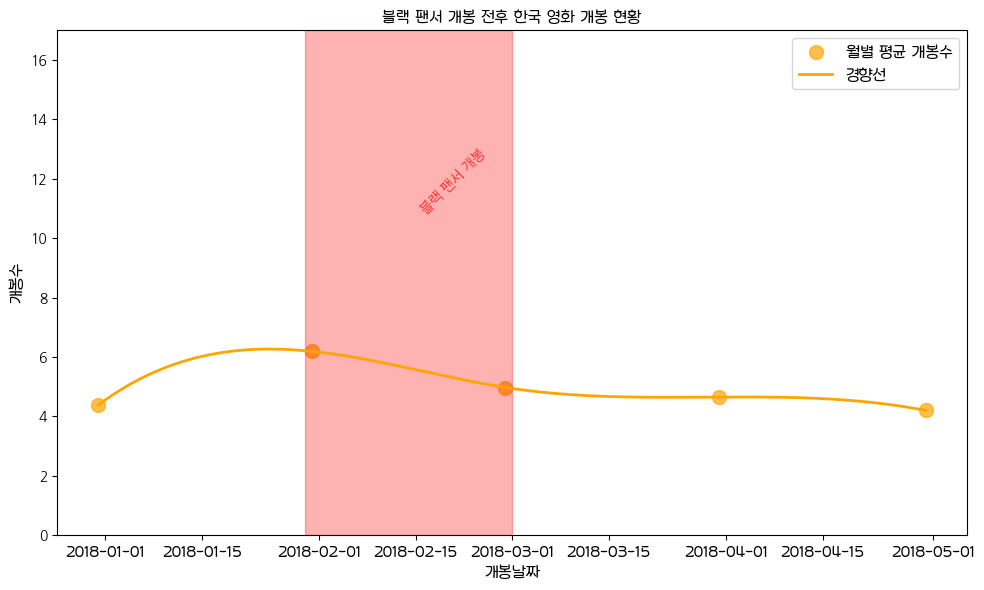

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


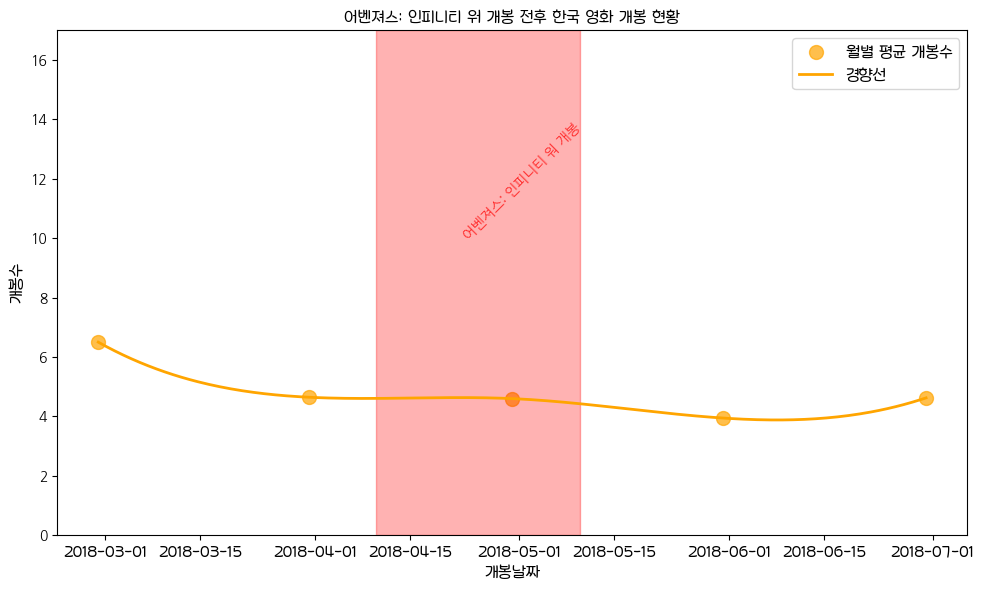

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


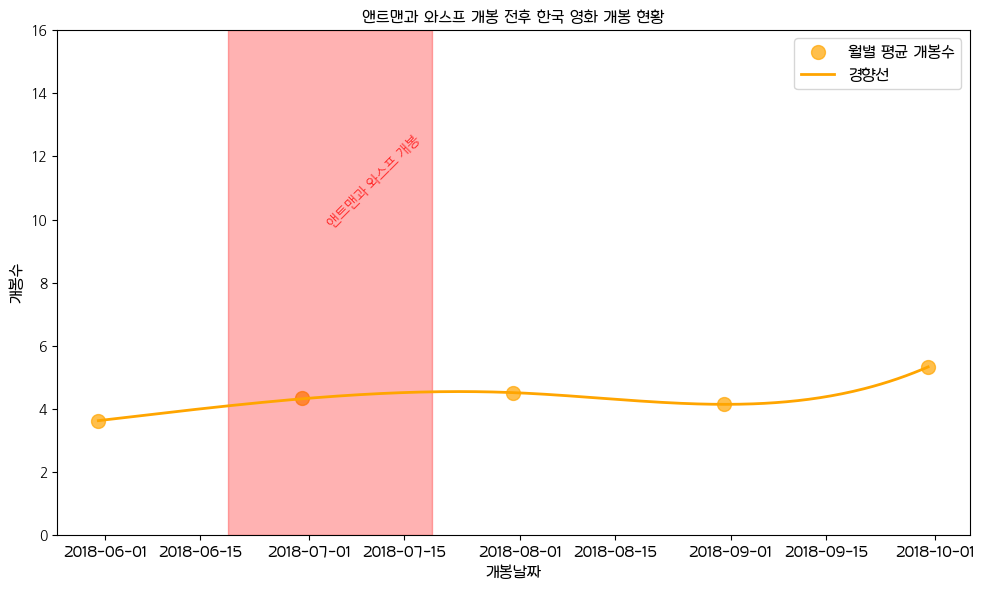

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


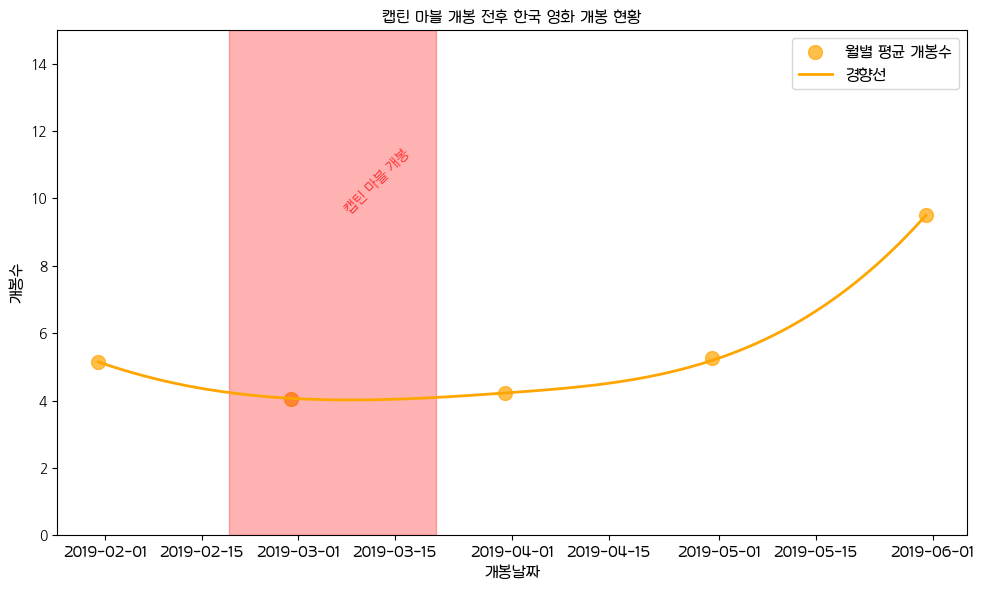

/tmp/ipykernel_6767/3025366152.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()


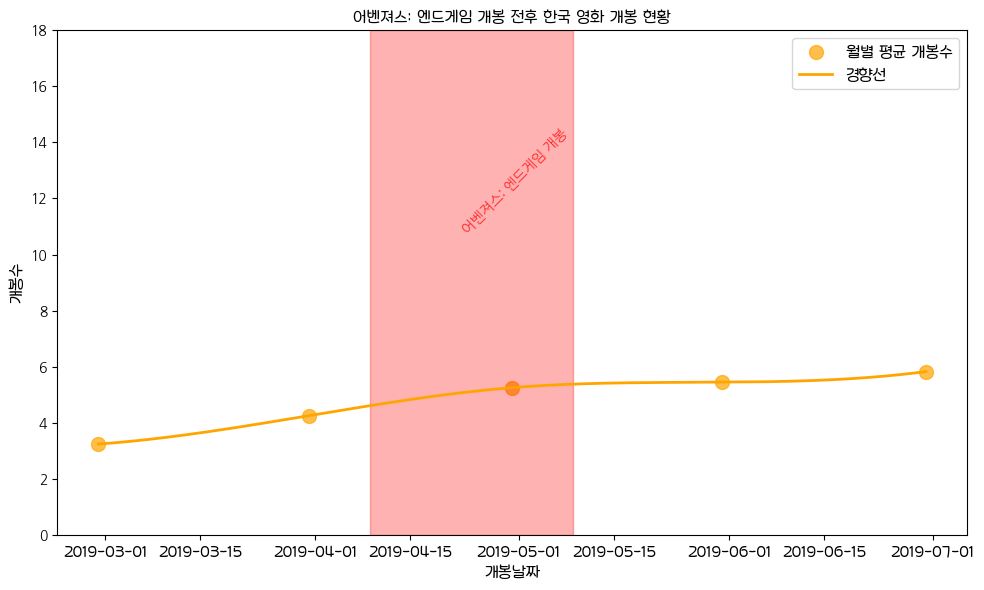

In [19]:

# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 월별 평균 계산 (날짜를 월별로 묶고 합한 후 평균을 구함)
    monthly_avg = date_count_kmovies.resample('M', on='date').mean().reset_index()

    # 4. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_path = '/home/lento/Downloads/Hakgyoansim Dunggeunmiso TTF R.ttf'
    fontprop = fm.FontProperties(fname=font_path, size=12)

    # 5. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 6. 월별 평균 개봉 수를 점으로 그리기
    plt.scatter(monthly_avg['date'], 
                monthly_avg['title_count'], 
                color='orange', 
                label='월별 평균 개봉수', 
                s=100, alpha=0.7)

    # 7. 점들을 곡선으로 부드럽게 이어주기
    # x축 (date를 숫자로 변환)
    x = np.arange(len(monthly_avg['date']))
    y = monthly_avg['title_count']

    # 곡선으로 부드럽게 이어주는 부분
    spline = make_interp_spline(x, y)
    x_smooth = np.linspace(x.min(), x.max(), 300)  # 300개의 점으로 곡선을 부드럽게 만들기
    y_smooth = spline(x_smooth)

    # 부드러운 곡선 그리기 (x_smooth를 원래 date 값으로 매핑)
    dates_smooth = np.linspace(monthly_avg['date'].min().value, monthly_avg['date'].max().value, 300)
    dates_smooth = pd.to_datetime(dates_smooth)  # 숫자로 된 timestamp를 다시 datetime으로 변환
    plt.plot(dates_smooth, y_smooth, color='orange', label='경향선', linewidth=2)

    # 8. 빨간색 직선 추가 (마블 영화 개봉일 기준 3일 전후로 영역을 채우기)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기
    
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후

    # 9. 영역 채우기 (투명한 연한 빨간색으로)
    plt.ylim(0, max(date_count_kmovies['title_count']))  # y축 범위를 수동으로 설정

    plt.fill_betweenx([0, max(date_count_kmovies['title_count'])],  # y축의 최소값과 최대값을 가져옴
                    highlight_start, 
                    highlight_end, 
                    color='red', 
                    alpha=0.3)  # 투명도 적용

    # 10. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max(date_count_kmovies['title_count']) * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=45, 
             ha='center', 
             va='center', 
             alpha=0.8)
    
    # 11. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=fontprop, 
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.xticks(rotation=0, fontproperties=fontprop)

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 12. 그래프 레이아웃 설정
    plt.tight_layout()

    # 13. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 14. 그래프 출력
    plt.show()


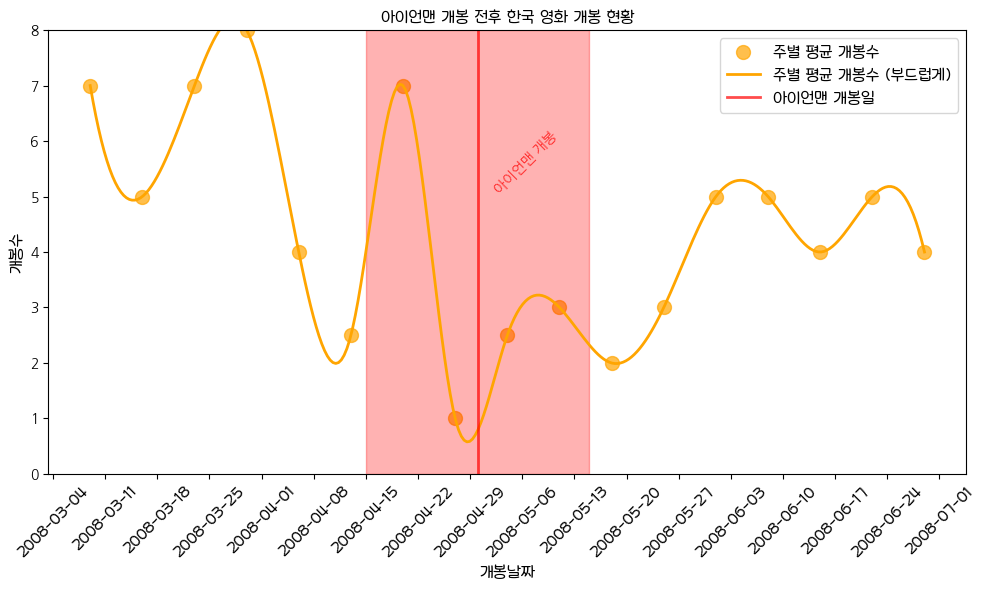

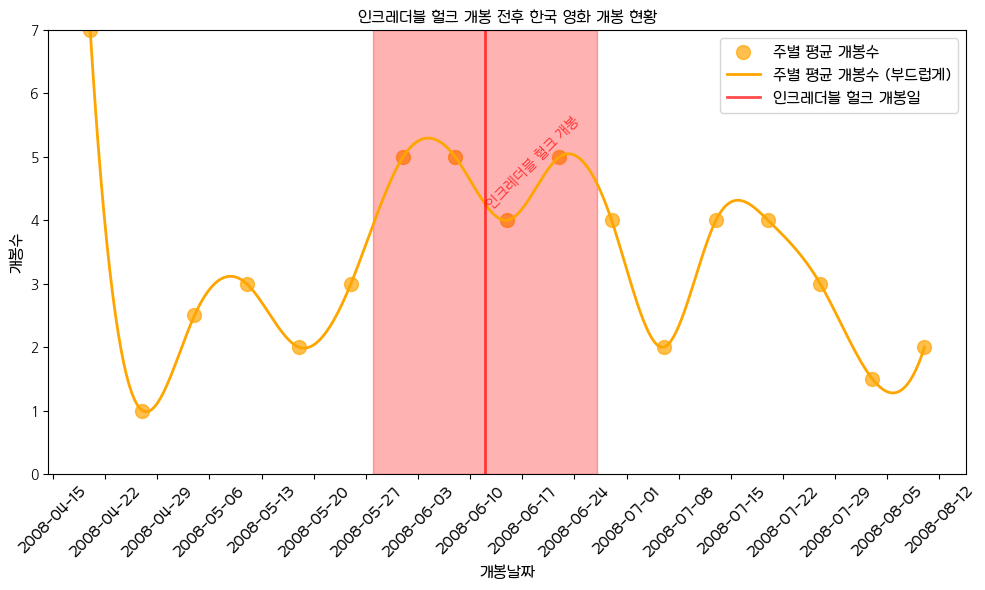

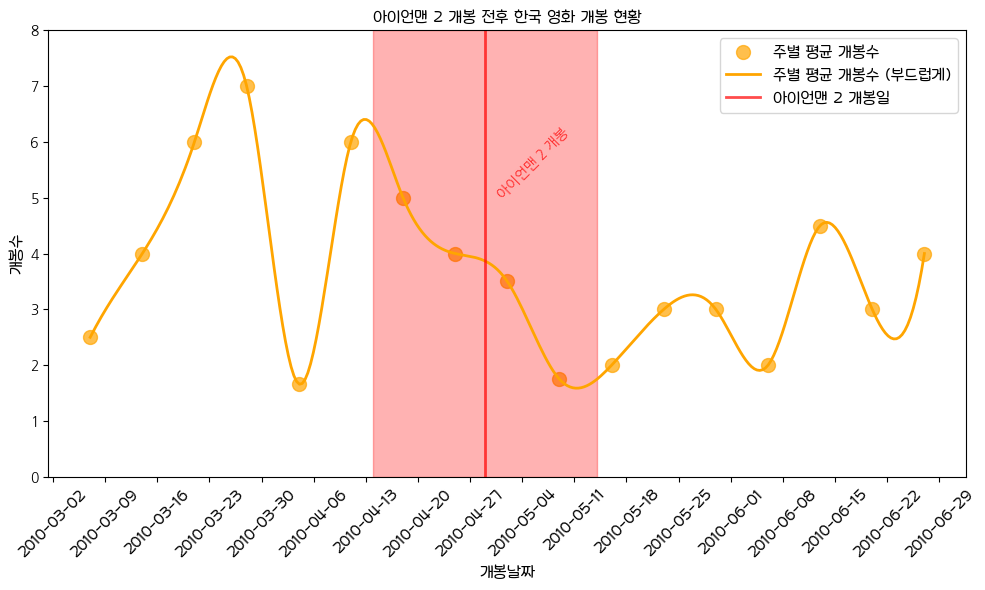

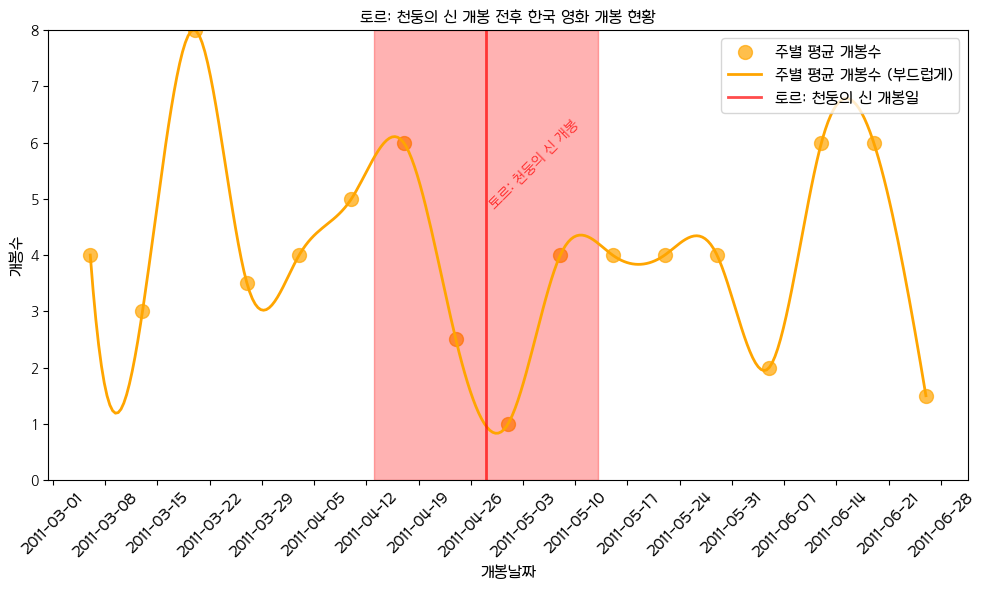

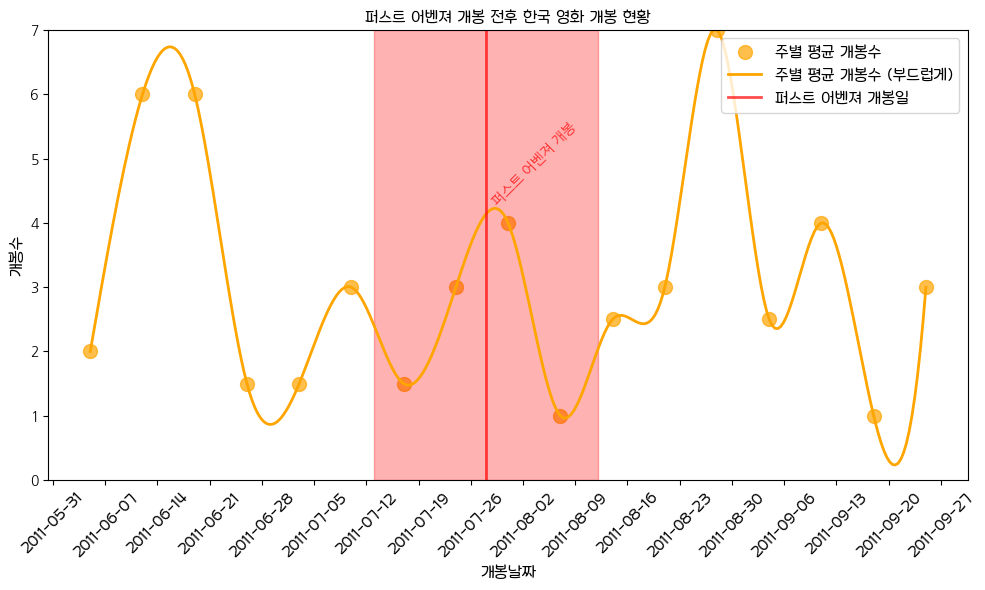

...

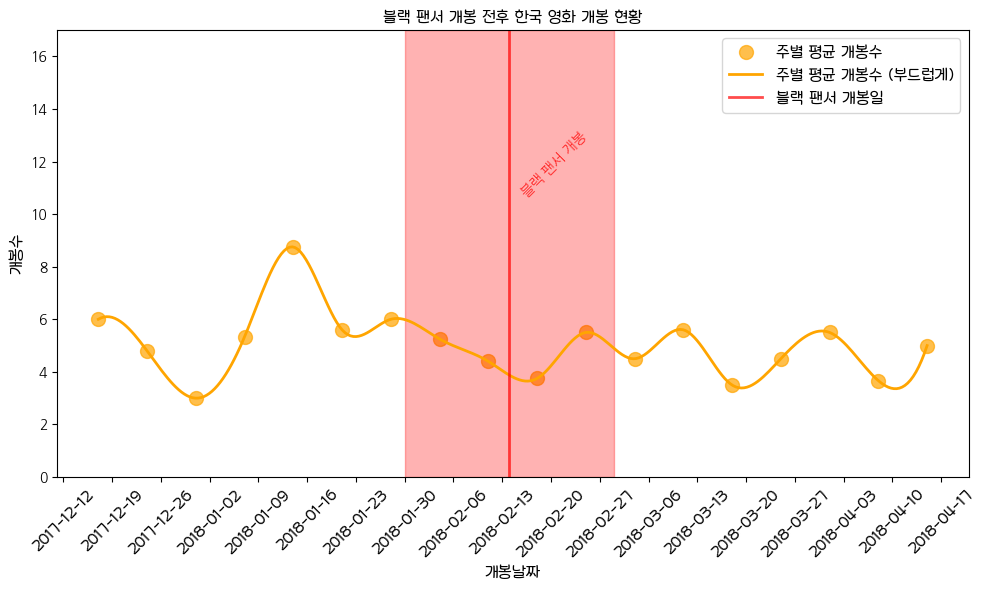

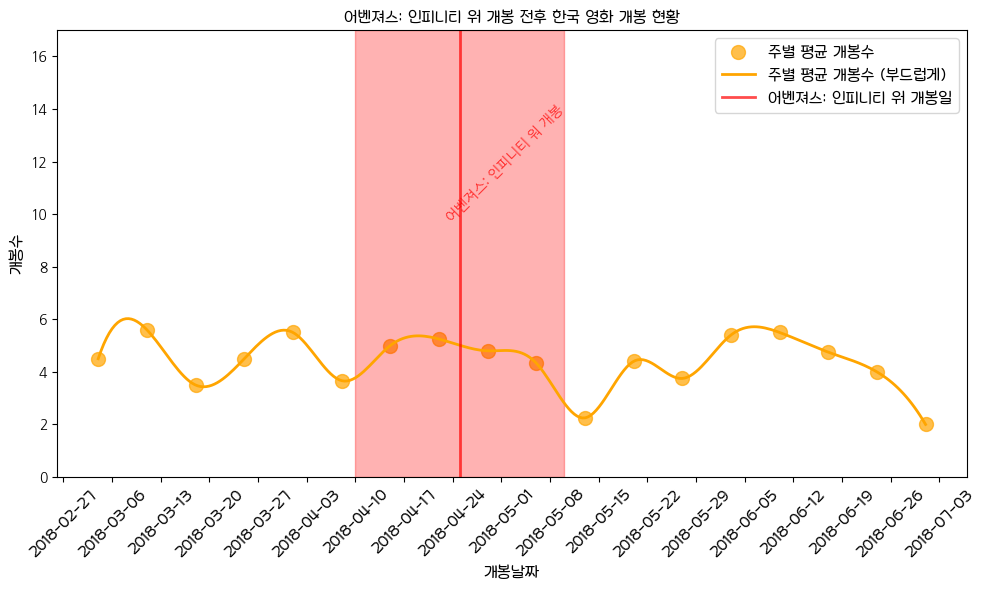

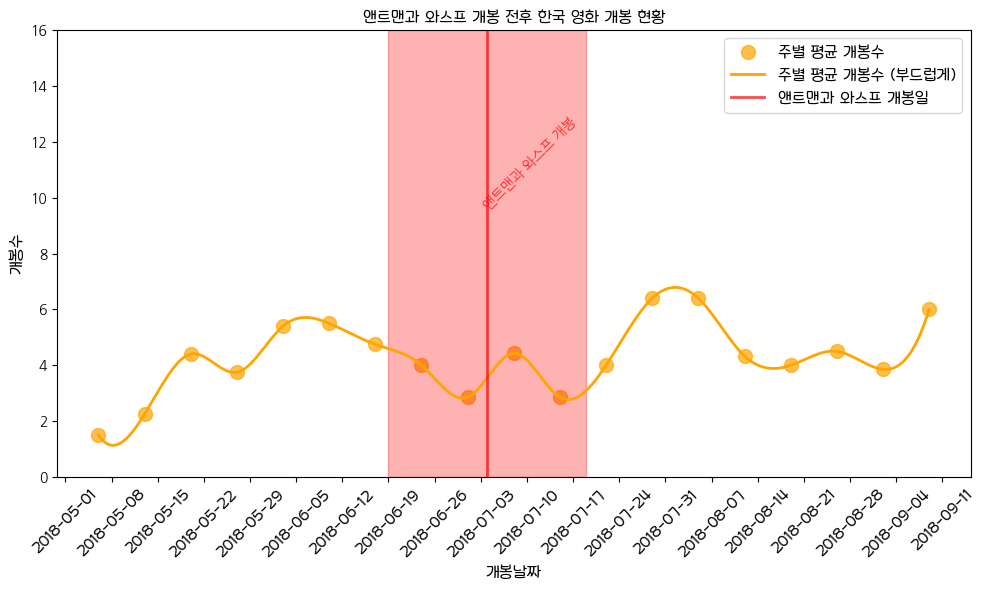

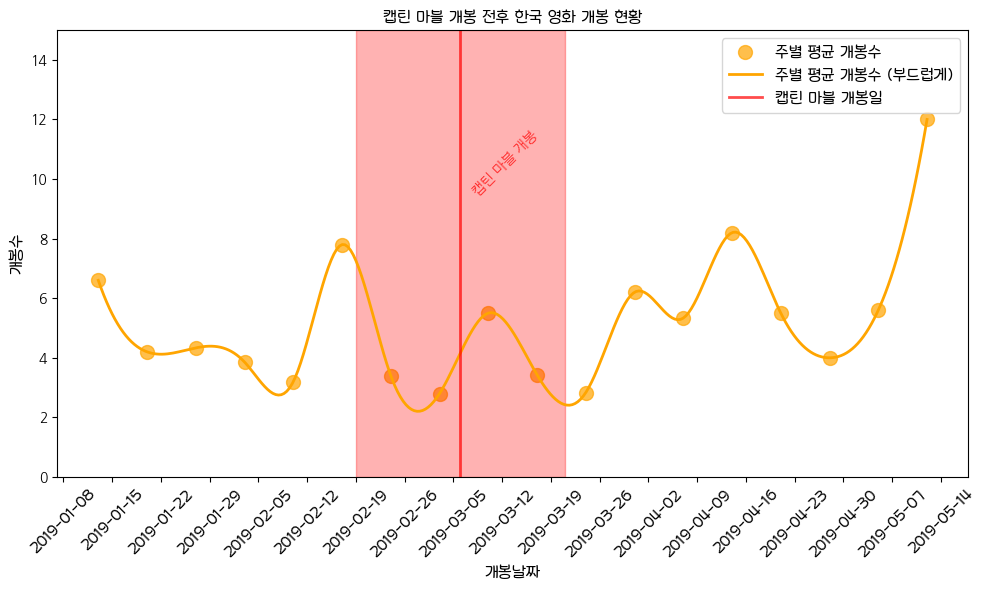

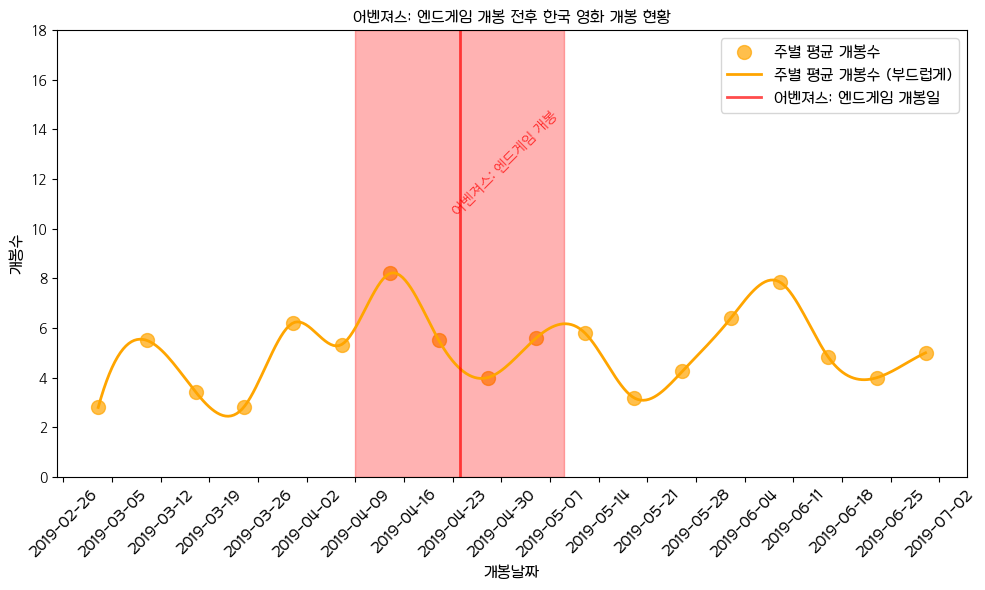

In [110]:

# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 4. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
    fontprop = fm.FontProperties(fname=font_path, size=12)

    # 5. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 6. 주별 평균 개봉 수를 점으로 그리기
    plt.scatter(weekly_avg['date'], 
                weekly_avg['title_count'], 
                color='orange', 
                label='주별 평균 개봉수', 
                s=100, alpha=0.7)

    # 7. 점들을 곡선으로 부드럽게 이어주기
    # x축 (date를 숫자로 변환)
    x = np.arange(len(weekly_avg['date']))
    y = weekly_avg['title_count']

    # 곡선으로 부드럽게 이어주는 부분
    spline = make_interp_spline(x, y)
    x_smooth = np.linspace(x.min(), x.max(), 300)  # 300개의 점으로 곡선을 부드럽게 만들기
    y_smooth = spline(x_smooth)

    # 부드러운 곡선 그리기 (x_smooth를 원래 date 값으로 매핑)
    dates_smooth = np.linspace(weekly_avg['date'].min().value, weekly_avg['date'].max().value, 300)
    dates_smooth = pd.to_datetime(dates_smooth)  # 숫자로 된 timestamp를 다시 datetime으로 변환
    plt.plot(dates_smooth, y_smooth, color='orange', label='주별 평균 개봉수 (부드럽게)', linewidth=2)

    # 8. 빨간색 직선 추가 (마블 영화 개봉일 기준)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기

    # x축에 마블 영화 개봉일을 직선으로 표시
    plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일')

    # 9. 영역 채우기 (투명한 연한 빨간색으로)
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후
    plt.ylim(0, max(date_count_kmovies['title_count']))  # y축 범위를 수동으로 설정

    plt.fill_betweenx([0, max(date_count_kmovies['title_count'])],  # y축의 최소값과 최대값을 가져옴
                    highlight_start, 
                    highlight_end, 
                    color='red', 
                    alpha=0.3)  # 투명도 적용

    # 10. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max(date_count_kmovies['title_count']) * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=45, 
             ha='center', 
             va='center', 
             alpha=0.8)

    # x축을 주별로 포맷
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator())  # x축을 주 단위로
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # 날짜 형식을 'YYYY-MM-DD'으로

    # 11. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=fontprop, 
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.xticks(rotation=45, fontproperties=fontprop)  # x축의 날짜를 45도 회전

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 12. 그래프 레이아웃 설정
    plt.tight_layout()

    # 13. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 14. 그래프 출력
    plt.show()


In [109]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()
    # 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_r_path = '../data/TTF/NanumSquareNeo-bRg.ttf'
    font_eb_path = '../data/TTF/NanumSquareNeo-cBd.ttf'
    font_r = FontProperties(fname=font_r_path, size=12)  # 나머지 텍스트용
    font_eb = FontProperties(fname=font_eb_path, size=20)  # 제목용

    # 5. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 6. 주별 평균 개봉 수를 점으로 그리기 (zorder 설정)
    plt.scatter(weekly_avg['date'], 
                weekly_avg['title_count'], 
                color='orange', 
                label='주별 평균 개봉수', 
                s=100, alpha=0.7, zorder=3)  # zorder를 3으로 설정

    # 7. 점들을 곡선으로 부드럽게 이어주기
    # x축 (date를 숫자로 변환)
    x = np.arange(len(weekly_avg['date']))
    y = weekly_avg['title_count']

    # 곡선으로 부드럽게 이어주는 부분
    spline = make_interp_spline(x, y)
    x_smooth = np.linspace(x.min(), x.max(), 300)  # 300개의 점으로 곡선을 부드럽게 만들기
    y_smooth = spline(x_smooth)

    # y축의 범위를 수동으로 설정 (최대값을 약간 더 크게 설정)
    y_max = max(date_count_kmovies['title_count']) + 1  # 최대값보다 1 크게 설정
    plt.ylim(0, y_max)  # y축 범위를 0부터 y_max까지 설정
    
    # 부드러운 곡선 그리기 (x_smooth를 원래 date 값으로 매핑)
    dates_smooth = np.linspace(weekly_avg['date'].min().value, weekly_avg['date'].max().value, 300)
    dates_smooth = pd.to_datetime(dates_smooth)  # 숫자로 된 timestamp를 다시 datetime으로 변환
    plt.plot(dates_smooth, y_smooth, color='orange', label='주별 평균 개봉수 (부드럽게)', linewidth=2, zorder=2)  # zorder를 2로 설정

    # 8. 빨간색 직선 추가 (마블 영화 개봉일 기준)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기

    # x축에 마블 영화 개봉일을 직선으로 표시
    plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일', zorder=1)

    # 9. 영역 채우기 (투명한 연한 빨간색으로)
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후
    plt.ylim(0, max(date_count_kmovies['title_count']))  # y축 범위를 수동으로 설정

    plt.fill_betweenx([0, max(date_count_kmovies['title_count'])],  # y축의 최소값과 최대값을 가져옴
                    highlight_start, 
                    highlight_end, 
                    color='red', 
                    alpha=0.3, zorder=0)  # zorder를 0으로 설정

    # 10. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max(date_count_kmovies['title_count']) * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=45, 
             ha='center', 
             va='center', 
             alpha=0.8, zorder=4)  # zorder를 4로 설정하여 텍스트가 가장 위로

    # x축을 주별로 포맷
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator())  # x축을 주 단위로
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # 날짜 형식을 'YYYY-MM-DD'으로

    # 11. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=fontprop, 
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=fontprop)
    plt.xticks(rotation=45, fontproperties=fontprop)  # x축의 날짜를 45도 회전

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 12. 그래프 레이아웃 설정
#    plt.tight_layout()

    # 13. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 14. 그래프 출력
    plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

<h1>이거얍</h1>

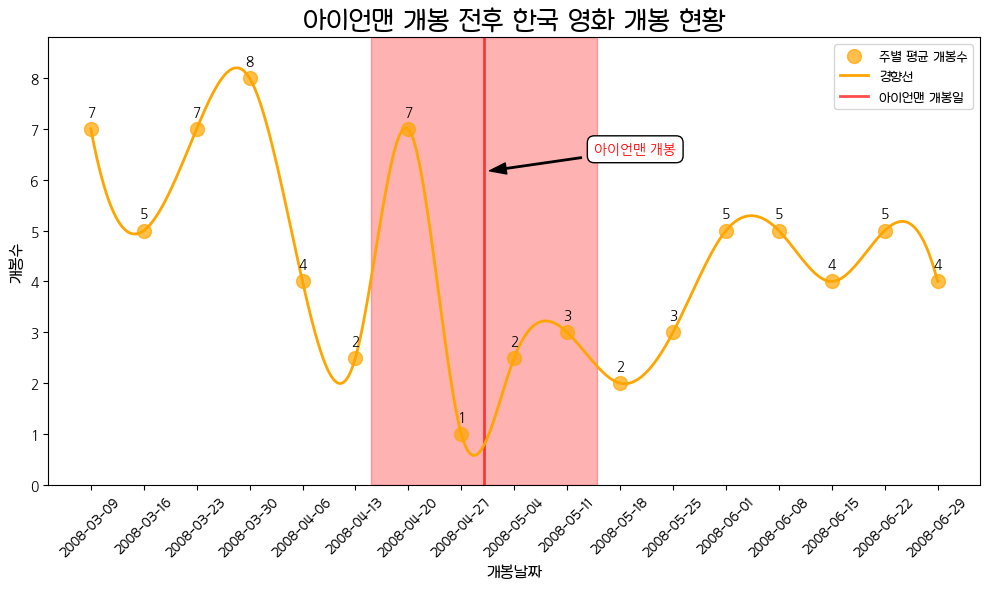

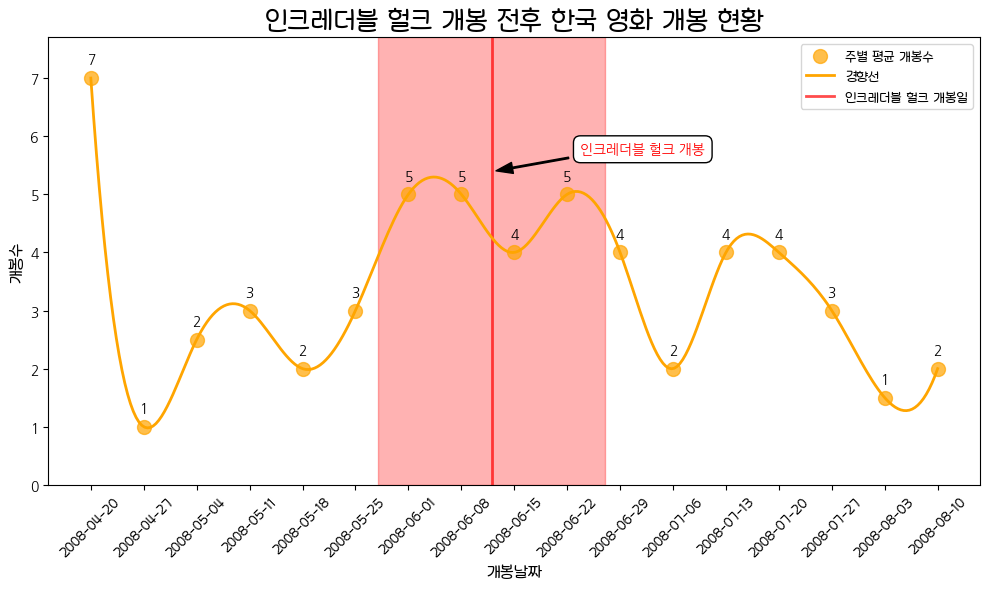

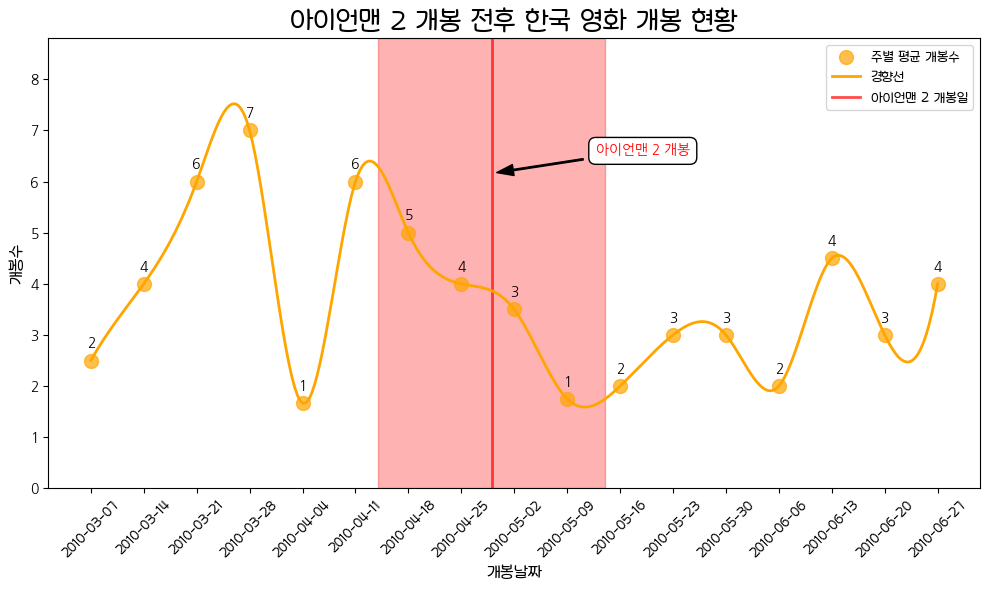

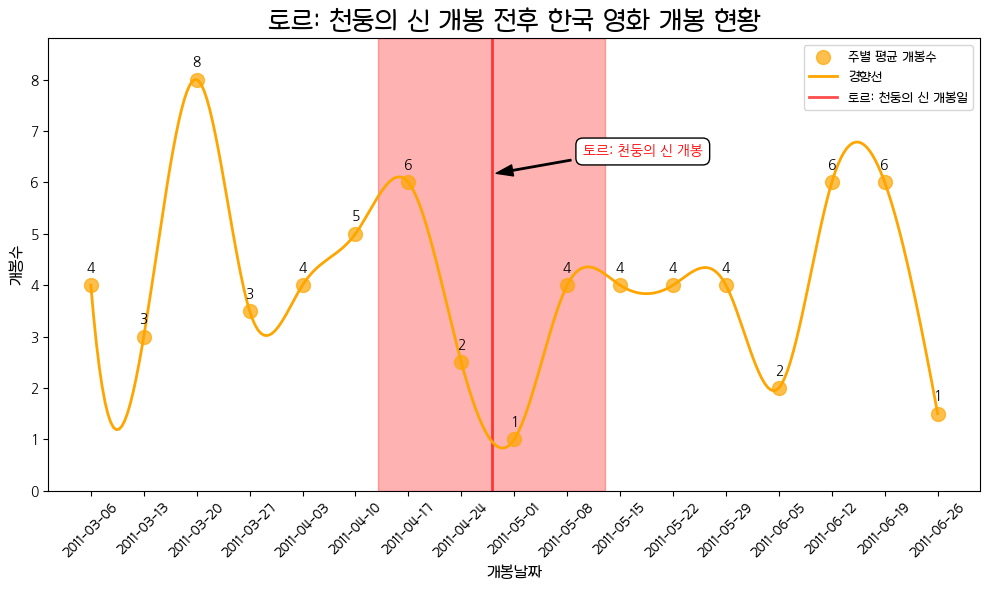

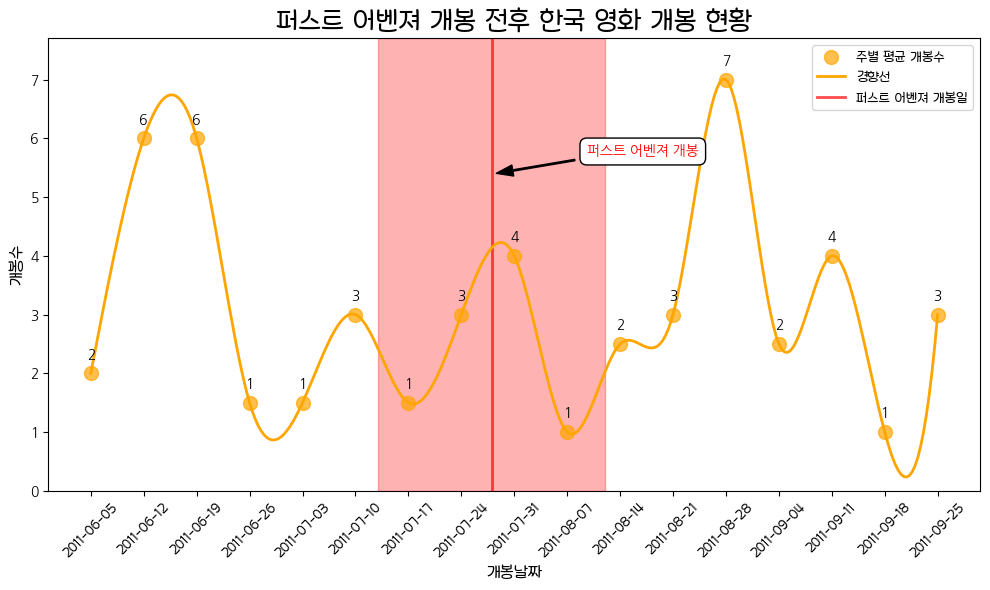

...

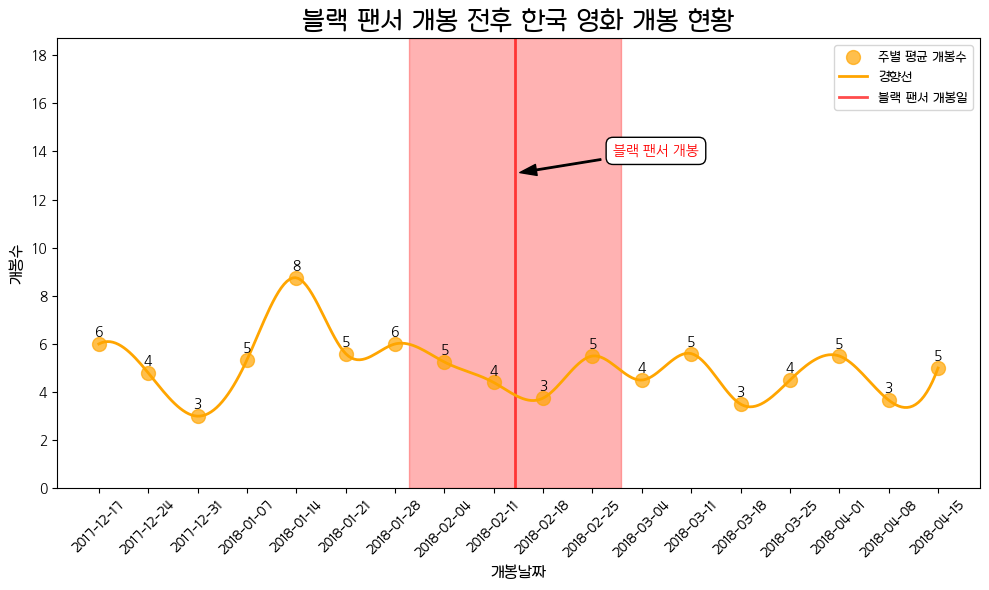

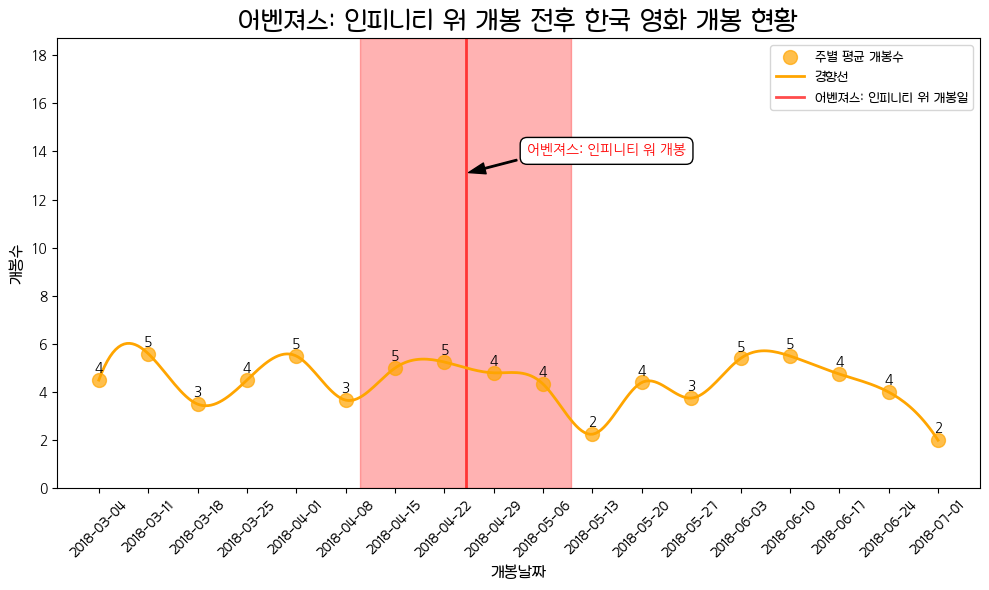

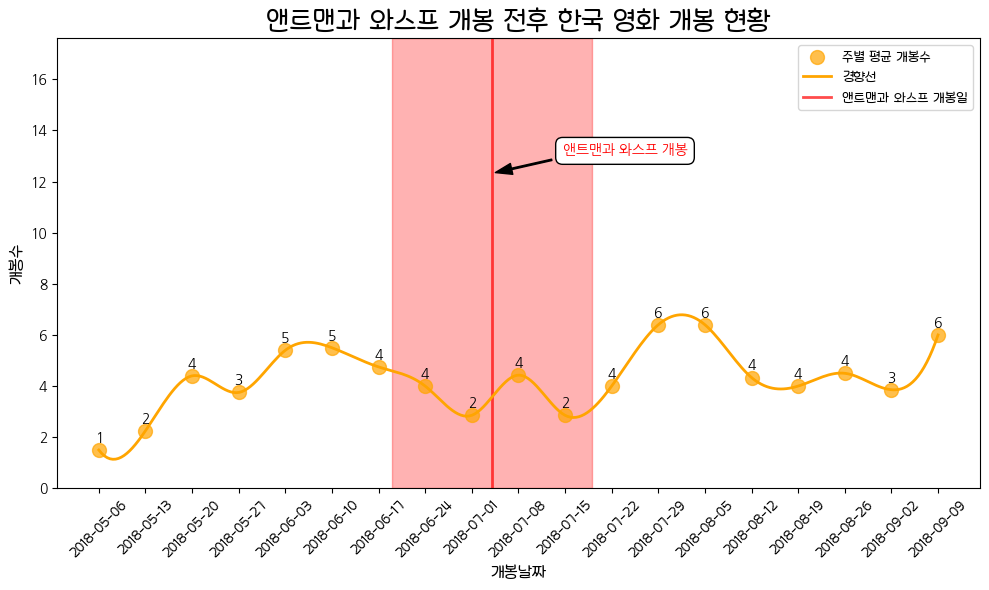

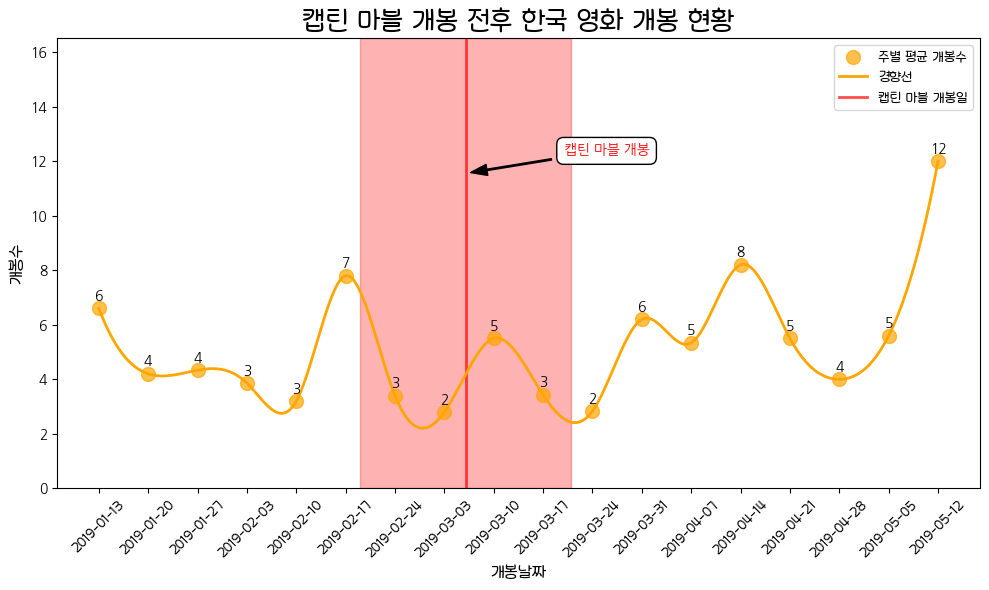

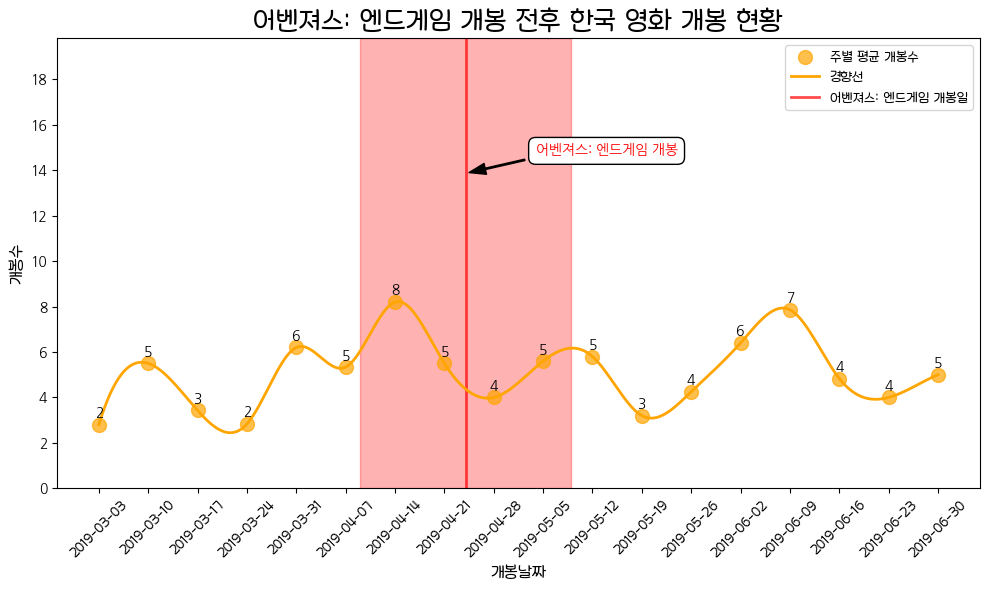

In [135]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 4. 폰트 설정 (경로를 자신의 환경에 맞게 설정)
    font_path = '/home/jieun/Downloads/학교안심 둥근미소/Hakgyoansim Dunggeunmiso TTF R.ttf'
    fontprop = fm.FontProperties(fname=font_path)

    # 5. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 6. 주별 평균 개봉 수를 점으로 그리기 (zorder 설정)
    plt.scatter(weekly_avg['date'], 
                weekly_avg['title_count'], 
                color='orange', 
                label='주별 평균 개봉수', 
                s=100, alpha=0.7, zorder=3)  # zorder를 3으로 설정



    # 7. 점들을 곡선으로 부드럽게 이어주기
    # x축 (date를 숫자로 변환)
    x = np.arange(len(weekly_avg['date']))
    y = weekly_avg['title_count']

    # 곡선으로 부드럽게 이어주는 부분
    spline = make_interp_spline(x, y)
    x_smooth = np.linspace(x.min(), x.max(), 300)  # 300개의 점으로 곡선을 부드럽게 만들기
    y_smooth = spline(x_smooth)

    # 부드러운 곡선 그리기 (x_smooth를 원래 date 값으로 매핑)
    dates_smooth = np.linspace(weekly_avg['date'].min().value, weekly_avg['date'].max().value, 300)
    dates_smooth = pd.to_datetime(dates_smooth)  # 숫자로 된 timestamp를 다시 datetime으로 변환
    plt.plot(dates_smooth, y_smooth, color='orange', label='경향선', linewidth=2, zorder=2)  # zorder를 2로 설정

    # 7. 각 점 위에 주별 평균 값 표시 (소수점 제거)
    for idx, row in weekly_avg.iterrows():
        plt.text(row['date'], row['title_count'] + 0.2,  # y축 위치를 살짝 올려서 텍스트와 점이 겹치지 않도록
                 f'{int(row["title_count"])}',  # 소수점 제거
                 color='black', 
                 ha='center', 
                 va='bottom', 
                 fontsize=10, zorder=4)  # zorder를 4로 설정하여 텍스트가 점 위에 표시되도록 설정


    # 8. 빨간색 직선 추가 (마블 영화 개봉일 기준)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기

    # x축에 마블 영화 개봉일을 직선으로 표시
    plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일', zorder=1)

    # 9. 영역 채우기 (투명한 연한 빨간색으로)
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후

    # y축 범위를 자동으로 설정하는 대신 최대값에 약간의 여유를 두도록 조정
    max_y = max(date_count_kmovies['title_count']) * 1.1  # y축 최대값에 10% 여유 추가
    plt.ylim(0, max_y)  # y축 범위 설정

    plt.fill_betweenx([0, max_y],  # y축의 최소값과 최대값을 가져옴
                      highlight_start, 
                      highlight_end, 
                      color='red', 
                      alpha=0.3, zorder=0)  # zorder를 0으로 설정

    # 10. 텍스트 추가 (마블 영화 개봉일 설명)
    plt.annotate(f'{marvel_title} 개봉',
             xy=(marvel_date, max_y * 0.7),  # 화살표가 가리킬 점 (x, y 좌표)
             xytext=(marvel_date + pd.Timedelta(days=20), max_y * 0.75),  # 텍스트가 화살표 가운데에 위치하도록 조정
             arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=8),  # 화살표 설정
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'),  # 텍스트 박스 설정
             fontsize=10, color='red', zorder=4,
             ha='center', va='center')  # 텍스트 상자를 중앙 정렬
    # new_x_position = marvel_date + pd.Timedelta(days=6.5)
    # plt.text(new_x_position, 
    #          max_y * 0.7, 
    #          f'{marvel_title} 개봉', 
    #          color='red', 
    #          fontsize=10, 
    #          rotation=0, 
    #          ha='center', 
    #          va='center', 
    #          alpha=0.8, zorder=4,
    #          bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.5'))  # zorder를 4로 설정하여 텍스트가 가장 위로

    # x축을 주별로 포맷
    # plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator())  # x축을 주 단위로
    # plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # 날짜 형식을 'YYYY-MM-DD'으로
    plt.xticks(ticks=weekly_avg['date'], labels=weekly_avg['date'].dt.strftime('%Y-%m-%d'), rotation=0)
    
    # 11. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황',
              fontproperties=fontprop , 
              fontsize=20
            )
    plt.xlabel('개봉날짜', 
               fontproperties=fontprop,
               fontsize=12)
    plt.ylabel('개봉수', 
               fontproperties=fontprop, 
               fontsize=12)
    plt.xticks(rotation=45, fontproperties=fontprop)  # x축의 날짜를 45도 회전

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 12. 그래프 레이아웃 설정
    plt.tight_layout()


    # 13. 범례 추가
    plt.legend(prop=fontprop)
    plt.legend(prop=fontprop, loc='upper right')

    # 14. 그래프 출력
    plt.savefig(f'{marvel_title}_전후_영화개봉현황.png')
    plt.show() 

In [75]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 5. 곡선으로 점들을 잇는 그래프 그리기
    plt.figure(figsize=(10, 6))

    # 6. 주별 평균 개봉 수를 점으로 그리기 (zorder 설정)
    plt.scatter(weekly_avg['date'], 
                weekly_avg['title_count'], 
                color='orange', 
                label='주별 평균 개봉수', 
                s=100, alpha=0.7, zorder=3)  # zorder를 3으로 설정

    # 7. 각 점 위에 주별 평균 값 표시 (소수점 제거)
    for idx, row in weekly_avg.iterrows():
        plt.text(row['date'], row['title_count'] + 0.2,  # y축 위치를 살짝 올려서 텍스트와 점이 겹치지 않도록
                 f'{int(row["title_count"])}',  # 소수점 제거
                 color='black', 
                 ha='center', 
                 va='bottom', 
                 fontsize=10, zorder=4)  # zorder를 4로 설정하여 텍스트가 점 위에 표시되도록 설정

    # 8. 점들을 곡선으로 부드럽게 이어주기
    # x축 (date를 숫자로 변환)
    x = np.arange(len(weekly_avg['date']))
    y = weekly_avg['title_count']

    # 곡선으로 부드럽게 이어주는 부분
    spline = make_interp_spline(x, y)
    x_smooth = np.linspace(x.min(), x.max(), 300)  # 300개의 점으로 곡선을 부드럽게 만들기
    y_smooth = spline(x_smooth)

    # 부드러운 곡선 그리기 (x_smooth를 원래 date 값으로 매핑)
    dates_smooth = np.linspace(weekly_avg['date'].min().value, weekly_avg['date'].max().value, 300)
    dates_smooth = pd.to_datetime(dates_smooth)  # 숫자로 된 timestamp를 다시 datetime으로 변환
    plt.plot(dates_smooth, y_smooth, color='orange', label='경향선', linewidth=2, zorder=2)  # zorder를 2로 설정

    # 9. 빨간색 직선 추가 (마블 영화 개봉일 기준)
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기

    # x축에 마블 영화 개봉일을 직선으로 표시
    plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일', zorder=1)

    # 10. 영역 채우기 (투명한 연한 빨간색으로)
    highlight_start = marvel_date - pd.Timedelta(days=15)  # 15일 전
    highlight_end = marvel_date + pd.Timedelta(days=15)    # 15일 후

    # y축 범위를 자동으로 설정하는 대신 최대값에 약간의 여유를 두도록 조정
    max_y = max(date_count_kmovies['title_count']) * 1.1  # y축 최대값에 10% 여유 추가
    plt.ylim(0, max_y)  # y축 범위 설정

    plt.fill_betweenx([0, max_y],  # y축의 최소값과 최대값을 가져옴
                      highlight_start, 
                      highlight_end, 
                      color='red', 
                      alpha=0.3, zorder=0)  # zorder를 0으로 설정

    # 11. 텍스트 추가 (마블 영화 개봉일 설명)
    new_x_position = marvel_date + pd.Timedelta(days=6.5)
    plt.text(new_x_position, 
             max_y * 0.7, 
             f'{marvel_title} 개봉', 
             color='red', 
             fontsize=10, 
             rotation=45, 
             ha='center', 
             va='center', 
             alpha=0.8, zorder=4)  # zorder를 4로 설정하여 텍스트가 가장 위로

    # x축을 주별로 포맷
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator())  # x축을 주 단위로
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # 날짜 형식을 'YYYY-MM-DD'으로

    # 12. 그래프 제목 및 라벨 설정
    plt.title(f'{marvel_title} 개봉 전후 한국 영화 개봉 현황', 
              fontsize=20, 
              fontproperties=font_eb,
              weight='bold')
    plt.xlabel('개봉날짜', 
               fontsize=12, 
               fontproperties=font_r)
    plt.ylabel('개봉수', 
               fontsize=12, 
               fontproperties=font_r)
    plt.xticks(rotation=45, fontproperties=font_r)  # x축의 날짜를 45도 회전

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

    # 13. 그래프 레이아웃 설정
    plt.tight_layout()

    # 14. 범례 추가
    plt.legend(fontproperties=font_r, loc='upper right')

    # 15. 그래프 출력
    plt.show()


TypeError: Legend.__init__() got an unexpected keyword argument 'fontproperties'

Error in callback <function _draw_all_if_interactive at 0x707c35749cf0> (for post_execute), with arguments args (),kwargs {}:


FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

FileNotFoundError: [Errno 2] No such file or directory: '/home/jieun/ws/data/TTF/NanumSquareNeo-bRg.ttf'

<Figure size 1000x600 with 1 Axes>

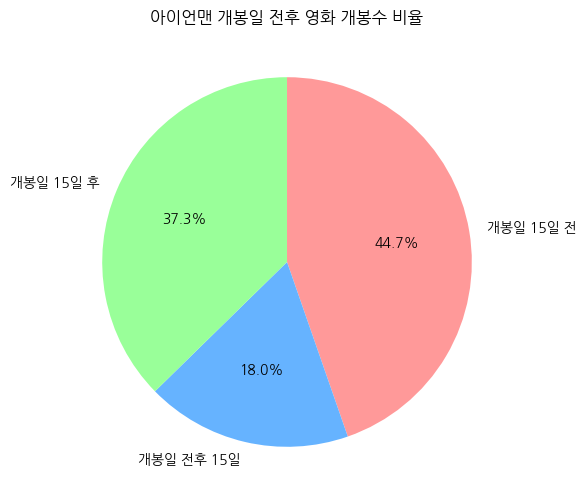

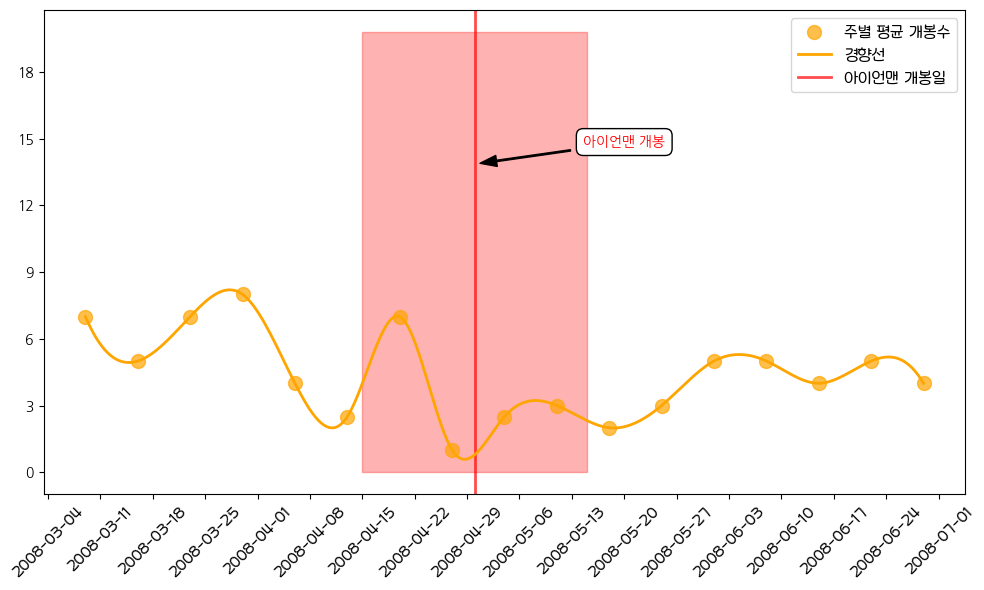

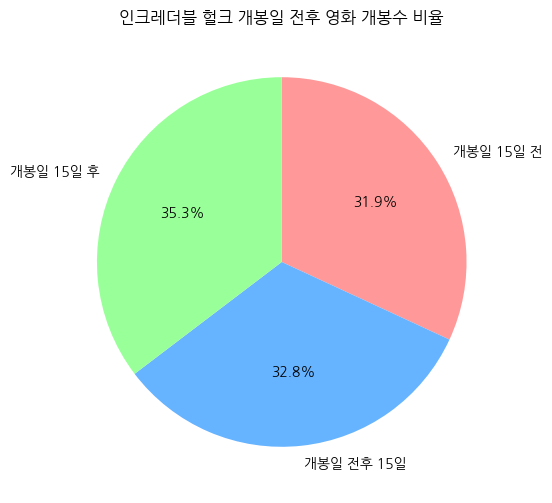

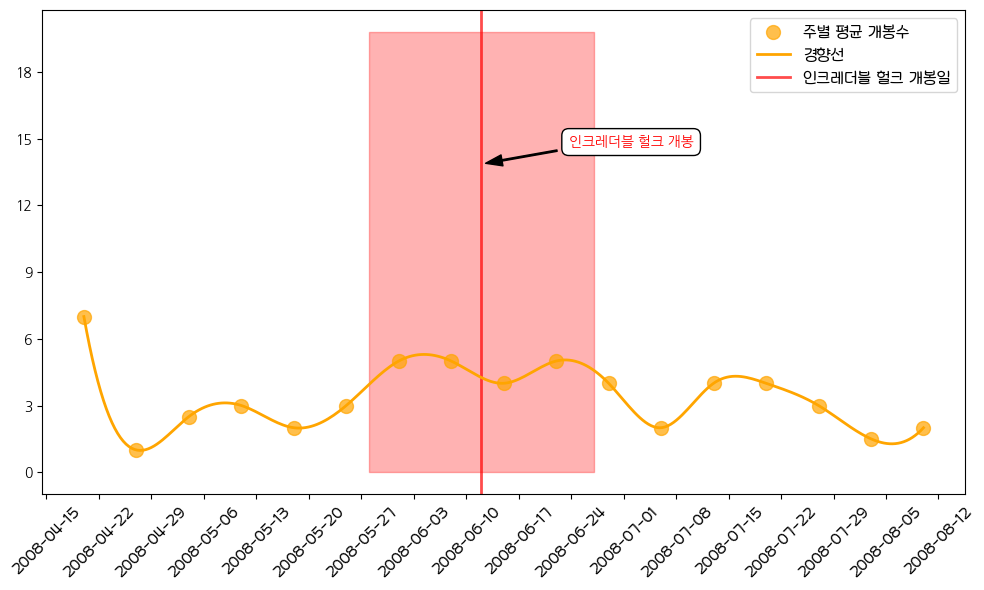

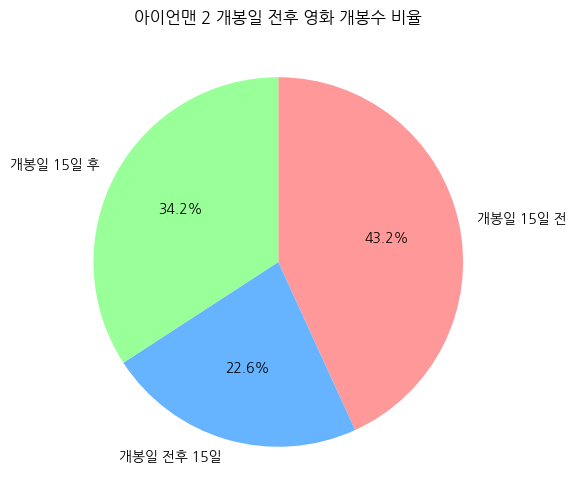

...

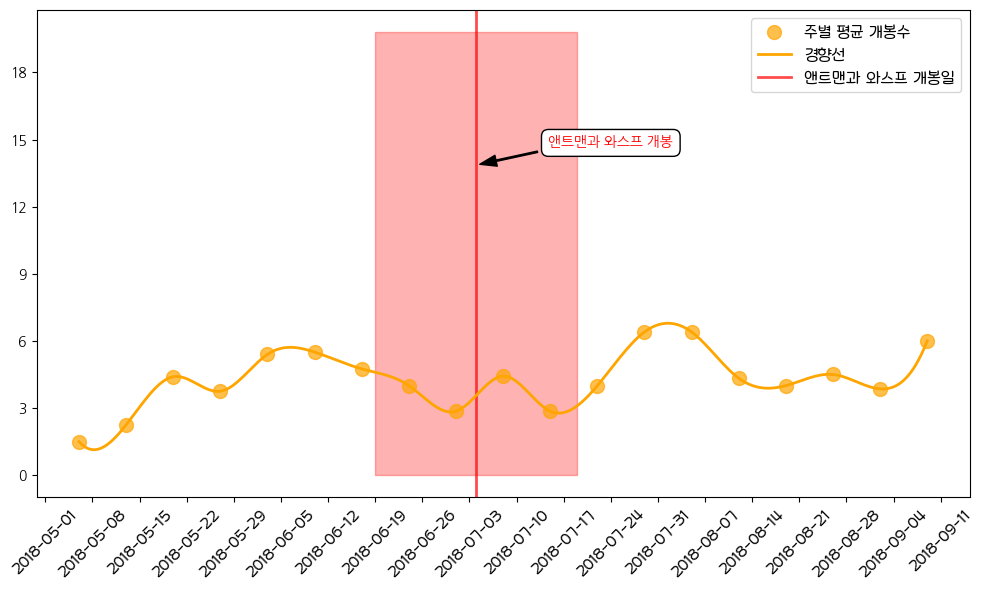

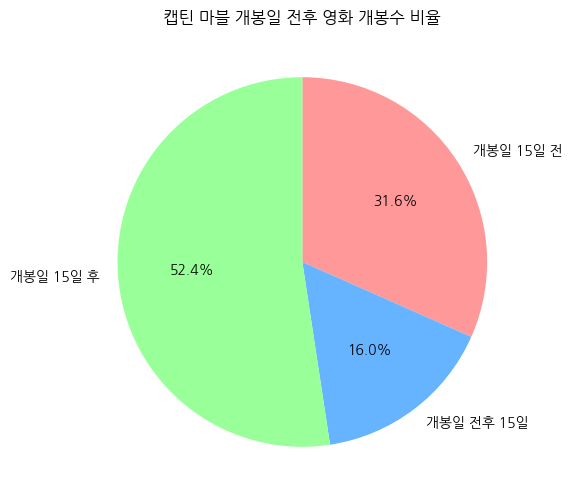

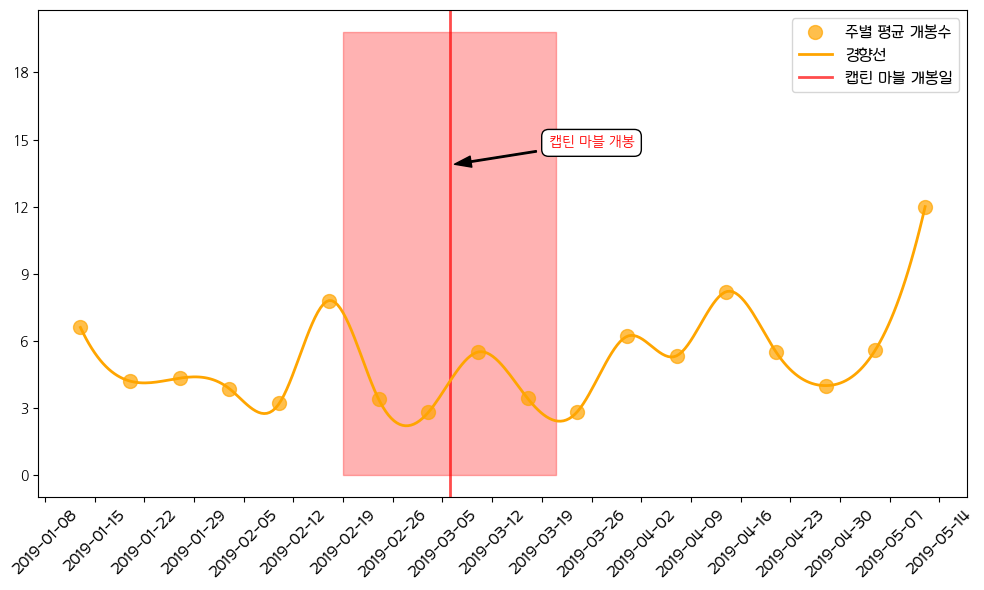

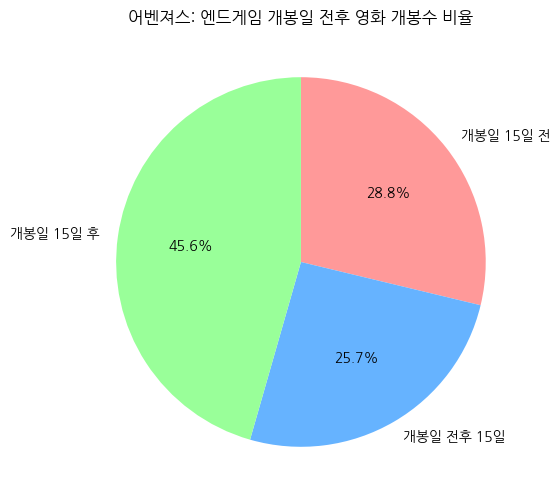

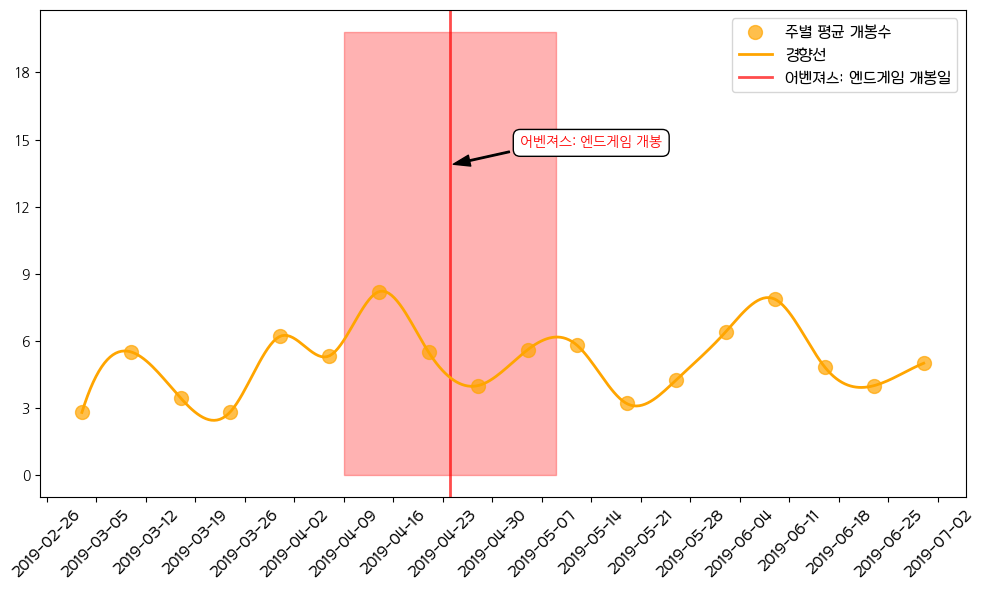

In [17]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 4. 마블 영화 개봉일 가져오기
    marvel_date = pd.to_datetime(marvel_dates.iloc[i])  # koreanMovies_marvel에서 개봉일 가져오기
    marvel_title = marvel_titles.iloc[i]  # koreanMovies_marvel에서 영화 제목 가져오기

    # 5. 마블 영화 개봉일 기준으로 데이터를 나눔
    highlight_start = marvel_date - pd.Timedelta(days=15)
    highlight_end = marvel_date + pd.Timedelta(days=15)

    # 개봉일 15일 전까지
    left_side = weekly_avg[weekly_avg['date'] < highlight_start]['title_count'].sum()
    
    # 개봉일 전후 15일 동안 (영역 채우기된 부분)
    middle_section = weekly_avg[(weekly_avg['date'] >= highlight_start) & (weekly_avg['date'] <= highlight_end)]['title_count'].sum()
    
    # 개봉일 15일 후부터
    right_side = weekly_avg[weekly_avg['date'] > highlight_end]['title_count'].sum()

    # 6. 파이 차트 그리기
    labels = ['개봉일 15일 전', '개봉일 전후 15일', '개봉일 15일 후']
    sizes = [left_side, middle_section, right_side]
    colors = ['#ff9999', '#66b3ff', '#99ff99']  # 색상 지정

    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, counterclock=False)
    plt.title(f'{marvel_title} 개봉일 전후 영화 개봉수 비율')
    plt.show()

    # 그래프 출력 이후 추가적인 코드 (점들 연결 및 강조된 영역 표시)
    plt.figure(figsize=(10, 6))

    # 주별 평균 개봉 수를 점으로 그리기 (zorder 설정)
    plt.scatter(weekly_avg['date'], 
                weekly_avg['title_count'], 
                color='orange', 
                label='주별 평균 개봉수', 
                s=100, alpha=0.7, zorder=3)  # zorder를 3으로 설정

    # 곡선으로 부드럽게 이어주는 부분 (위 코드 그대로)
    x = np.arange(len(weekly_avg['date']))
    y = weekly_avg['title_count']
    spline = make_interp_spline(x, y)
    x_smooth = np.linspace(x.min(), x.max(), 300)
    y_smooth = spline(x_smooth)
    dates_smooth = np.linspace(weekly_avg['date'].min().value, weekly_avg['date'].max().value, 300)
    dates_smooth = pd.to_datetime(dates_smooth)
    plt.plot(dates_smooth, y_smooth, color='orange', label='경향선', linewidth=2, zorder=2)

    # 마블 영화 개봉일을 직선으로 표시
    plt.axvline(x=marvel_date, color='red', linestyle='-', alpha=0.7, linewidth=2, label=f'{marvel_title} 개봉일', zorder=1)

    # 영역 채우기 (투명한 연한 빨간색으로)
    plt.fill_betweenx([0, max_y], highlight_start, highlight_end, color='red', alpha=0.3, zorder=0)

    # 텍스트 추가 (마블 영화 개봉일 설명)
    plt.annotate(f'{marvel_title} 개봉', xy=(marvel_date, max_y * 0.7),
                 xytext=(marvel_date + pd.Timedelta(days=20), max_y * 0.75),
                 arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=8),
                 bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'),
                 fontsize=10, color='red', zorder=4, ha='center', va='center')

    # x축을 주별로 포맷
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator())  # x축을 주 단위로
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # 날짜 형식을 'YYYY-MM-DD'으로
    plt.xticks(rotation=45, fontproperties=fontprop)  # x축의 날짜를 45도 회전

    # y축을 정수로만 표시되도록 설정
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.tight_layout()

    # 범례 추가
    plt.legend(prop=fontprop)
    plt.show()


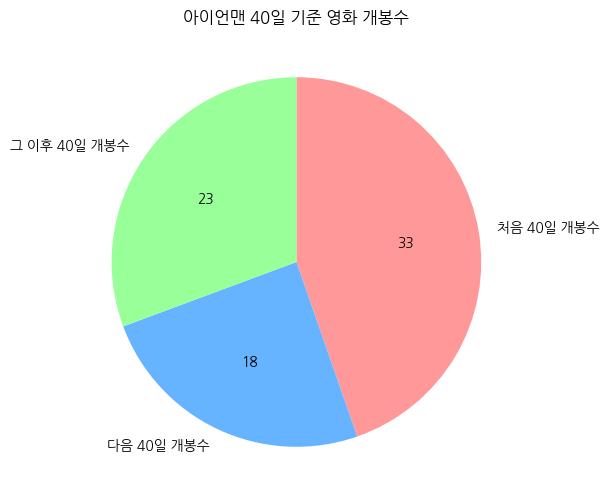

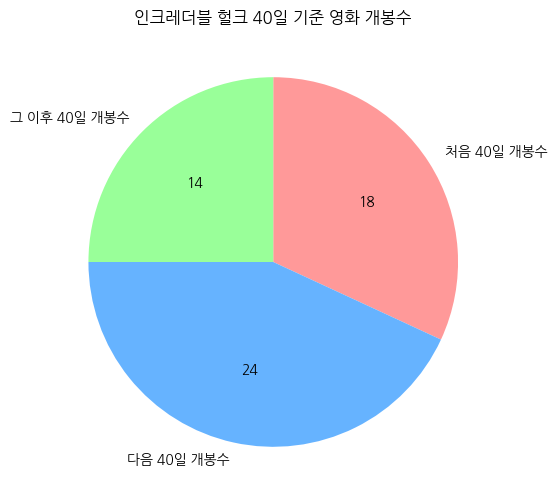

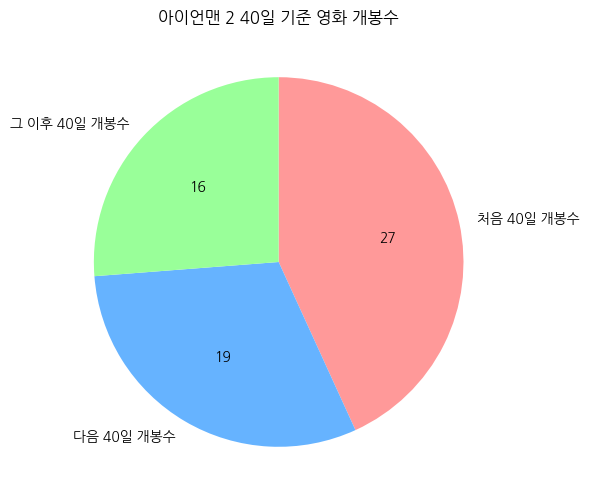

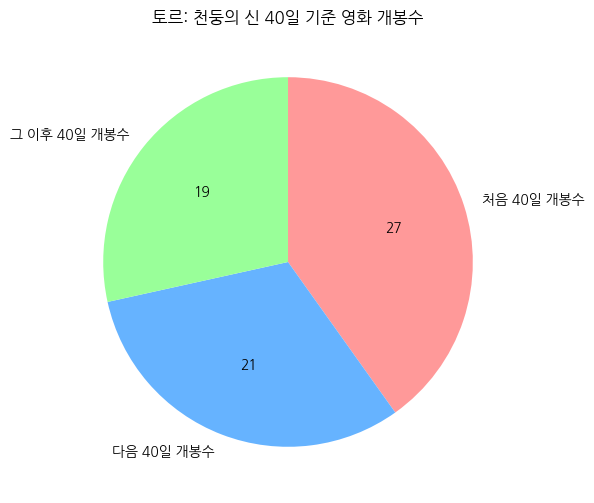

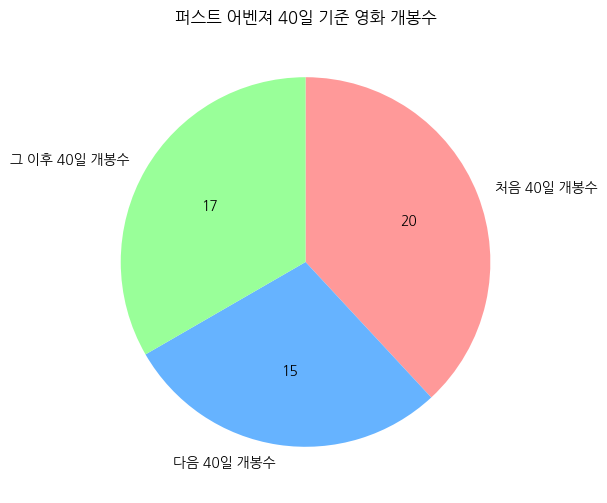

...

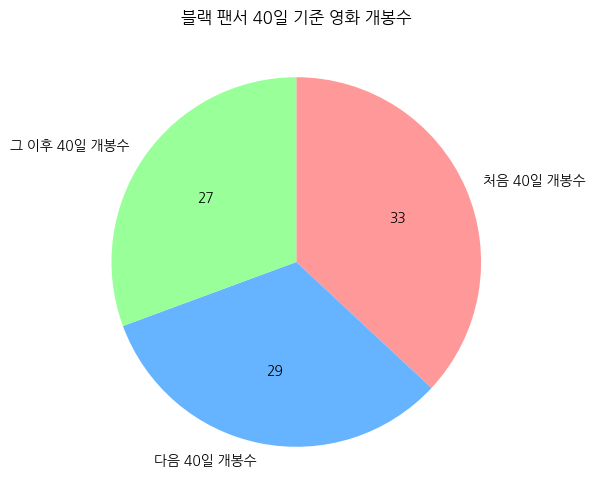

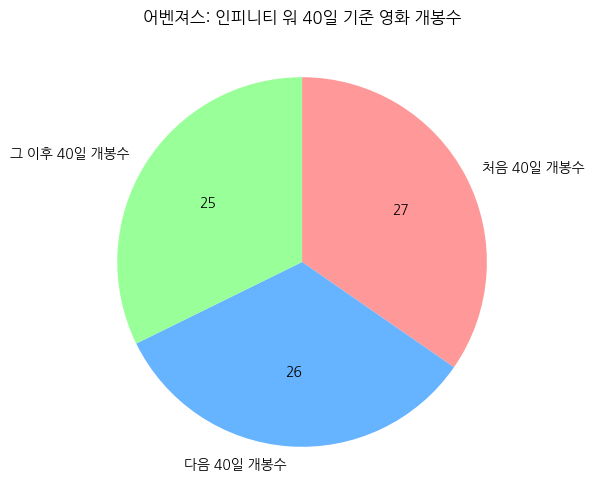

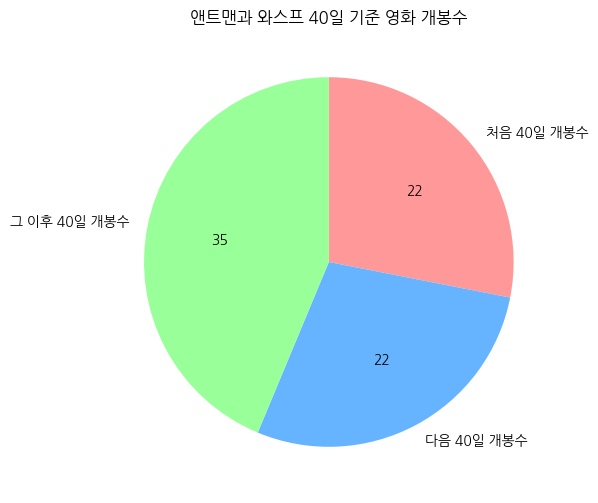

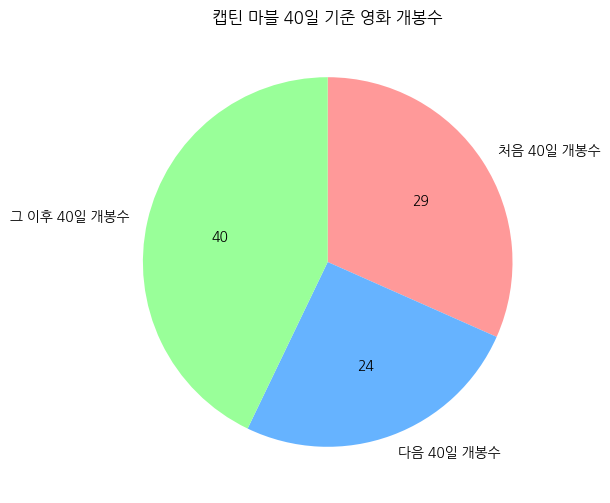

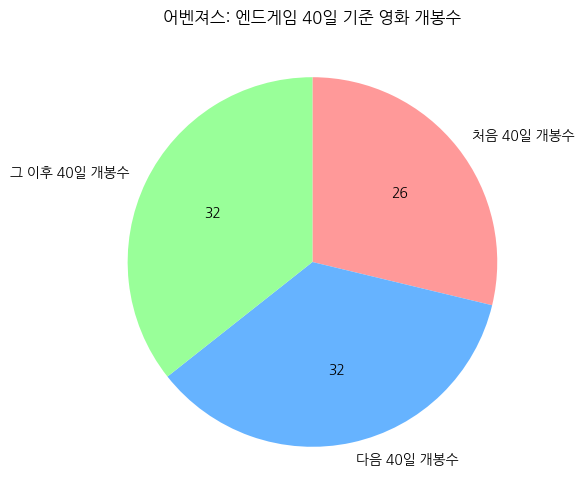

In [137]:
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 4. 데이터를 40일 간격으로 나눔
    start_date = weekly_avg['date'].min()  # 데이터의 시작 날짜
    interval = pd.Timedelta(days=40)

    # 구역 1: 처음 40일
    first_40_days_avg = weekly_avg[(weekly_avg['date'] >= start_date) & (weekly_avg['date'] < start_date + interval)]['title_count'].sum()

    # 구역 2: 다음 40일
    second_40_days_avg = weekly_avg[(weekly_avg['date'] >= start_date + interval) & (weekly_avg['date'] < start_date + 2 * interval)]['title_count'].sum()

    # 구역 3: 그 이후 40일
    third_40_days_avg = weekly_avg[(weekly_avg['date'] >= start_date + 2 * interval)]['title_count'].sum()

    # 5. 파이 차트 그리기 (구역별 평균을 파이 차트로 표현)
    labels = ['처음 40일 개봉수', '다음 40일 개봉수', '그 이후 40일 개봉수']
    sizes = [first_40_days_avg, second_40_days_avg, third_40_days_avg]
    colors = ['#ff9999', '#66b3ff', '#99ff99']  # 색상 지정

    plt.figure(figsize=(6, 6))

    # 개봉수 숫자를 파이 차트에 표시
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        return "{:d}".format(absolute)

    plt.pie(sizes, labels=labels, colors=colors, autopct=lambda pct: func(pct, sizes), startangle=90, counterclock=False)
    plt.title(f'{marvel_titles.iloc[i]} 40일 기준 영화 개봉수')
    plt.show()

In [ ]:

# 기준 날짜 설정 (예: 아이언맨 개봉일) base_date = pd.to_datetime("2008-05-02") 
# # 2개월 전과 2개월 후 설정 (pandas의 DateOffset을 사용) start_date = base_date - pd.DateOffset(months=2) # 2개월 전 end_date = base_date + pd.DateOffset(months=2) # 2개월 후# 전체 기간 계산 total_days = (end_date - start_date).days # 총 일 수 계산# 3등분 날짜 구하기 interval = total_days // 3  # 3등분한 간격# 각각의 날짜 계산 first_split = start_date + timedelta(days=interval) # 첫 번째 분할 second_split = first_split + timedelta(days=interval) # 두 번째 분할# 출력print(f"기준 날짜: {base_date}") print(f"2개월 전: {start_date}") print(f"2개월 후: {end_date}") print(f"첫 번째 구간 끝: {first_split}") print(f"두 번째 구간 끝: {second_split}") print(f"마지막 구간 끝: {end_date}")

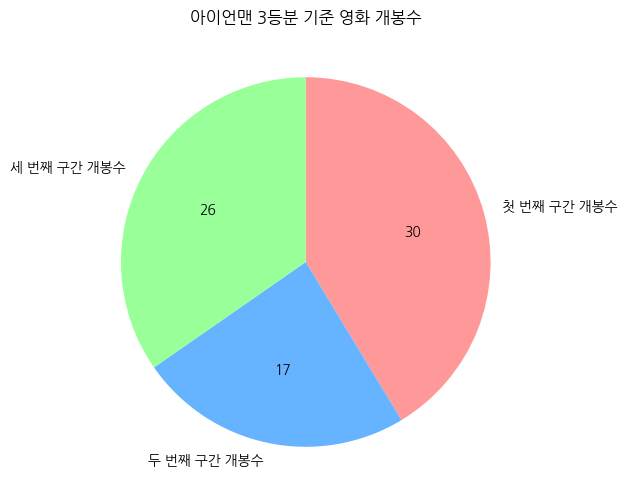

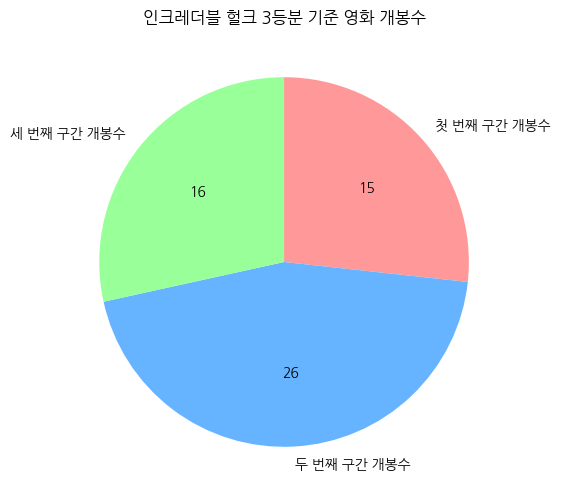

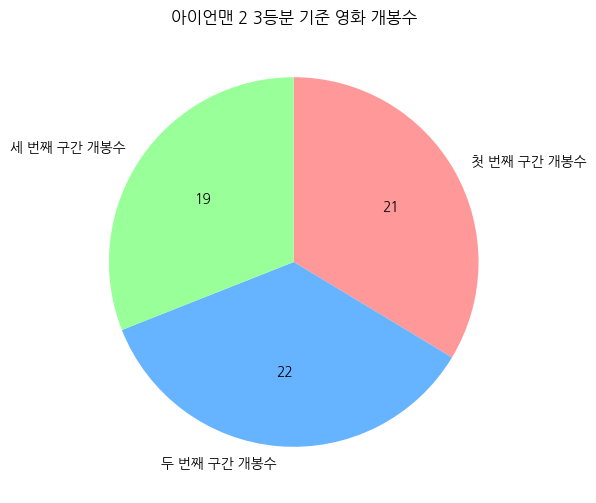

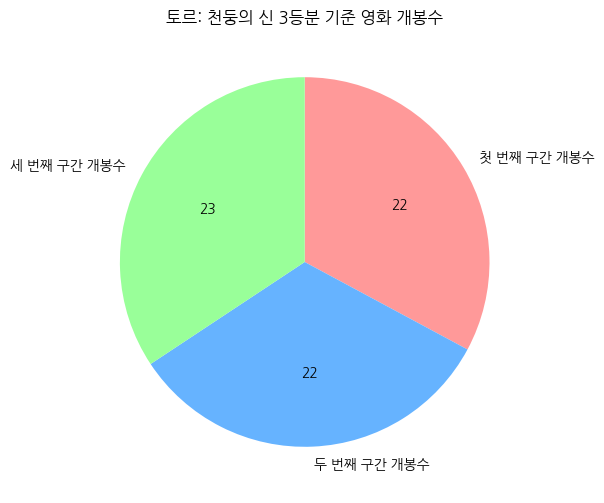

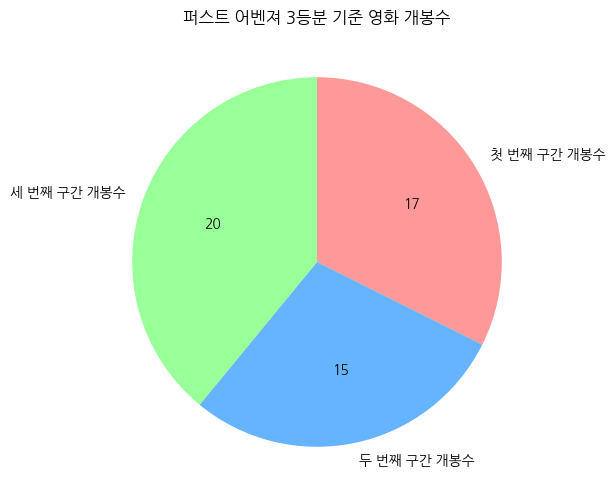

...

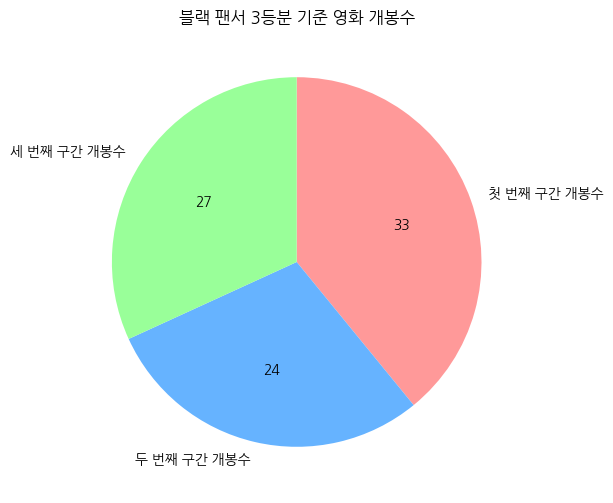

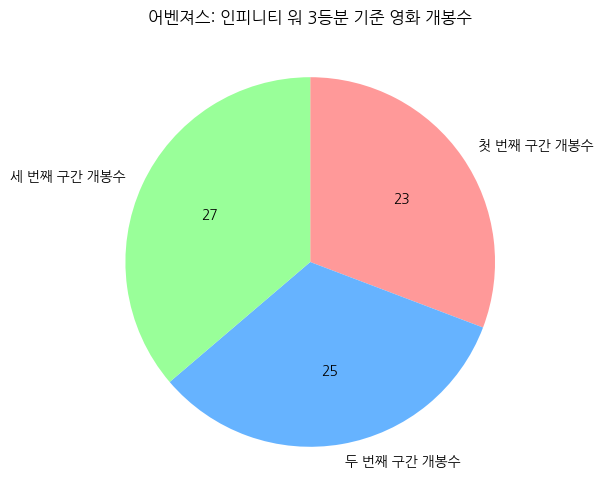

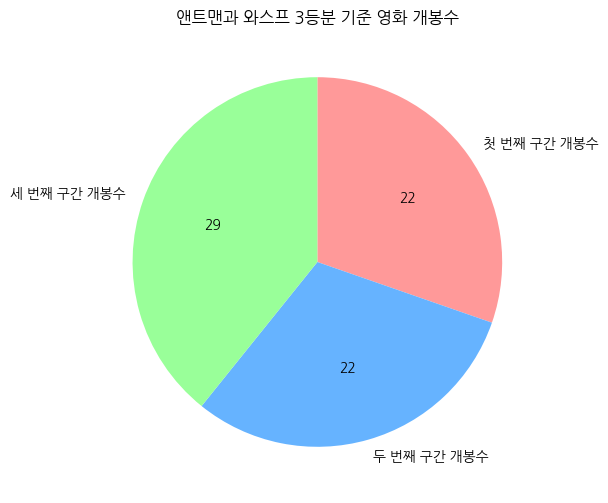

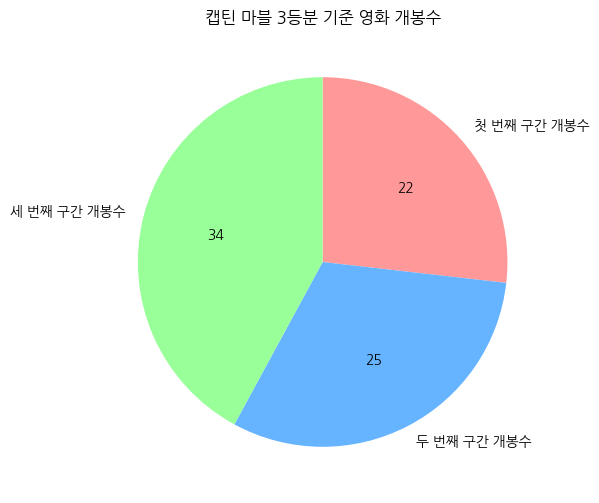

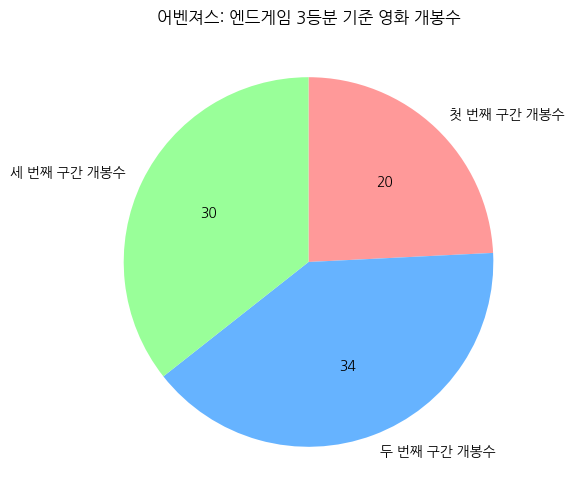

22 22 22


In [18]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

first_zone_avg_list=[]
second_zone_avg_list=[]
third_zone_avg_list=[]

# 이제 이 리스트를 사용해서 그래프를 그릴 수 있습니다.
for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 4. 기준 날짜 설정 (예: 마블 영화 개봉일)
    base_date = pd.to_datetime(marvel_dates.iloc[i])

    # 2개월 전과 2개월 후 설정
    start_date = base_date - pd.DateOffset(months=2)
    end_date = base_date + pd.DateOffset(months=2)

    # 전체 기간 계산
    total_days = (end_date - start_date).days

    # 3등분 날짜 구하기
    interval = total_days // 3

    # 각각의 날짜 계산
    first_split = start_date + timedelta(days=interval)
    second_split = first_split + timedelta(days=interval)

    # 구역 1: 처음 구간
    first_zone_avg = weekly_avg[(weekly_avg['date'] >= start_date) & (weekly_avg['date'] < first_split)]['title_count'].sum()

    # 구역 2: 두 번째 구간
    second_zone_avg = weekly_avg[(weekly_avg['date'] >= first_split) & (weekly_avg['date'] < second_split)]['title_count'].sum()

    # 구역 3: 세 번째 구간
    third_zone_avg = weekly_avg[(weekly_avg['date'] >= second_split) & (weekly_avg['date'] <= end_date)]['title_count'].sum()

    # 5. 파이 차트 그리기 (구역별 개봉수)
    labels = ['첫 번째 구간 개봉수', '두 번째 구간 개봉수', '세 번째 구간 개봉수']
    sizes = [first_zone_avg, second_zone_avg, third_zone_avg]
    colors = ['#ff9999', '#66b3ff', '#99ff99']  # 색상 지정


    first_zone_avg_list.append(first_zone_avg)
    second_zone_avg_list.append(second_zone_avg)
    third_zone_avg_list.append(third_zone_avg)


    plt.figure(figsize=(6, 6))

    # 개봉수 숫자를 파이 차트에 표시
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        return "{:d}".format(absolute)

    plt.pie(sizes, labels=labels, colors=colors, autopct=lambda pct: func(pct, sizes), startangle=90, counterclock=False)
    plt.title(f'{marvel_titles.iloc[i]} 3등분 기준 영화 개봉수')
    plt.show()

print(len(first_zone_avg_list), len(second_zone_avg_list), len(third_zone_avg_list))

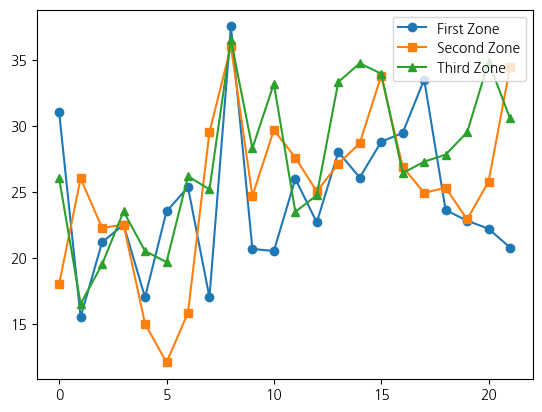

In [20]:
plt.plot(first_zone_avg_list, label='First Zone', marker='o')

# 두 번째 리스트 플롯
plt.plot(second_zone_avg_list, label='Second Zone', marker='s')

# 세 번째 리스트 플롯
plt.plot(third_zone_avg_list, label='Third Zone', marker='^')


# plt.legend(prop=fontprop)
plt.legend(loc='upper right')

plt.savefig('/home/jieun/ws/Marvel/02.png')

# 그래프 화면에 표시
plt.show()

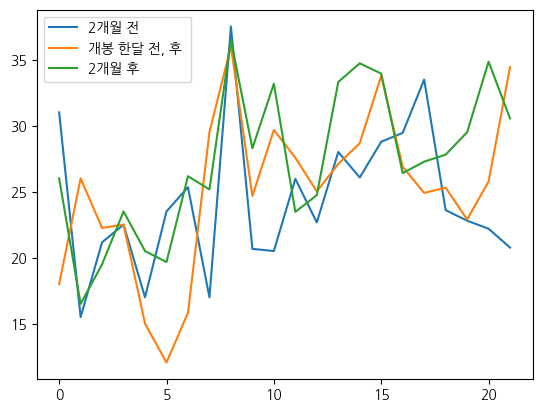

In [21]:
plt.plot(first_zone_avg_list, label='2개월 전') #,marker='o')

# 두 번째 리스트 플롯
plt.plot(second_zone_avg_list, label='개봉 한달 전, 후 ')#, marker='s')

# 세 번째 리스트 플롯
plt.plot(third_zone_avg_list, label='2개월 후') #, marker='^')


# plt.legend(prop=fontprop)
plt.legend()


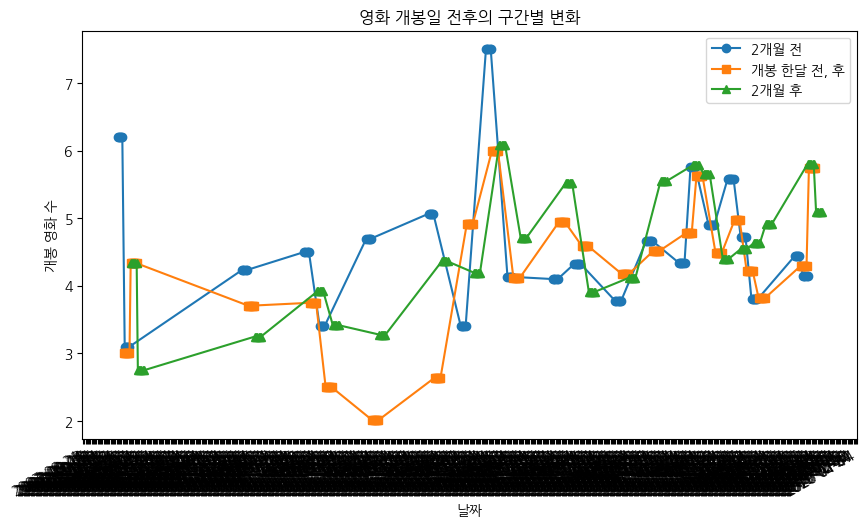

In [40]:
# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 구역별 데이터를 저장할 리스트 초기화
first_zone_avg_list = []
second_zone_avg_list = []
third_zone_avg_list = []
first_zone_dates = []
second_zone_dates = []
third_zone_dates = []

for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 4. 기준 날짜 설정 (예: 마블 영화 개봉일)
    base_date = pd.to_datetime(marvel_dates.iloc[i])

    # 2개월 전과 2개월 후 설정
    start_date = base_date - pd.DateOffset(months=2)
    end_date = base_date + pd.DateOffset(months=2)

    # 전체 기간 계산
    total_days = (end_date - start_date).days

    # 3등분 날짜 구하기
    interval = total_days // 3

    # 각각의 날짜 계산
    first_split = start_date + timedelta(days=interval)
    second_split = first_split + timedelta(days=interval)

    # 구역 1: 처음 구간
    first_zone_data = weekly_avg[(weekly_avg['date'] >= start_date) & (weekly_avg['date'] < first_split)]
    first_zone_avg = first_zone_data['title_count'].mean()
    first_zone_avg_list.extend([first_zone_avg] * len(first_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    first_zone_dates.extend(first_zone_data['date'].values)  # 날짜 리스트 확장

    # 구역 2: 두 번째 구간
    second_zone_data = weekly_avg[(weekly_avg['date'] >= first_split) & (weekly_avg['date'] < second_split)]
    second_zone_avg = second_zone_data['title_count'].mean()
    second_zone_avg_list.extend([second_zone_avg] * len(second_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    second_zone_dates.extend(second_zone_data['date'].values)  # 날짜 리스트 확장

    # 구역 3: 세 번째 구간
    third_zone_data = weekly_avg[(weekly_avg['date'] >= second_split) & (weekly_avg['date'] <= end_date)]
    third_zone_avg = third_zone_data['title_count'].mean()
    third_zone_avg_list.extend([third_zone_avg] * len(third_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    third_zone_dates.extend(third_zone_data['date'].values)  # 날짜 리스트 확장

# x축과 y축 길이 맞추기 완료 후 플롯 그리기
plt.figure(figsize=(10, 6))

# 첫 번째 구역
plt.plot(first_zone_dates, first_zone_avg_list, label='2개월 전', marker='o')

# 두 번째 구역
plt.plot(second_zone_dates, second_zone_avg_list, label='개봉 한달 전, 후', marker='s')

# 세 번째 구역
plt.plot(third_zone_dates, third_zone_avg_list, label='2개월 후', marker='^')

# x축을 날짜로 설정
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d'))  # 날짜 형식 설정
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.WeekdayLocator())  # 매주 x축에 표시
plt.gcf().autofmt_xdate()  # x축 날짜 포맷 조정

# 그래프 제목 및 라벨 설정
plt.title('영화 개봉일 전후의 구간별 변화')
plt.xlabel('날짜')
plt.ylabel('개봉 영화 수')
plt.legend()

plt.show()


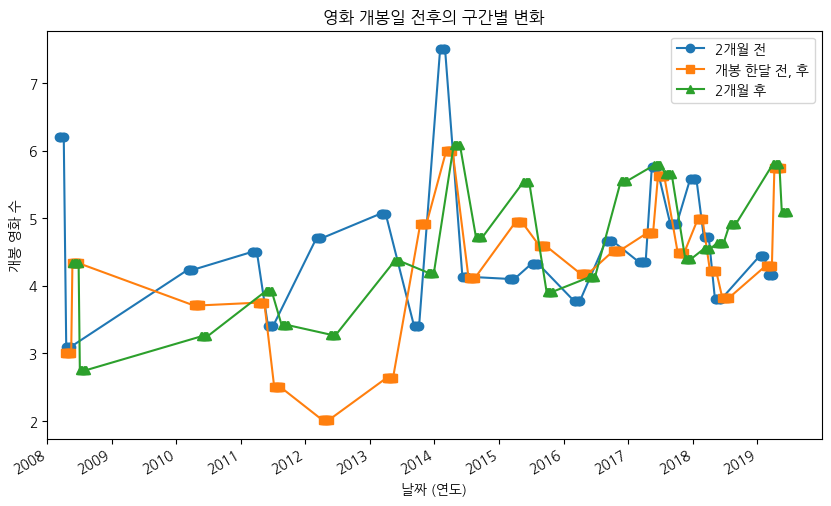

In [16]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates  # 날짜 포맷을 위해 import
import pandas as pd
from datetime import timedelta

# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 구역별 데이터를 저장할 리스트 초기화
first_zone_avg_list = []
second_zone_avg_list = []
third_zone_avg_list = []
first_zone_dates = []
second_zone_dates = []
third_zone_dates = []

for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 4. 기준 날짜 설정 (예: 마블 영화 개봉일)
    base_date = pd.to_datetime(marvel_dates.iloc[i])

    # 2개월 전과 2개월 후 설정
    start_date = base_date - pd.DateOffset(months=2)
    end_date = base_date + pd.DateOffset(months=2)

    # 전체 기간 계산
    total_days = (end_date - start_date).days

    # 3등분 날짜 구하기
    interval = total_days // 3

    # 각각의 날짜 계산
    first_split = start_date + timedelta(days=interval)
    second_split = first_split + timedelta(days=interval)

    # 구역 1: 처음 구간
    first_zone_data = weekly_avg[(weekly_avg['date'] >= start_date) & (weekly_avg['date'] < first_split)]
    first_zone_avg = first_zone_data['title_count'].mean()
    first_zone_avg_list.extend([first_zone_avg] * len(first_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    first_zone_dates.extend(first_zone_data['date'].values)  # 날짜 리스트 확장

    # 구역 2: 두 번째 구간
    second_zone_data = weekly_avg[(weekly_avg['date'] >= first_split) & (weekly_avg['date'] < second_split)]
    second_zone_avg = second_zone_data['title_count'].mean()
    second_zone_avg_list.extend([second_zone_avg] * len(second_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    second_zone_dates.extend(second_zone_data['date'].values)  # 날짜 리스트 확장

    # 구역 3: 세 번째 구간
    third_zone_data = weekly_avg[(weekly_avg['date'] >= second_split) & (weekly_avg['date'] <= end_date)]
    third_zone_avg = third_zone_data['title_count'].mean()
    third_zone_avg_list.extend([third_zone_avg] * len(third_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    third_zone_dates.extend(third_zone_data['date'].values)  # 날짜 리스트 확장

# x축과 y축 길이 맞추기 완료 후 플롯 그리기
plt.figure(figsize=(10, 6))

# 첫 번째 구역
plt.plot(first_zone_dates, first_zone_avg_list, label='2개월 전', marker='o')

# 두 번째 구역
plt.plot(second_zone_dates, second_zone_avg_list, label='개봉 한달 전, 후', marker='s')

# 세 번째 구역
plt.plot(third_zone_dates, third_zone_avg_list, label='2개월 후', marker='^')

# x축을 연도 단위로 설정 (2008년~2020년 범위로 설정)
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # 매년 표시
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # 연도만 표시
plt.gca().set_xlim([pd.Timestamp('2008-01-01'), pd.Timestamp('2019-12-31')])  # x축 범위 설정

# 날짜 라벨을 자동으로 회전시켜 겹치지 않게 함
plt.gcf().autofmt_xdate()

# 그래프 제목 및 라벨 설정
plt.title('영화 개봉일 전후의 구간별 변화')
plt.xlabel('날짜 (연도)')
plt.ylabel('개봉 영화 수')
plt.legend()




# 그래프 저장
plt.savefig('/home/jieun/ws/Marvel/01.png', dpi=300)

# 그래프 화면에 표시
plt.show()

ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 131 and the array at index 1 has size 132

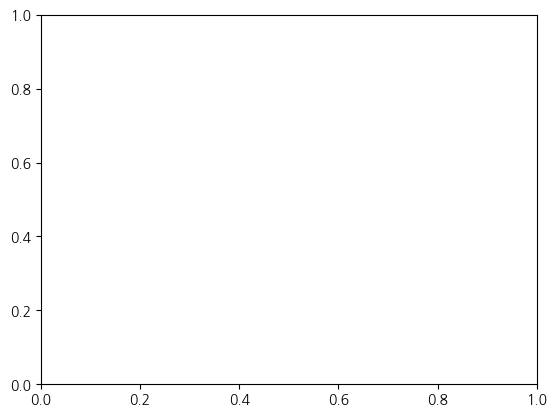

In [11]:
plt.stackplot(first_zone_avg_list,second_zone_avg_list,third_zone_avg_list)
plt.show()

In [17]:
print(len(first_zone_dates))
print(len(second_zone_dates))
print(len(third_zone_dates))

#first_zone_avg_list

117
131
132


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (3,) + inhomogeneous part.

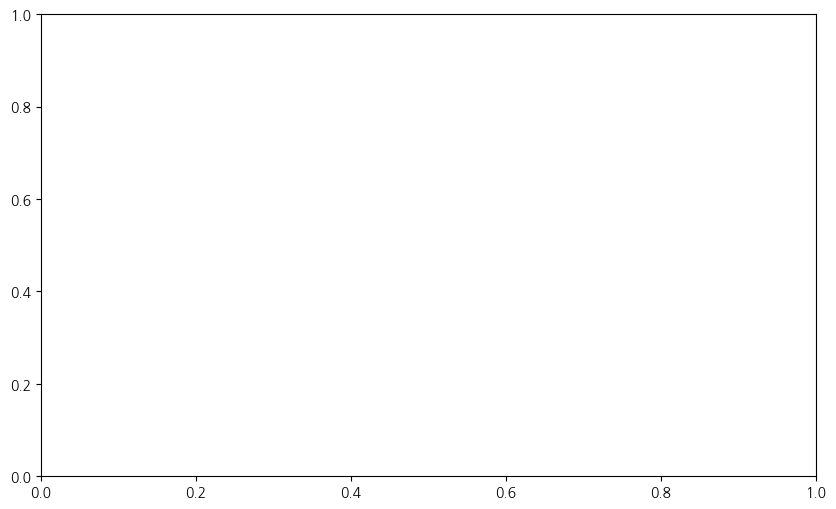

In [33]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates  # 날짜 포맷을 위해 import
import pandas as pd
from datetime import timedelta

# marvel_dates와 marvel_titles를 koreanMovies_marvel에서 추출
marvel_dates = koreanMovies_marvel['date']
marvel_titles = koreanMovies_marvel['title']

# 구역별 데이터를 저장할 리스트 초기화
first_zone_avg_list = []
second_zone_avg_list = []
third_zone_avg_list = []
first_zone_dates = []
second_zone_dates = []
third_zone_dates = []

for i, kmovies_df in enumerate(kmovies_list):
    # 1. date를 datetime 타입으로 변환
    kmovies_df['date'] = pd.to_datetime(kmovies_df['date'])

    # 2. 각 날짜에 해당하는 title 개수 계산
    date_count_kmovies = kmovies_df.groupby('date').size().reset_index(name='title_count')

    # 3. 주별 평균 계산 (날짜를 주별로 묶고 합한 후 평균을 구함)
    weekly_avg = date_count_kmovies.resample('W', on='date').mean().reset_index()

    # 4. 기준 날짜 설정 (예: 마블 영화 개봉일)
    base_date = pd.to_datetime(marvel_dates.iloc[i])

    # 2개월 전과 2개월 후 설정
    start_date = base_date - pd.DateOffset(months=2)
    end_date = base_date + pd.DateOffset(months=2)

    # 전체 기간 계산
    total_days = (end_date - start_date).days

    # 3등분 날짜 구하기
    interval = total_days // 3

    # 각각의 날짜 계산
    first_split = start_date + timedelta(days=interval)
    second_split = first_split + timedelta(days=interval)

    # 구역 1: 처음 구간
    first_zone_data = weekly_avg[(weekly_avg['date'] >= start_date) & (weekly_avg['date'] < first_split)]
    first_zone_avg = first_zone_data['title_count'].mean()
    first_zone_avg_list.extend([first_zone_avg] * len(first_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    first_zone_dates.extend(first_zone_data['date'].values)  # 날짜 리스트 확장

    # 구역 2: 두 번째 구간
    second_zone_data = weekly_avg[(weekly_avg['date'] >= first_split) & (weekly_avg['date'] < second_split)]
    second_zone_avg = second_zone_data['title_count'].mean()
    second_zone_avg_list.extend([second_zone_avg] * len(second_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    second_zone_dates.extend(second_zone_data['date'].values)  # 날짜 리스트 확장

    # 구역 3: 세 번째 구간
    third_zone_data = weekly_avg[(weekly_avg['date'] >= second_split) & (weekly_avg['date'] <= end_date)]
    third_zone_avg = third_zone_data['title_count'].mean()
    third_zone_avg_list.extend([third_zone_avg] * len(third_zone_data))  # 날짜 수와 맞추기 위해 동일한 평균을 추가
    third_zone_dates.extend(third_zone_data['date'].values)  # 날짜 리스트 확장

# x축과 y축 길이 맞추기 완료 후 스택 플롯 그리기
# 날짜 데이터를 x축으로 사용하여 구역 데이터를 스택으로 그립니다.

# x축에 사용할 날짜 데이터 준비 (전체 날짜 리스트 병합)
dates = first_zone_dates + second_zone_dates + third_zone_dates

# y축 값들을 스택 플롯에 사용할 준비
avg_values = [first_zone_avg_list, second_zone_avg_list, third_zone_avg_list]

# 스택 플롯 그리기
plt.figure(figsize=(10, 6))
plt.stackplot(dates, avg_values, labels=['2개월 전', '개봉 한달 전, 후', '2개월 후'], colors=['lightblue', 'lightgreen', 'lightcoral'])

# x축을 연도 단위로 설정 (2008년~2020년 범위로 설정)
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # 매년 표시
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # 연도만 표시
plt.gca().set_xlim([pd.Timestamp('2008-01-01'), pd.Timestamp('2019-12-31')])  # x축 범위 설정

# 날짜 라벨을 자동으로 회전시켜 겹치지 않게 함
plt.gcf().autofmt_xdate()

# 그래프 제목 및 라벨 설정
plt.title('영화 개봉일 전후의 구간별 변화 (스택 플롯)')
plt.xlabel('날짜 (연도)')
plt.ylabel('개봉 영화 수')
plt.legend(loc='upper left')

# 그래프 저장
plt.savefig('/home/jieun/ws/Marvel/stackplot_01.png', dpi=300)

# 그래프 화면에 표시
plt.show()


In [25]:
kmovies_list

[                      title       date country  screen        gross   person
 0                     쿵푸 팬더 2008-06-05      미국     351  30000965000  4673009
 1            강철중: 공공의 적 1-1 2008-06-19      한국     659  28465757767  4300670
 2                      아이언맨 2008-04-30      미국     592  27802744668  4316003
 3   인디아나 존스 4 : 크리스탈 해골의 왕국 2008-05-22      미국     660  26693951667  4136101
 4                       원티드 2008-06-26      미국     446  19258777000  2867594
 ..                      ...        ...     ...     ...          ...      ...
 76            로미오와 줄리엣 결혼하다 2008-04-17     브라질       1      1080500      184
 77               사랑의 추구와 발견 2008-04-17      독일       1       975500      135
 78                    꽃과 뱀2 2008-03-27      일본       1       974000      148
 79               아오이 유우의 편지 2008-06-05      일본       1       946000      258
 80                       흑야 2008-03-13      일본       1       119000       22
 
 [81 rows x 6 columns],
                 title       date coun

TypeError: unhashable type: 'DataFrame'

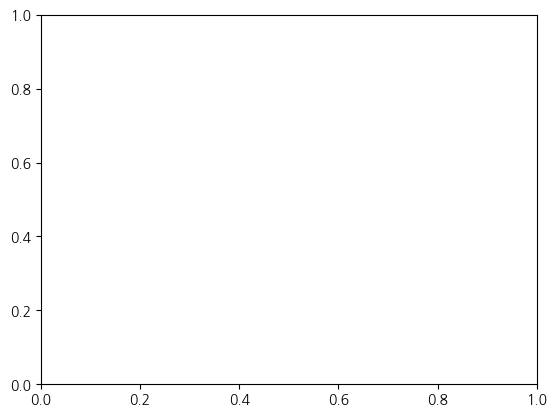

In [24]:
for 

plt.stackplot(kmovies_list, first_zone_avg_list,second_zone_avg_list,third_zone_avg_list)

In [26]:
marvel_Movies

NameError: name 'marvel_Movies' is not defined